In [1]:
import pandas as pd
from yahoo_fin.stock_info import get_data
import matplotlib.pyplot as plt
import numpy as np

# Data Preparation

In [2]:
custom_tickers = [
    "AAPL", "MSFT", "AMZN", "INTC", "ORCL", "CSCO",
    "AMGN", "GILD", "BIIB", "EBAY", 
    "ADBE", "NVDA", "ISRG", "MNST", "REGN", "ILMN", 
    "ORLY", "MAR", "ROST", "ADI", "ADP", "CTSH", "EA", "FAST", "INCY", "INTU",
    "JBHT", "MAT", "MCHP", "NTAP", "PCAR", "TXN", 
    "SIRI", "VRTX", "LRCX", "KLAC", "CSX", "VOD", "PAYX", 
    "REGN", "SHPG", "SRCL", "TSCO", "VRSN", "WBA", "XRAY"
    #"NFLX", "MDLZ" #IPO during period_1 so omit
]
study_periods = [
    ('2001-01-02', '2004-01-06'),
    ('2004-01-06', '2007-01-02'),
    ('2007-01-02', '2010-01-05'),
    ('2010-01-05', '2013-05-14')
]

def calculate_weekly_returns(df):
    weekly_df = df.resample('W').last()
    weekly_df['close'].fillna(method='ffill', inplace=True)
    weekly_df['returns'] = weekly_df['close'].pct_change().fillna(0)
    return weekly_df

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def data_prep(custom_tickers, study_periods):
    # Fetch data for each ticker
    stock_data = {}
    for ticker in custom_tickers:
        try:
            data = get_data(ticker)
            stock_data[ticker] = data
        except AssertionError as e:
            print(f"No data found for {ticker}: {e}")
    weekly_returns_dict = {}

    for ticker, data in stock_data.items():
        data.index = pd.to_datetime(data.index)

        for period_num, (start_date, end_date) in enumerate(study_periods, start=1):
            period_data = data.loc[start_date:end_date]
            period_returns = calculate_weekly_returns(period_data)
            weekly_returns_dict.setdefault(ticker, {})[f'period_{period_num}'] = period_returns
    period_dfs = {}
    # Iterate over the periods
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        # Initialize an empty dictionary to store data for the current period
        period_data = {}

        # Iterate over each ticker's data
        for ticker, data in weekly_returns_dict.items():
            # Drop NaN values from the 'close' column for the current period
            close_prices = data[period][['returns']].dropna()
            period_data[ticker] = close_prices

        # Concatenate the data for all tickers into a single DataFrame for the current period
        period_df = pd.concat(period_data, axis=1)
        period_dfs[period] = period_df.dropna(axis=1)
    correlation_matrices = {}
    for period, period_df in period_dfs.items():
        # Calculate correlation matrix for the current period and store it in the dictionary
        correlation_matrices[period] = period_df.corr()
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)
    return period_dfs, correlation_matrices, distance_matrices

period_dfs, correlation_matrices, distance_matrices = data_prep(custom_tickers, study_periods)

/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Us

### Random Selection

In [3]:
def calculate_metrics_for_random_selection(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 100
 
    for period, returns_data in period_dfs.items():
        returns_data = returns_data.droplevel(1, axis=1)
        results_by_stocks = {}
        stocks_length_list = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlation = []
            selected_stocks_list = {}
            
            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks
               
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                
                mean_std = (portfolio_return_stocks).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            #stocks_length_list[period] = selected_stocks_list
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]
            
            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

num_stocks_list = [2, 4, 8]
result_df_random = calculate_metrics_for_random_selection(period_dfs, num_stocks_list)
result_df_random

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.732476,0.063004,1.444605,0.092510,"[JBHT, MAR, VRTX, SRCL, PCAR, PAYX, ORCL, CSCO..."
period_1 (4 stocks),0.676764,0.050977,1.411167,0.285031,"[NVDA, PCAR, CSCO, INTU, ROST, ADP, INCY, INTC..."
period_1 (8 stocks),0.639323,0.047010,1.404961,0.287856,"[MAR, BIIB, KLAC, LRCX, SIRI, MAT, GILD, TSCO,..."
period_2 (2 stocks),0.973677,0.035515,2.503374,0.099037,"[AMZN, VRTX, AMGN, MAT, INTU, VRSN, INTC, GILD..."
period_2 (4 stocks),1.128468,0.031452,3.354472,0.188697,"[INTU, AMZN, SIRI, CSX, VOD, TSCO, ADBE, KLAC,..."
period_2 (8 stocks),0.840497,0.026971,3.090493,0.220639,"[ADI, BIIB, AMGN, CSX, SIRI, WBA, XRAY, ADBE, ..."
period_3 (2 stocks),0.194921,0.050049,0.395287,0.262152,"[MAR, VOD, SRCL, AMZN, INTC, VRSN, NVDA, ORCL,..."
period_3 (4 stocks),0.214403,0.043355,0.495794,0.396566,"[ADI, ORLY, GILD, JBHT, SRCL, NVDA, INTC, SHPG..."
period_3 (8 stocks),0.246528,0.040982,0.594518,0.416724,"[VRTX, JBHT, FAST, XRAY, CSX, VRSN, CTSH, GILD..."
period_4 (2 stocks),1.326286,0.034608,3.722553,0.502122,"[INTC, MAR, MAR, TSCO, VOD, CSX, FAST, AAPL, E..."


### Hierarchical Clustering

In [4]:
import numpy as np
from scipy.cluster.hierarchy import average, fcluster, linkage
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Function to perform hierarchical clustering and print stocks in each cluster
def hierarchical_clustering(distance_matrix, labels, period):
#    linkage_matrix = average(distance_matrix)
    linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
    labels = [label[0] for label in labels]

    # Set the figure size to be larger
    plt.figure(figsize=(12, 8))  # Adjust the size as needed

    # Plot the dendrogram
    dendrogram(average(distance_matrix), labels=labels, orientation='top')

    # Customize plot title and axis labels
    plt.title(f'Hierarchical Clustering Dendrogram - {period}')
    plt.xlabel('Stocks')
    plt.ylabel('Distance')

    # Create dictionary to store stocks in each cluster for 2, 4, and 8 clusters
    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}
    
    # Perform clustering to get cluster labels for 2, 4, and 8 clusters
    for num_clusters in [2, 4, 8]:
        cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
        
        # Assign stocks to clusters
        for stock, cluster_label in zip(labels, cluster_labels):
            if cluster_label not in cluster_stocks[num_clusters]:
                cluster_stocks[num_clusters][cluster_label] = [stock]
            else:
                cluster_stocks[num_clusters][cluster_label].append(stock)

    # Show the plot
    plt.show()
    
    return cluster_stocks

def HCT(distance_matrices):
    # Create a dictionary to store cluster stocks for each period
    all_cluster_stocks_HCT = {}
    # Perform hierarchical clustering and plot dendrogram for each study period
    for period, distance_matrix in distance_matrices.items():
        all_cluster_stocks_HCT[period] = hierarchical_clustering(distance_matrix.values, distance_matrix.index, period)
    return all_cluster_stocks_HCT

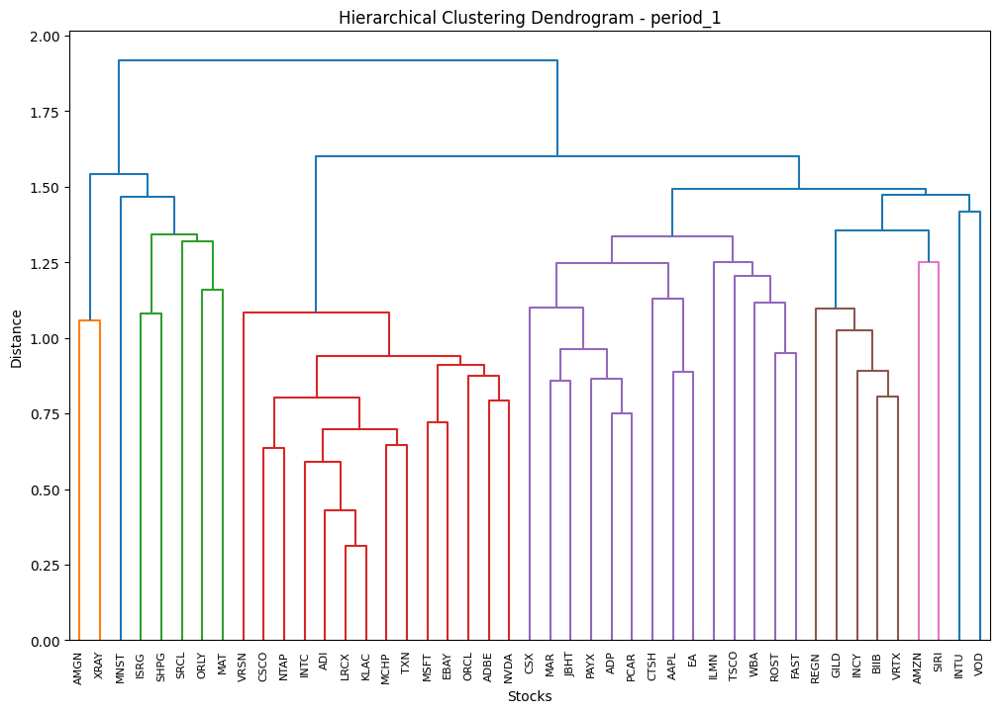

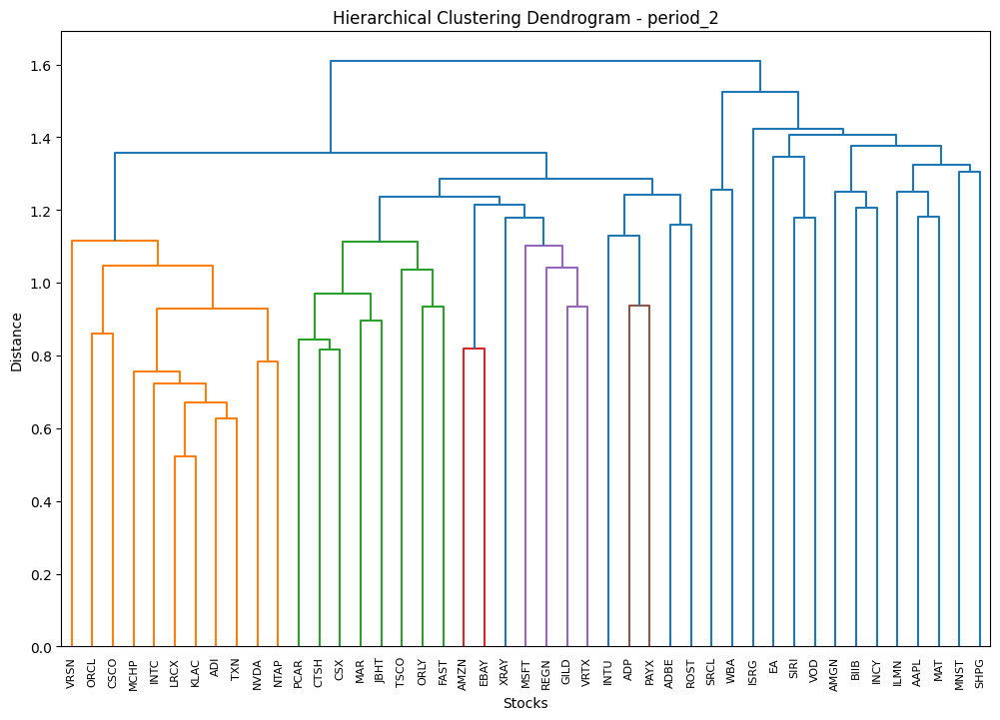

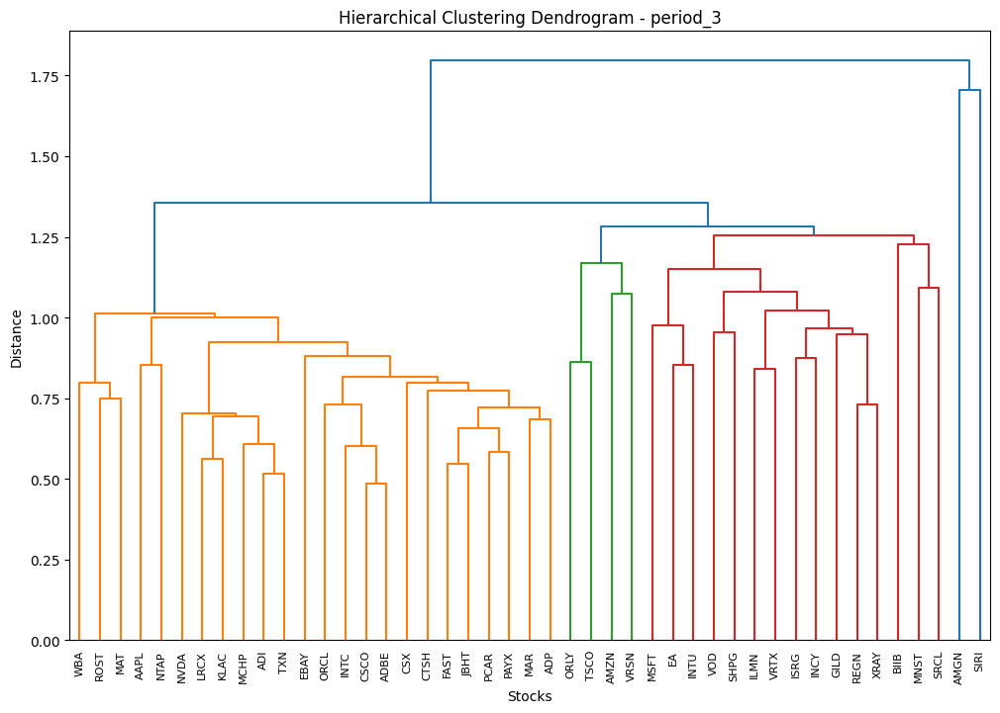

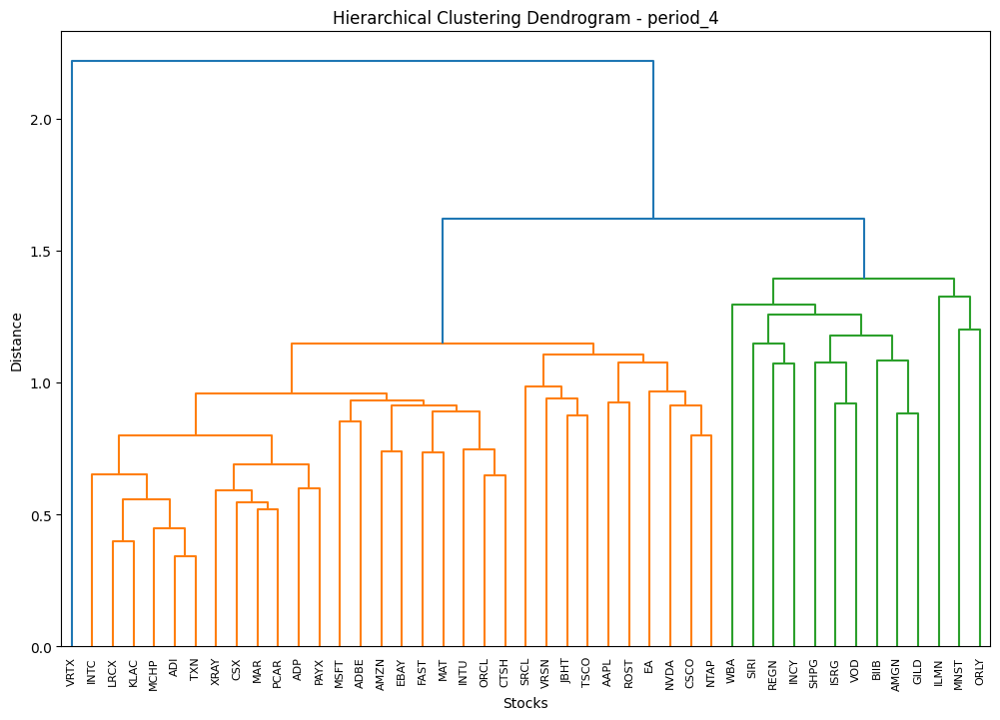

In [5]:
all_cluster_stocks_HCT = HCT(correlation_matrices)

In [6]:
import pandas as pd
import numpy as np

def calculate_metrics_for_all_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100

    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                #print(returns_data[selected_stocks].std())
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(mean_correlation)
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [7]:
result_df_HCT = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT, period_dfs)
result_df_HCT

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.733865,0.064906,1.223567,0.444972,"[VOD, MSFT, SRCL, MCHP, MAR, ADI, FAST, CSCO, ..."
period_1 (4 stocks),0.644698,0.050241,1.368499,0.354165,"[SIRI, EBAY, ORLY, MAR, REGN, NTAP, ILMN, PAYX..."
period_1 (8 stocks),0.742750,0.042070,1.811769,0.232549,"[SIRI, MSFT, INTC, XRAY, REGN, ISRG, FAST, CSX..."
period_2 (2 stocks),1.328035,0.037010,3.000884,0.149623,"[ILMN, INTU, SRCL, ORCL, EA, XRAY, ILMN, ROST,..."
period_2 (4 stocks),0.767434,0.031911,2.350665,0.273467,"[ILMN, INCY, XRAY, TXN, SIRI, INCY, PCAR, ADI,..."
period_2 (8 stocks),0.672803,0.024554,2.665365,0.194390,"[SHPG, REGN, XRAY, MCHP, INTU, CTSH, EA, SRCL,..."
period_3 (2 stocks),0.282055,0.048050,0.577272,0.220638,"[CSCO, INCY, TSCO, VOD, ROST, INCY, ROST, REGN..."
period_3 (4 stocks),0.247866,0.043762,0.566063,0.416660,"[AAPL, SHPG, PAYX, BIIB, NTAP, SHPG, CSCO, MNS..."
period_3 (8 stocks),0.079054,0.040544,0.189250,0.319235,"[INTU, VOD, NVDA, ADP, AMGN, SRCL, WBA, SIRI, ..."
period_4 (2 stocks),1.576482,0.034877,4.460485,0.284624,"[ADP, GILD, AMZN, MNST, JBHT, REGN, ADI, WBA, ..."


### K-Means

In [8]:
from sklearn.cluster import KMeans
import numpy as np

In [9]:
periods = ['period_1','period_2','period_3','period_4']

In [10]:
# Function to perform K-means clustering
def kmeans_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels = kmeans.fit_predict(data)
    centroid_vectors = kmeans.cluster_centers_
    return cluster_labels, centroid_vectors

In [11]:
def generate_clusters_and_centroids(periods, distance_matrices, tickers):
    stocks = tickers
    all_cluster_stocks_kmeans = {}
    all_centroid_vectors = {}

    for period in periods:
        X = distance_matrices[period]
        
        clusters_for_period = {}
        centroid_vectors_for_period = {}
        
        for size in ['2', '4', '8']:  # Using strings instead of integers
            cluster_labels, centroid_vectors = kmeans_clustering(X, num_clusters=int(size))  # Convert size to integer
            clusters = {}
            centroid_dict = {}
            
            for cluster_num in range(int(size)):  # Convert size to integer
                clusters[str(cluster_num + 1)] = []  # Convert cluster_num to string
                centroid_dict[str(cluster_num + 1)] = [centroid_vectors[cluster_num]]  # Store centroid vector as a list
                
            for idx, label in enumerate(cluster_labels):
                clusters[str(label + 1)].append(stocks[idx])  # Convert label to string
            
            clusters_for_period[size] = clusters
            centroid_vectors_for_period[size] = centroid_dict
        
        all_cluster_stocks_kmeans[period] = clusters_for_period
        all_centroid_vectors[period] = centroid_vectors_for_period

    return all_cluster_stocks_kmeans, all_centroid_vectors

all_cluster_stocks_kmeans, centroid_vectors = generate_clusters_and_centroids(periods, distance_matrices, custom_tickers)

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: Fut

In [12]:
result_df_kmeans_rand = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.514394,0.061986,0.989077,0.328704,"[ADBE, SIRI, CSCO, REGN, MCHP, AMZN, EBAY, VOD..."
period_1 (4 stocks),0.573470,0.049896,1.192821,0.287230,"[AAPL, SIRI, BIIB, JBHT, ORCL, ORLY, VRSN, CSX..."
period_1 (8 stocks),0.677377,0.041748,1.671452,0.177547,"[REGN, TXN, SRCL, MNST, ISRG, AAPL, MSFT, VRSN..."
period_2 (2 stocks),1.111492,0.038645,2.529876,0.397680,"[LRCX, ILMN, PCAR, FAST, MAR, VOD, NTAP, EBAY,..."
period_2 (4 stocks),0.837084,0.032796,2.432059,0.287060,"[ILMN, VRTX, ADBE, NTAP, ILMN, REGN, CSX, INTC..."
period_2 (8 stocks),0.803984,0.026577,3.003764,0.213375,"[MAT, LRCX, INCY, SHPG, VOD, SRCL, EBAY, ISRG,..."
period_3 (2 stocks),0.292687,0.050650,0.558785,0.200724,"[ORLY, SIRI, AAPL, SHPG, ADP, SRCL, PCAR, AMGN..."
period_3 (4 stocks),0.228234,0.043210,0.520185,0.430705,"[FAST, WBA, MAT, NVDA, CSCO, MNST, ROST, INTC,..."
period_3 (8 stocks),0.206209,0.037794,0.550782,0.327830,"[MSFT, SIRI, ORCL, ILMN, MAT, AMGN, GILD, ORLY..."
period_4 (2 stocks),1.456762,0.034673,4.208139,0.209162,"[CSX, AMGN, INTU, ORLY, PCAR, GILD, MAT, ORLY,..."


In [13]:
def calculate_metrics_for_kmeans(all_cluster_stocks, period_dfs, centroid_vectors,distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        stocks_by_cluster = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[period][str(num_clusters)]
                distance_matrix = distance_matrices[period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : [selected_stocks]}

        results_by_period[period] = results_by_cluster
        stocks_by_period[period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [14]:
result_df_kmeans, stocks_by_period_kmeans = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)

In [15]:
result_df_kmeans

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.121676,0.083248,0.146161,0.400545,"[MAR, ILMN]"
period_1 (4 stocks),0.932098,0.053887,1.729743,0.246332,"[MSFT, ORLY, ILMN, JBHT]"
period_1 (8 stocks),1.489118,0.041421,3.595107,0.233067,"[INCY, INTC, JBHT, MNST, ORLY, CTSH, TSCO, SHPG]"
period_2 (2 stocks),0.465786,0.025783,1.806555,0.247714,"[PCAR, MAT]"
period_2 (4 stocks),0.867401,0.040134,2.161284,0.284477,"[MAT, REGN, FAST, NVDA]"
period_2 (8 stocks),0.590754,0.026205,2.254337,0.233896,"[MAT, NVDA, REGN, SHPG, VOD, FAST, MSFT, ADP]"
period_3 (2 stocks),0.616200,0.053408,1.153767,0.453722,"[ROST, ILMN]"
period_3 (4 stocks),0.196228,0.049192,0.398902,0.411697,"[EBAY, ILMN, INTU, NVDA]"
period_3 (8 stocks),0.494552,0.035849,1.379537,0.318508,"[INTU, BIIB, EBAY, ILMN, ROST, AMGN, ISRG, SRCL]"
period_4 (2 stocks),0.863361,0.031137,2.772755,0.354952,"[AMZN, SHPG]"


### Minimum Spanning Trees

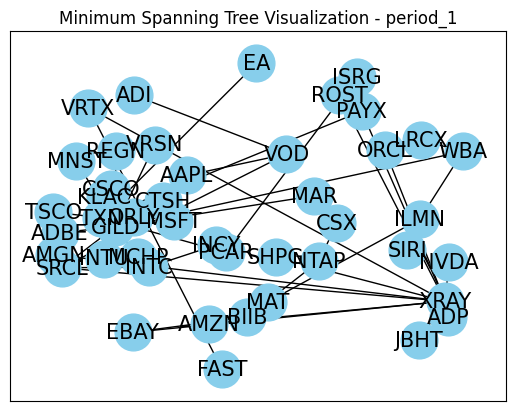

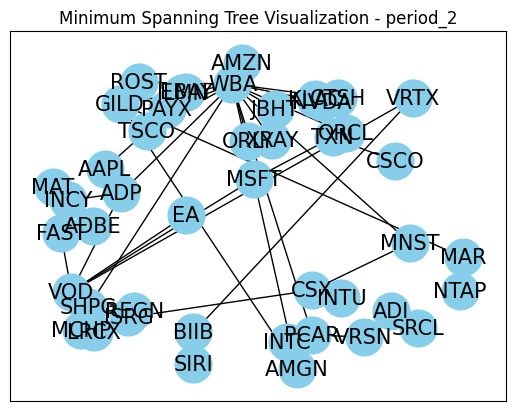

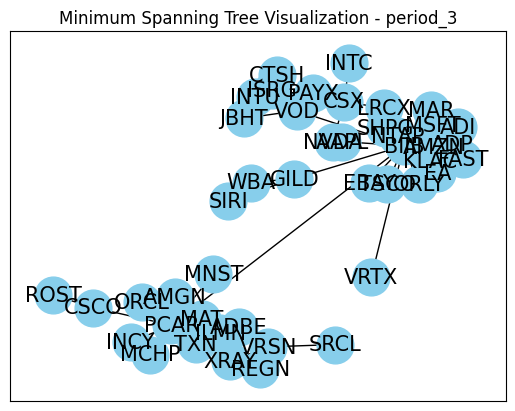

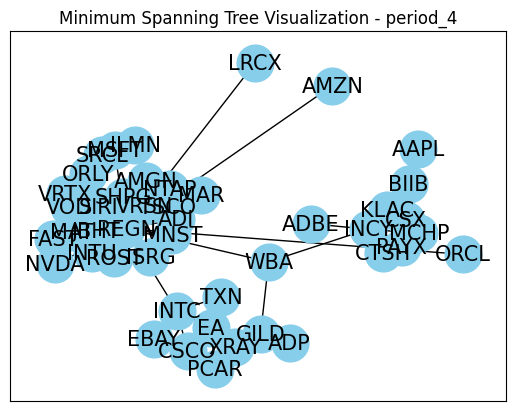

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


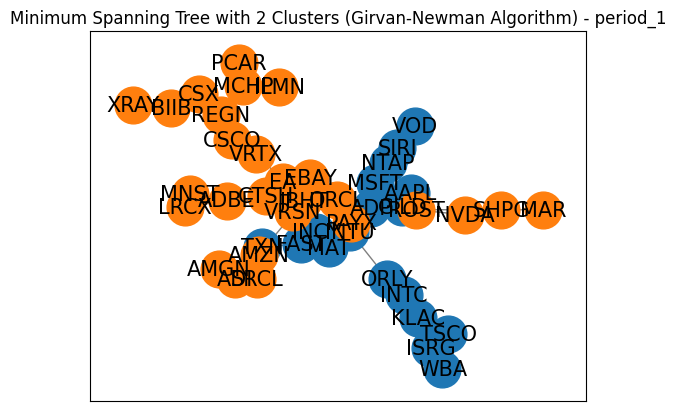

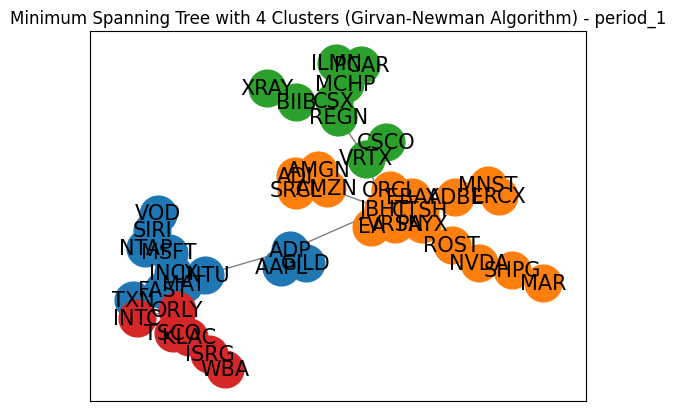

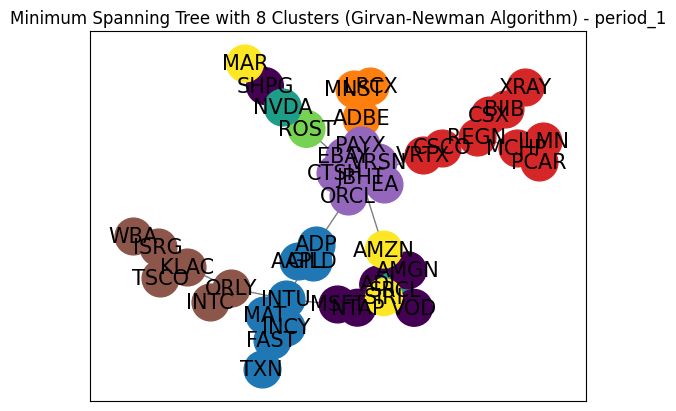

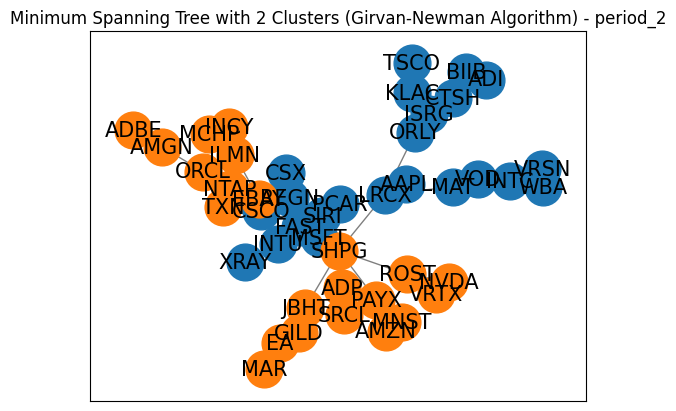

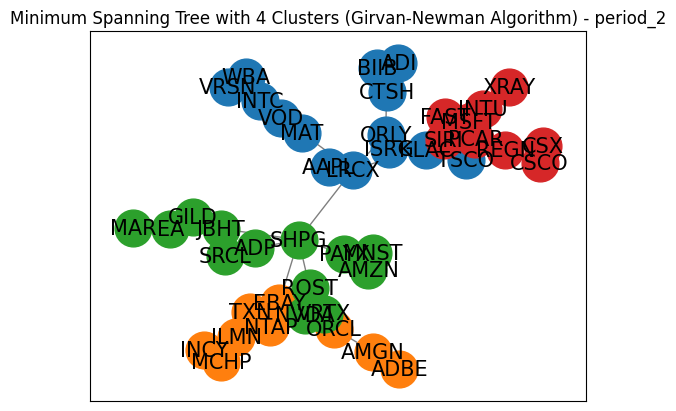

...

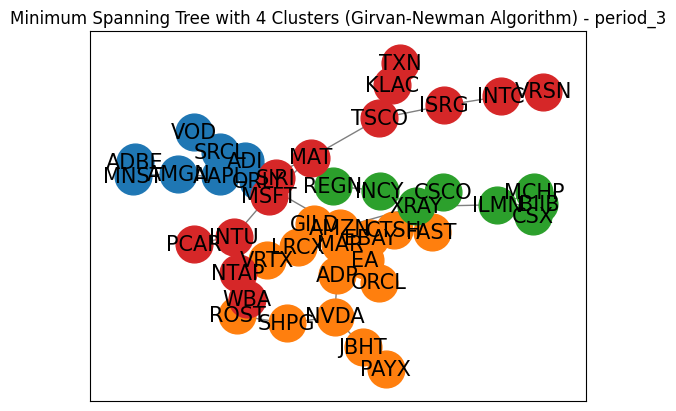

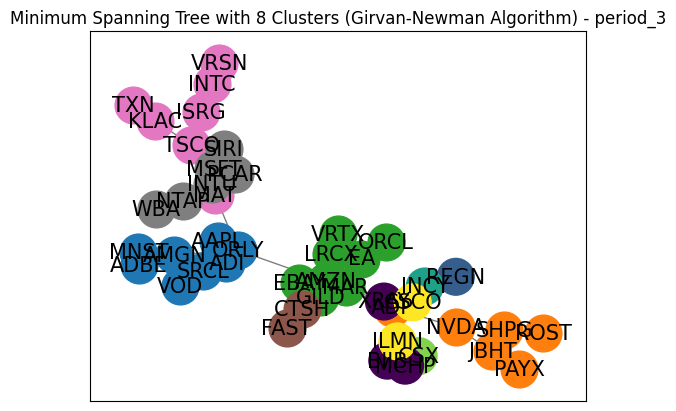

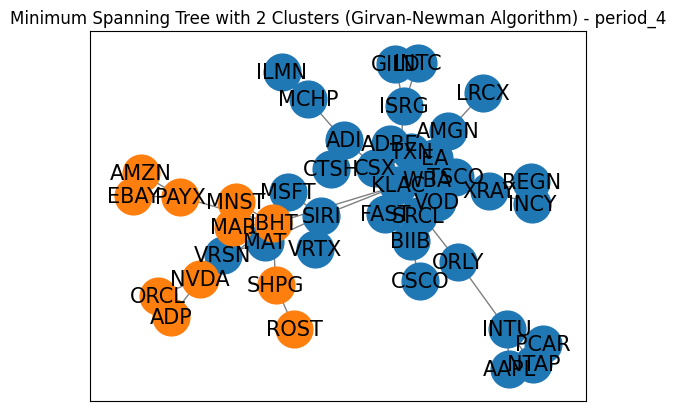

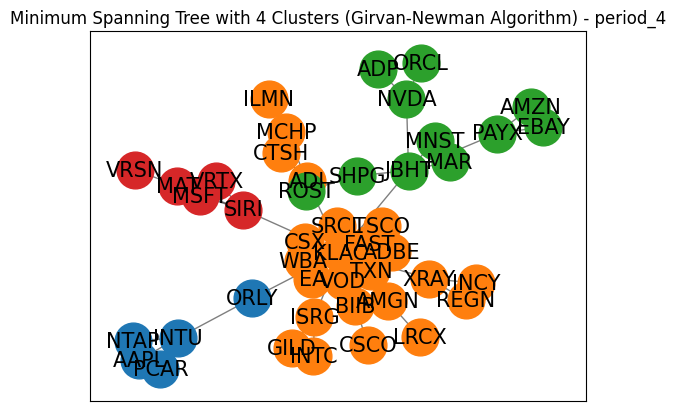

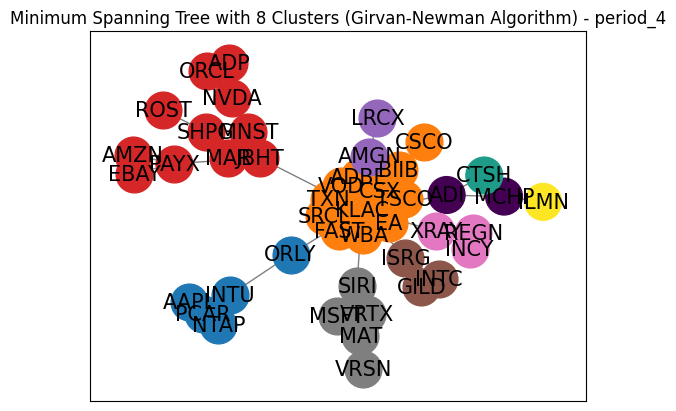

In [16]:
import numpy as np
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from networkx.algorithms.community import girvan_newman

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def generate_portfolios(communities, labels, num_portfolios=100):
    """Generate multiple portfolios by selecting one ticker at random from each cluster."""
    portfolios = []
    for _ in range(num_portfolios):
        portfolio = [random.choice(list([labels[node] for node in community])) for community in communities]
        portfolios.append(portfolio)
    return portfolios

def plot_MST_portfolios(G, num_clusters, period, communities, labels):
        # Plot the graph with clusters colored
        pos = nx.spring_layout(G)
        for i, community in enumerate(communities):
            nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=plt.cm.tab10(i), node_size=700, label=f'Cluster {i+1}')
        nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
        plt.title(f"Minimum Spanning Tree with {num_clusters} Clusters (Girvan-Newman Algorithm) - {period}")
        plt.show()


def MST_cluster(distance_matrix, labels, period, plot):
    sparse_matrix = csr_matrix(distance_matrix)

    # Compute the minimum spanning tree
    mst = minimum_spanning_tree(sparse_matrix)

    # Create a NetworkX graph from the MST
    G = nx.Graph(mst.toarray().astype(float))

    # Use the Girvan-Newman algorithm to find communities
    communities_generator = girvan_newman(G)

    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}

    for num_clusters in [2, 4, 8]:
        for communities in communities_generator:
            for comm_num, community in enumerate(communities, start=1):
                cluster_stocks[num_clusters][comm_num] = [labels[t] for t in community]    
            if len(communities) == num_clusters:
                break
        
        #plot
        if plot:
            plot_MST_portfolios(G, num_clusters, period, communities, labels)
    return cluster_stocks

def MST(correlation_matrices, plot = True):
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        distance_matrix = correlation_matrices[period]
        tickers = sorted(set([index[0] for index in distance_matrix]))
        labels = {i: ticker for i, ticker in enumerate(tickers)}

        # Convert the distance matrix to a sparse matrix
        sparse_matrix = csr_matrix(distance_matrix)

        # Compute the minimum spanning tree
        mst = minimum_spanning_tree(sparse_matrix)

        # Create a NetworkX graph from the MST
        G = nx.Graph(mst.toarray().astype(float))
        if plot:
            # Draw the graph
            pos = nx.spring_layout(G)  # positions for all nodes
            nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue')
            nx.draw_networkx_edges(G, pos, edge_color='k')
            nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
            plt.title(f"Minimum Spanning Tree Visualization - {period}")
            plt.show()       
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)

    mst_all_cluster_stocks = {}
    tickers = sorted(set(index[0] for index in distance_matrix))
    labels = {i: ticker for i, ticker in enumerate(tickers)}
    for period, distance_matrix in distance_matrices.items():
        mst_all_cluster_stocks[period] = MST_cluster(distance_matrix.values, labels, period, plot)

    return mst_all_cluster_stocks
mst_all_cluster_stocks = MST(correlation_matrices)

In [17]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period, mst_result_df_clusters = calculate_metrics_for_mst_clusters(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters


,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.436468,0.058966,0.895124,0.289315,"[ISRG, SRCL, INCY, ROST, MAT, PCAR, MAT, XRAY,..."
period_1 (4 stocks),0.773268,0.051116,1.641340,0.266318,"[SIRI, AMZN, PCAR, ORLY, ADP, ORCL, ILMN, INTC..."
period_1 (8 stocks),0.761231,0.046837,1.678541,0.266778,"[AAPL, ADBE, ADI, XRAY, EBAY, WBA, ROST, SIRI,..."
period_2 (2 stocks),0.686439,0.036746,1.714128,0.239473,"[MSFT, ADP, MAT, EA, XRAY, MAR, XRAY, EBAY, XR..."
period_2 (4 stocks),0.717015,0.030109,2.270273,0.239479,"[VOD, TXN, VRTX, XRAY, ORLY, ORCL, AMZN, INTU,..."
period_2 (8 stocks),0.930298,0.027266,3.382400,0.221993,"[LRCX, NTAP, ORLY, NVDA, AMZN, CSX, MAR, INCY,..."
period_3 (2 stocks),0.300033,0.050571,0.567133,0.408730,"[WBA, INCY, ADBE, LRCX, MSFT, ADP, ADBE, NVDA,..."
period_3 (4 stocks),0.271747,0.043099,0.620595,0.396737,"[VOD, SHPG, CSCO, SIRI, MNST, EA, INCY, NTAP, ..."
period_3 (8 stocks),0.268373,0.041565,0.641338,0.425823,"[AAPL, PAYX, EA, CSX, INCY, FAST, ISRG, WBA, S..."
period_4 (2 stocks),0.991260,0.032103,3.123096,0.386414,"[CSX, AMZN, MAT, ADP, FAST, ROST, GILD, PAYX, ..."


## Plots and Diagrams (In Sample)

In [18]:
def count_of_stocks(result_df_clusters,custom_tickers,experiment_name):
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers, columns=[period])
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers
        total_counts = counts_df.sum(axis=1)

        # Get the top 8 stocks and group the rest into "Other"
        top_8 = total_counts.nlargest(8)
        other = pd.Series(total_counts.sum() - top_8.sum(), index=["Other"])

        # Concatenate the top 8 and "Other"
        final_counts = pd.concat([top_8, other])

        # Plot the pie chart for the current period
        plt.figure(figsize=(8, 8))
        plt.pie(final_counts, labels=final_counts.index, autopct='%1.1f%%', startangle=140)
        plt.axis('equal')
        plt.title(f'{experiment_name} Top 8 Stocks - {period}')
        plt.show()
        total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Plot the pie chart for all periods combined
    plt.figure(figsize=(8, 8))
    plt.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title(f"{experiment_name} All Stocks - All Periods Combined'")
    plt.show()

    ################################################################################################
    total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Sort the total counts in descending order
    total_counts_sorted = total_counts.sort_values(ascending=False)

    # Plot the bar chart for all periods combined
    plt.figure(figsize=(10, 6))
    total_counts_sorted.plot(kind='bar')
    plt.xlabel('Stock')
    plt.ylabel('Count')
    plt.title(f'{experiment_name} Total Counts of Each Stock Across All Periods')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

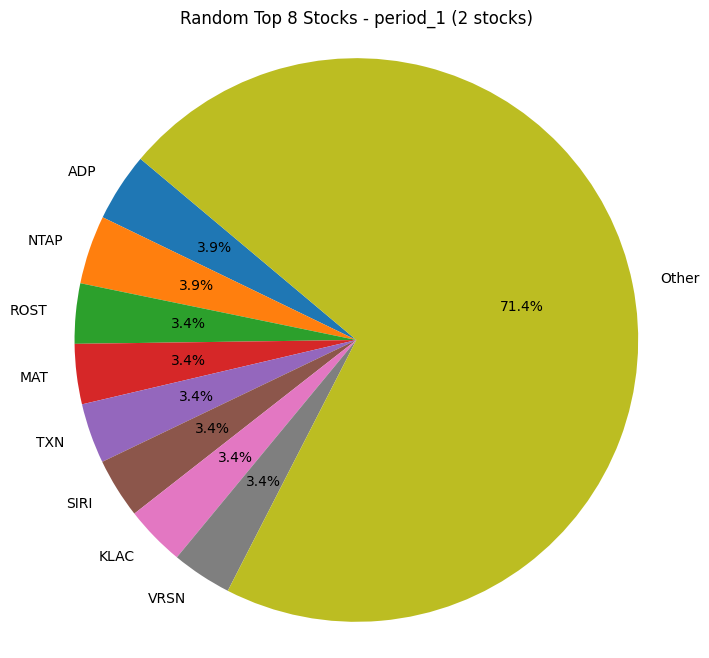

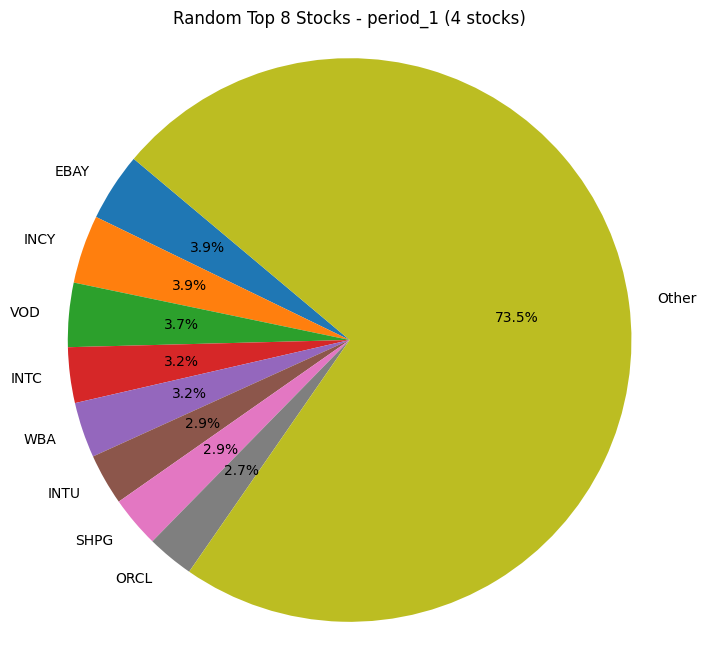

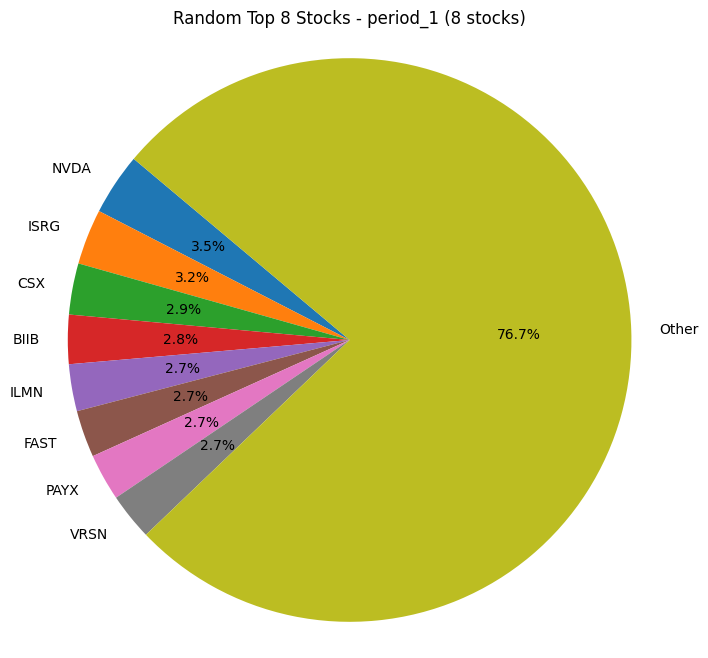

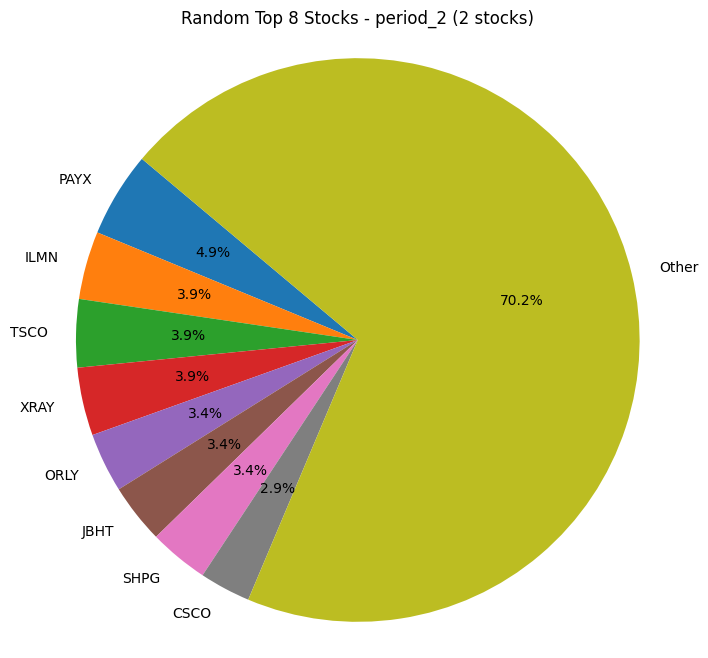

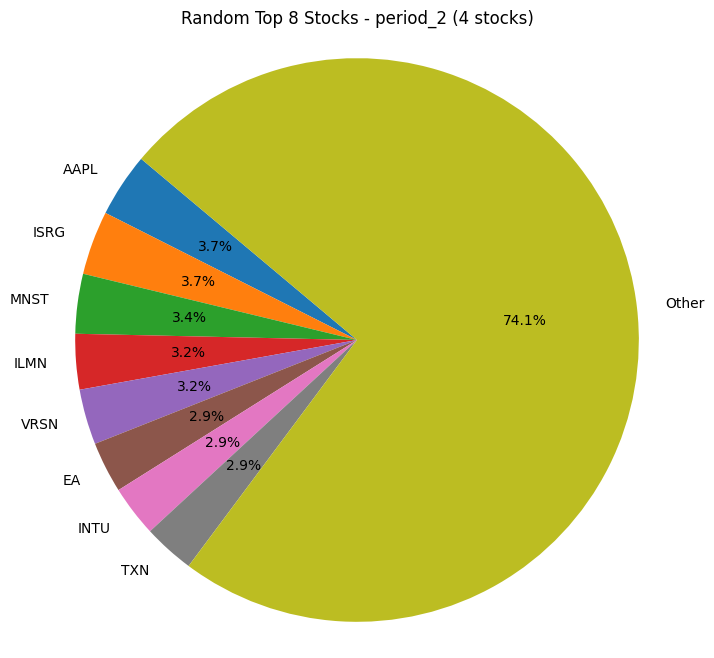

...

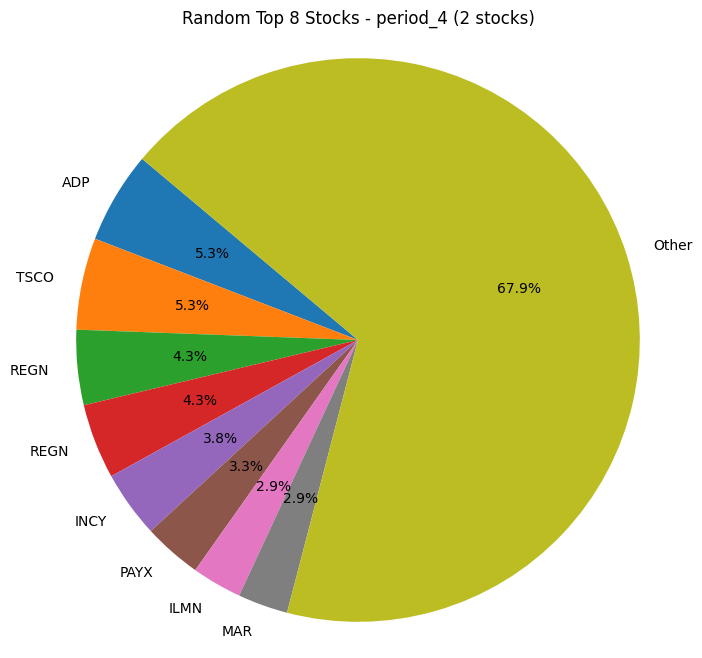

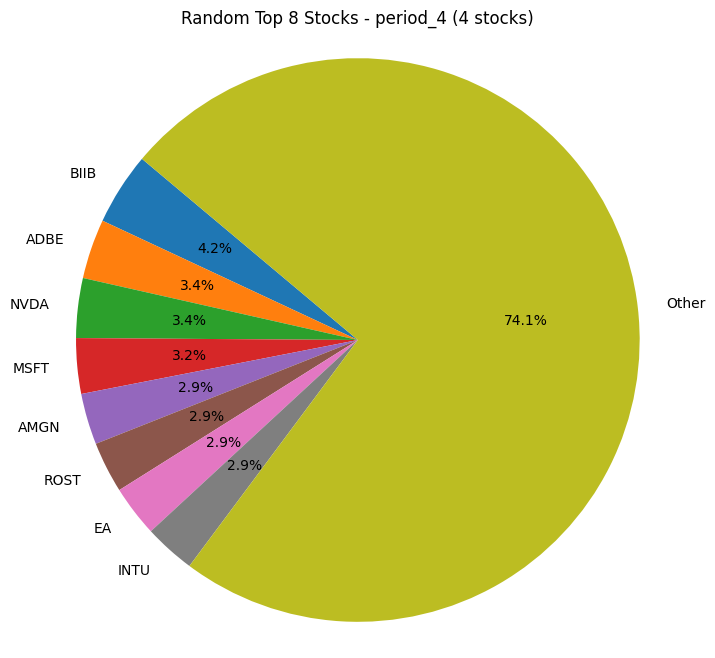

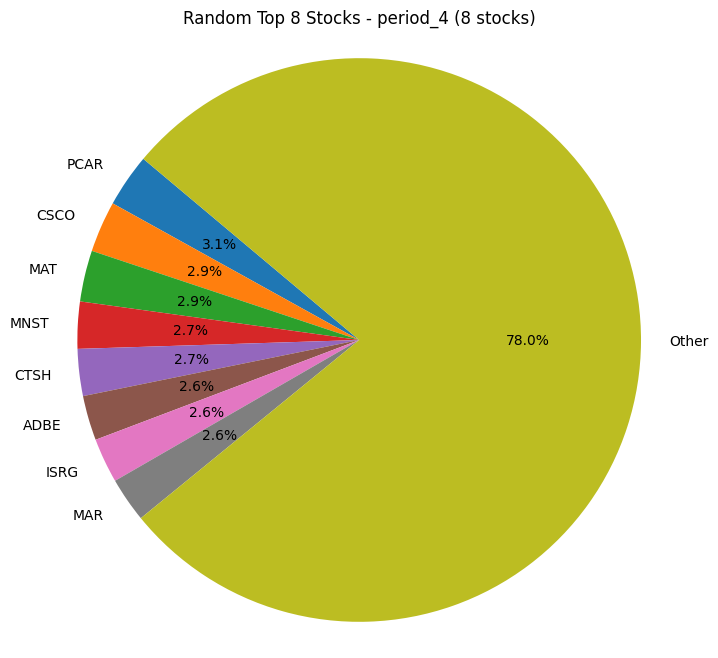

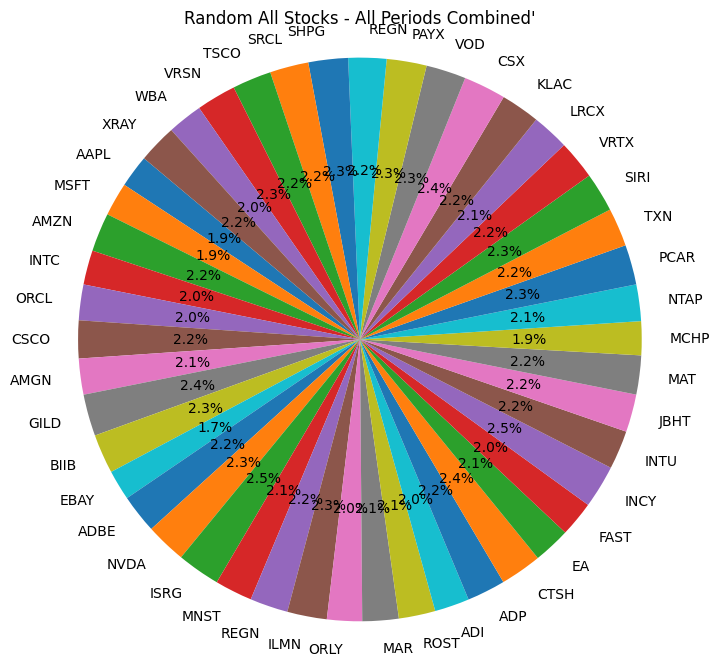

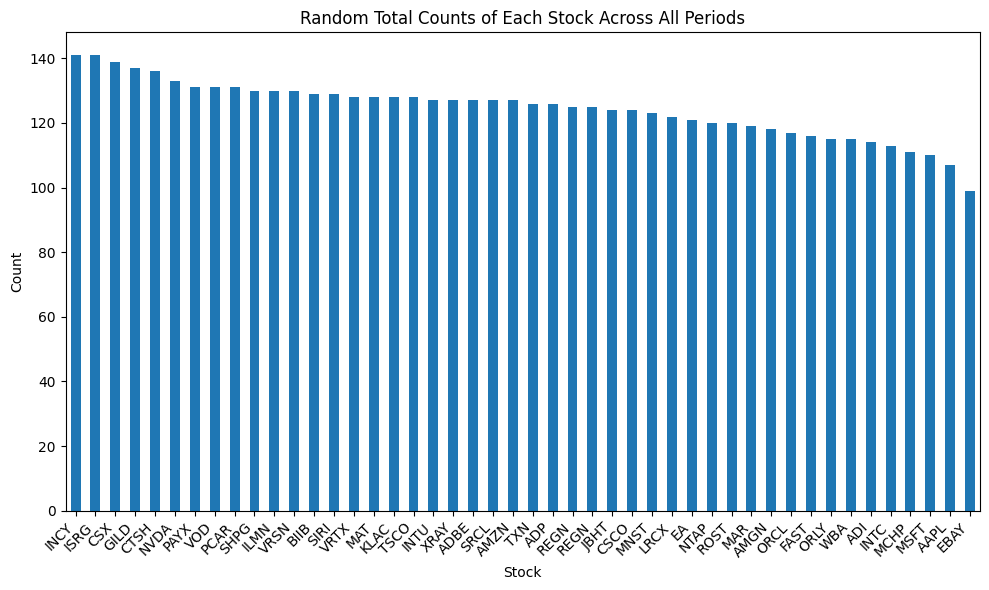

In [19]:
count_of_stocks(result_df_random,custom_tickers, "Random")

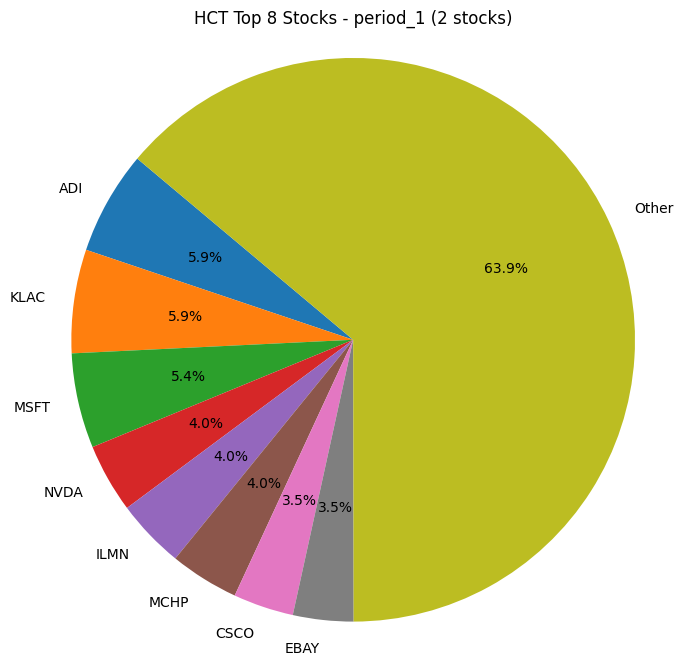

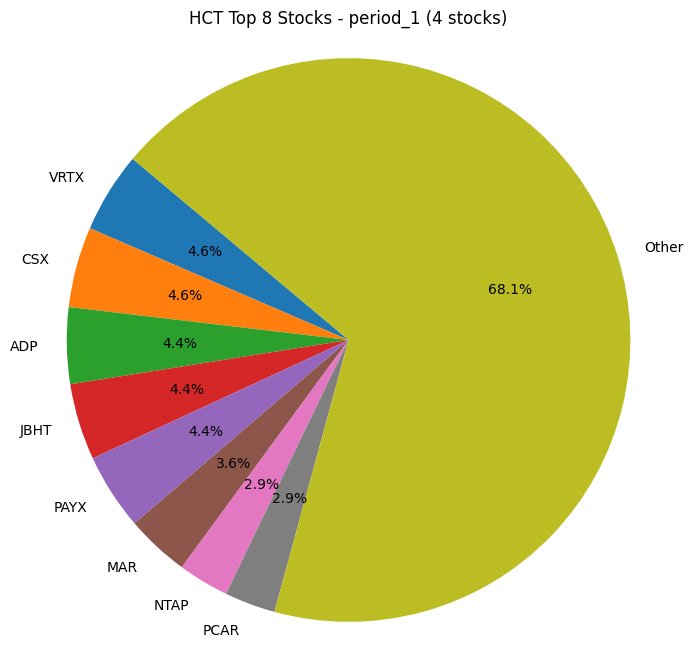

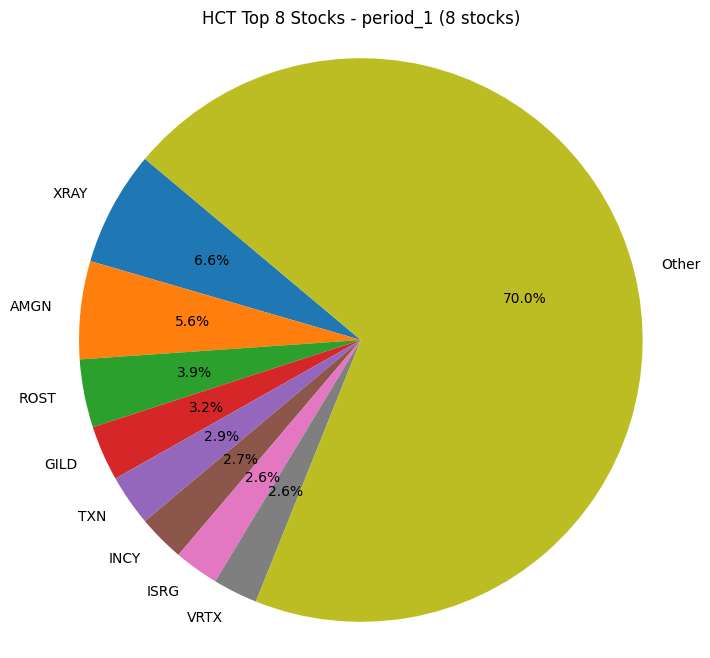

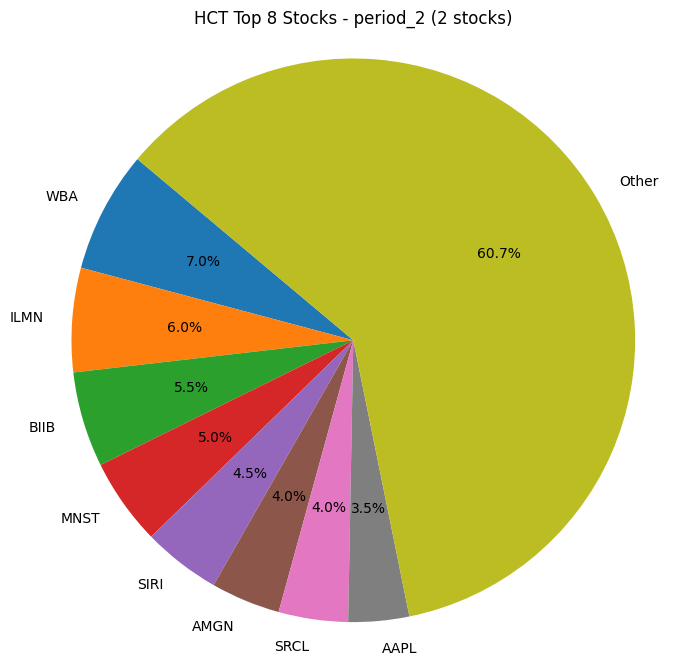

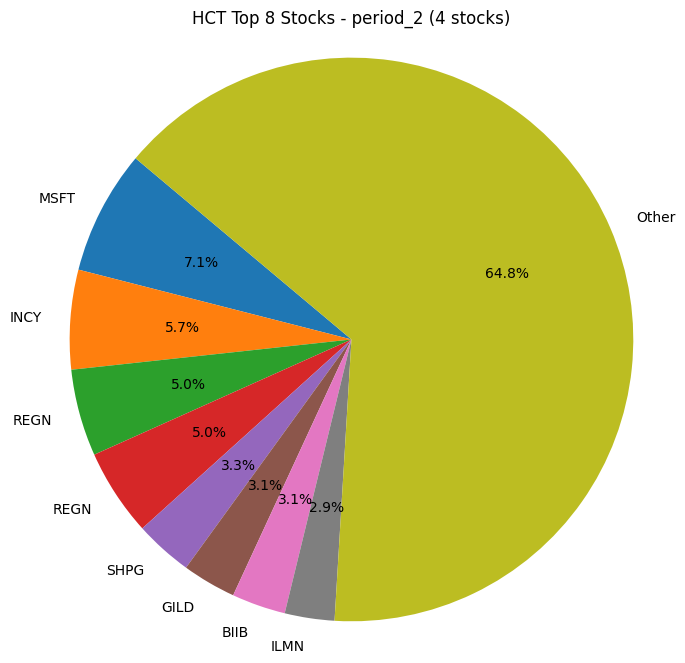

...

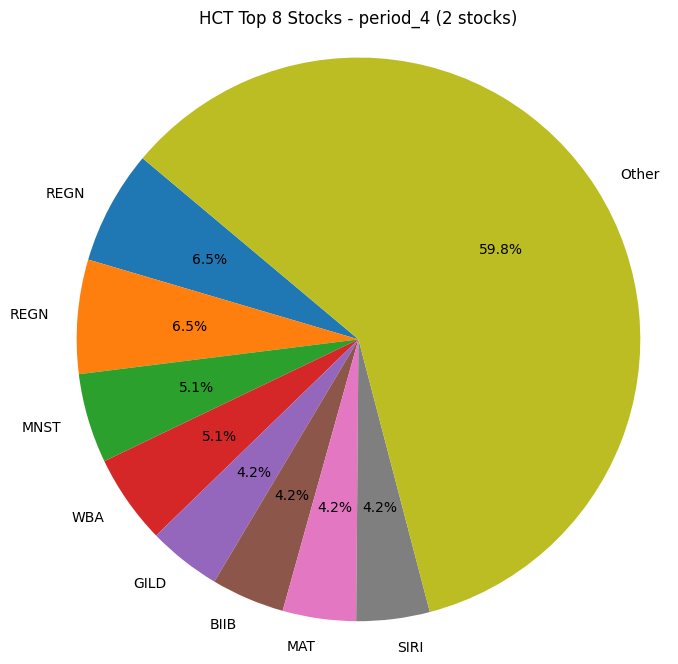

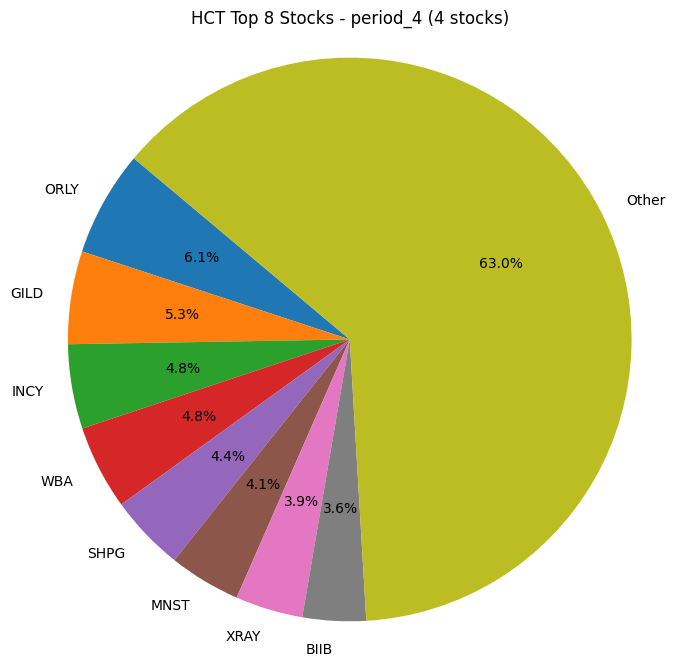

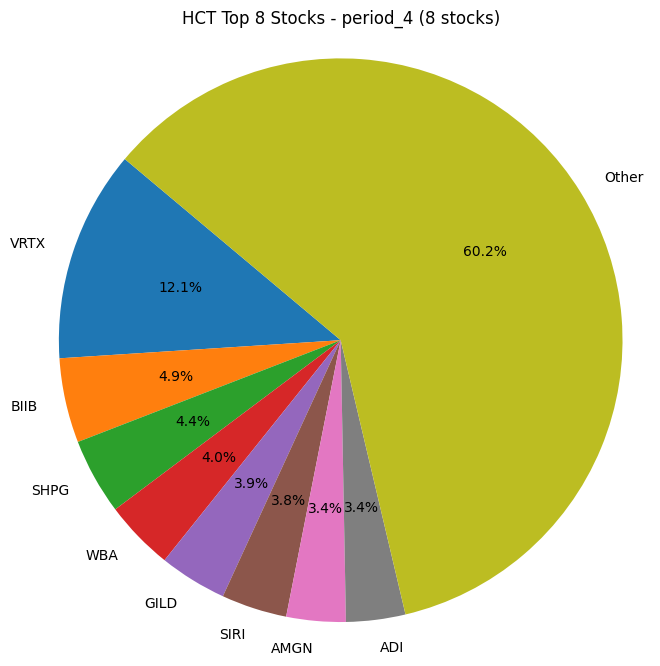

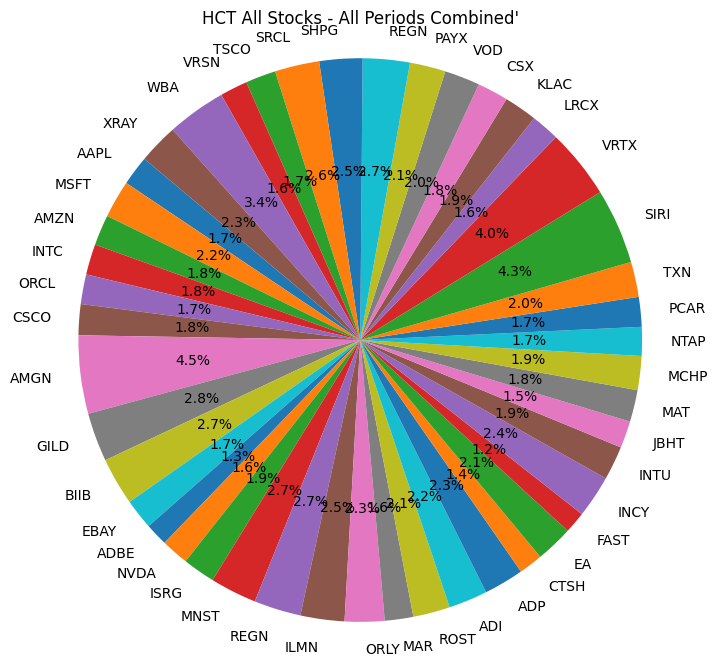

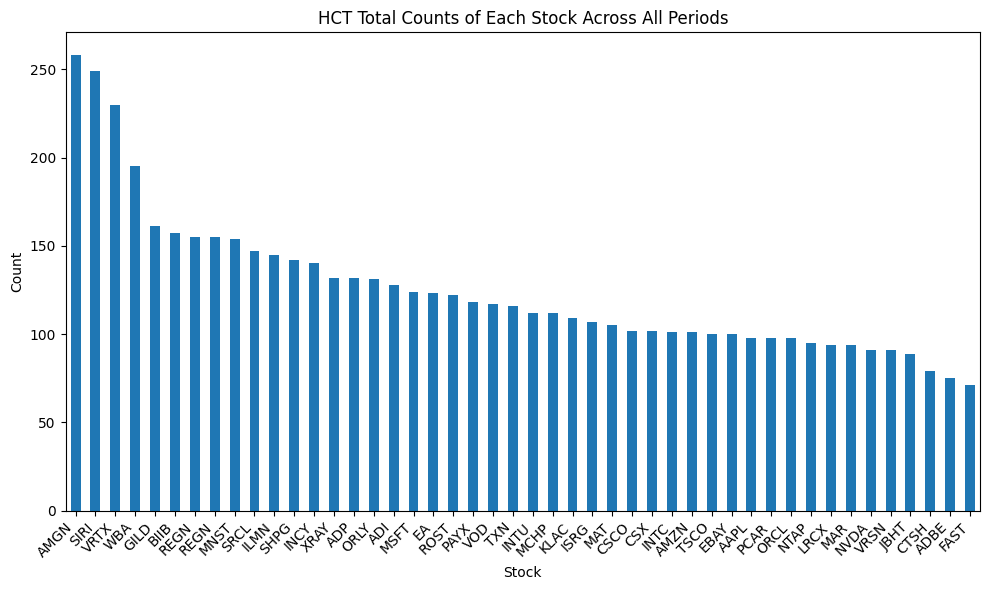

In [20]:
count_of_stocks(result_df_HCT,custom_tickers, "HCT")

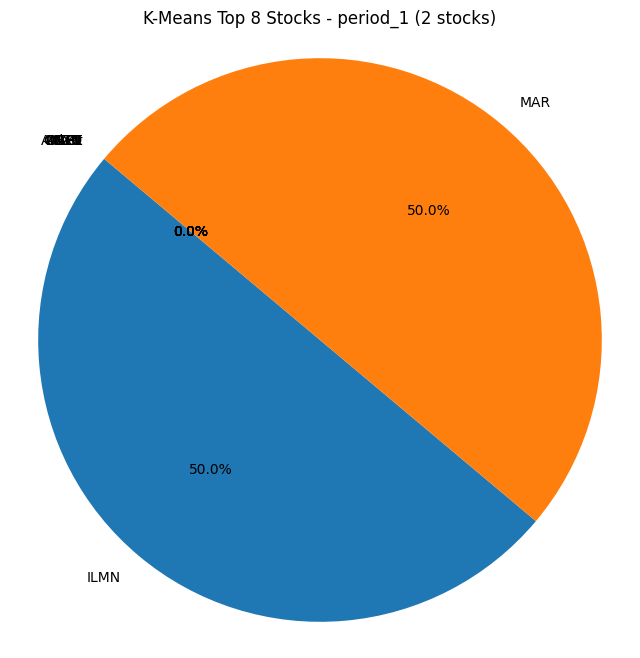

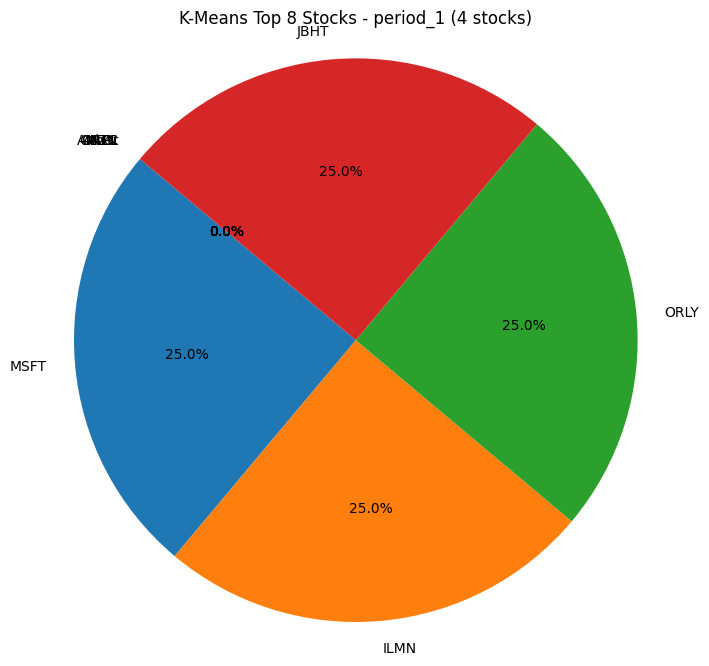

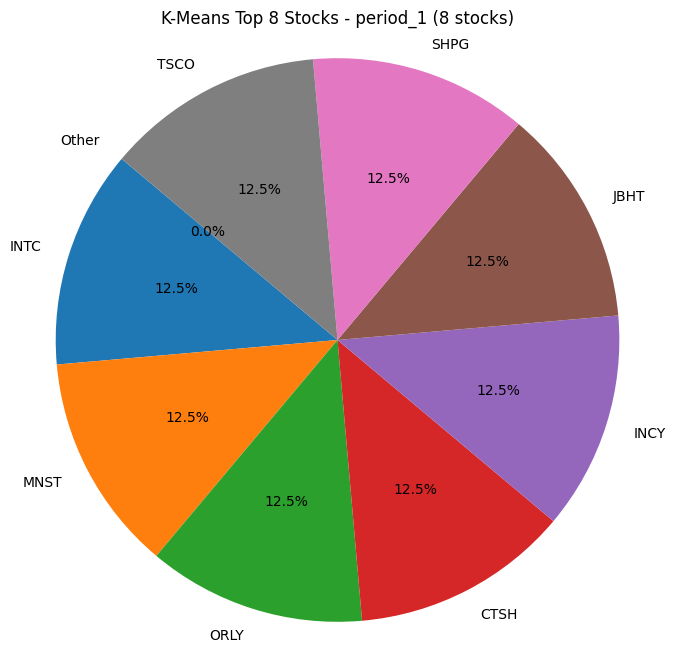

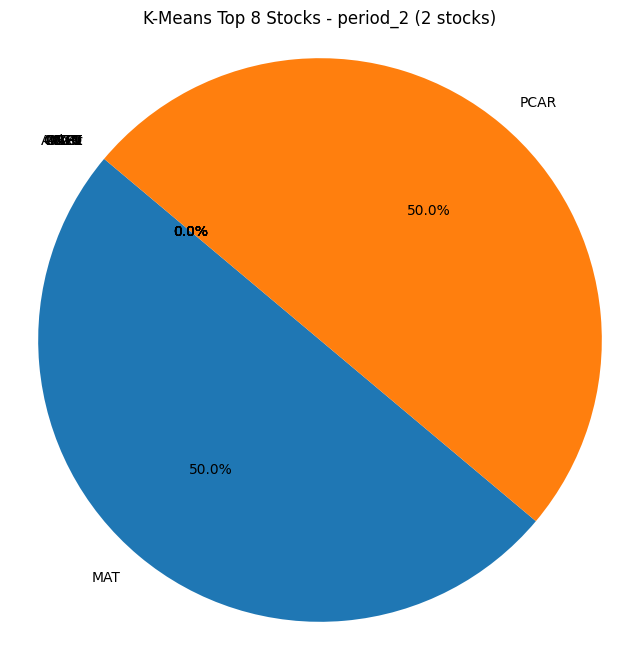

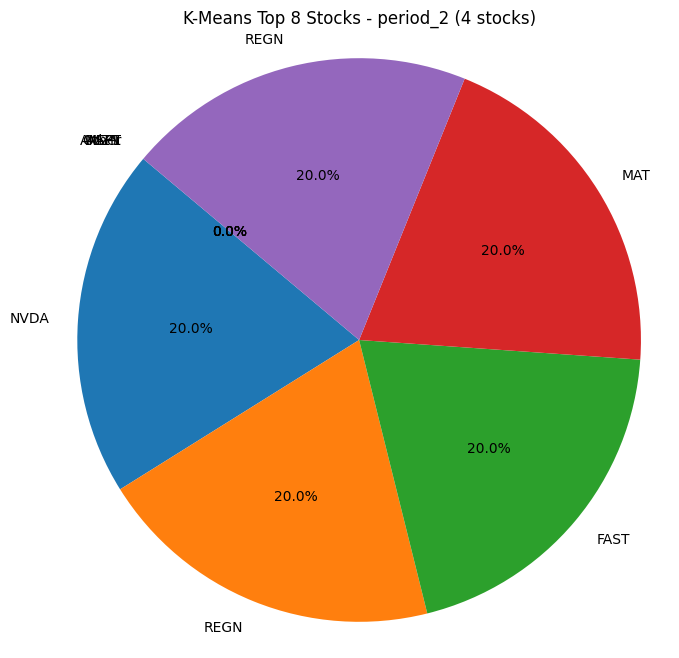

...

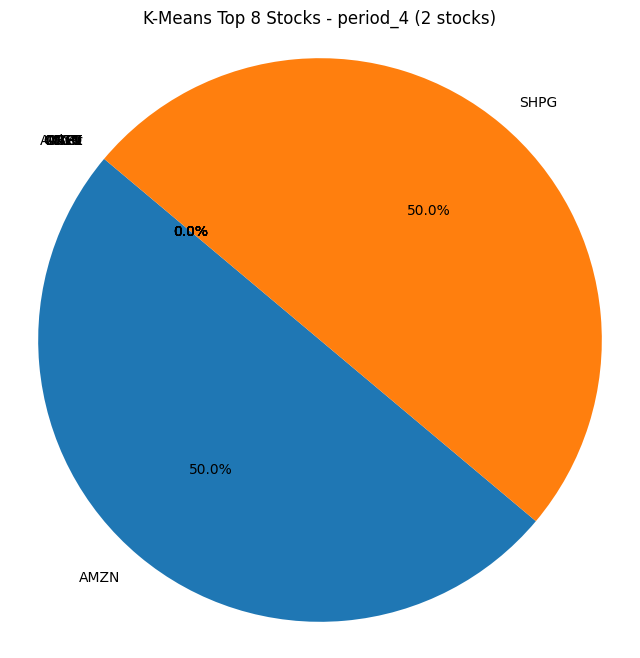

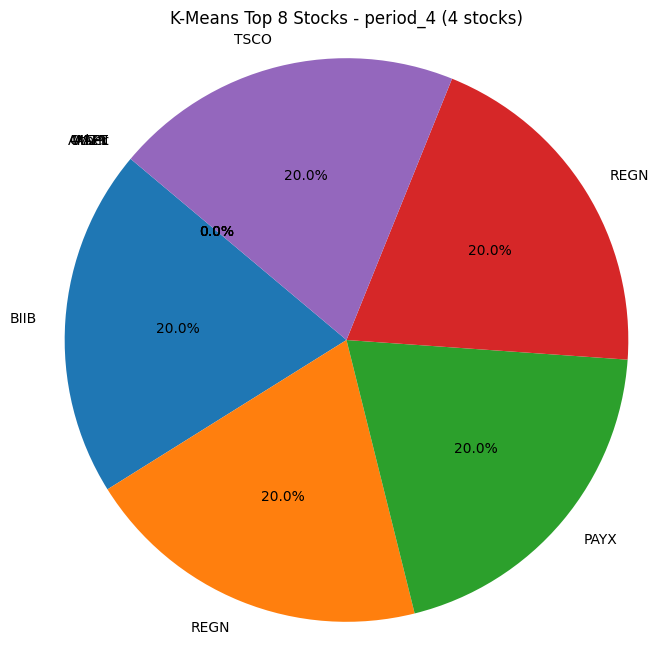

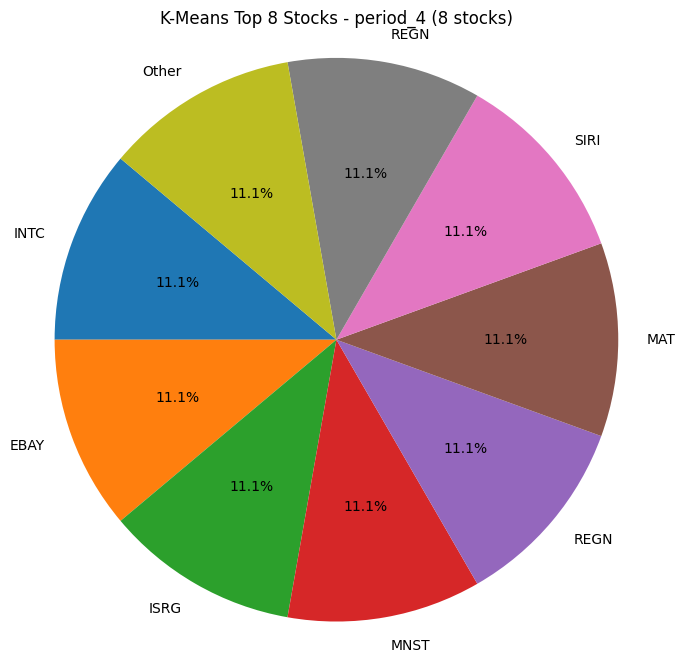

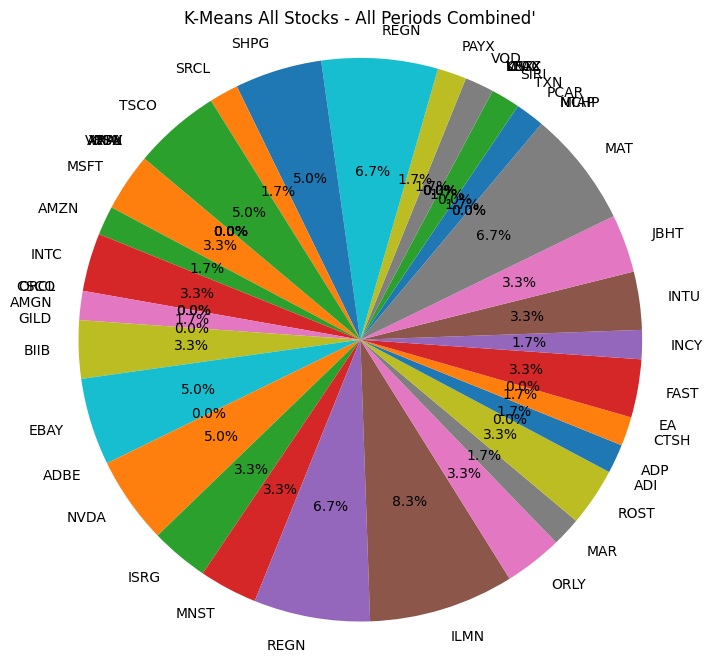

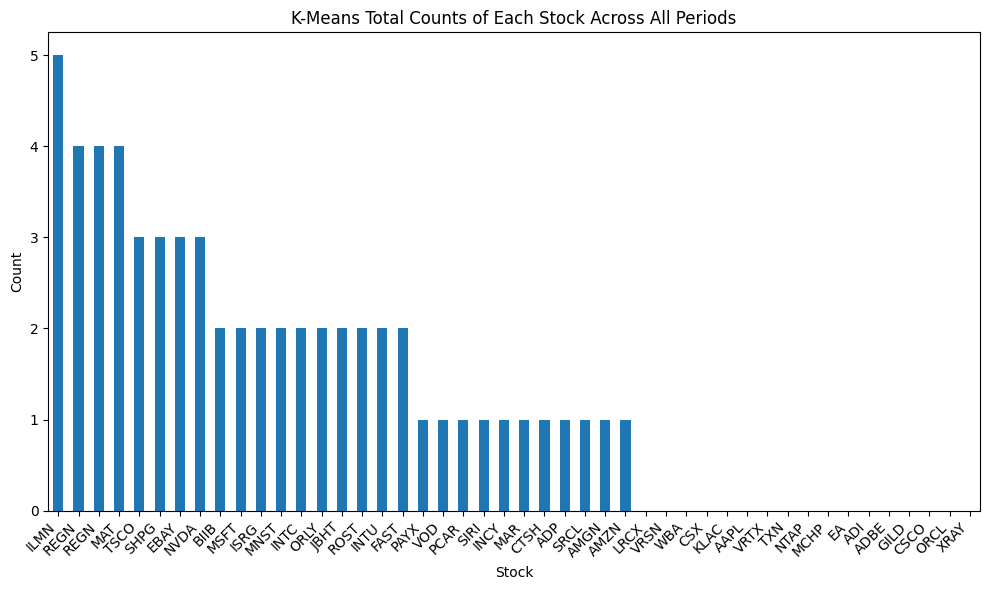

In [21]:
count_of_stocks(result_df_kmeans,custom_tickers, "K-Means")

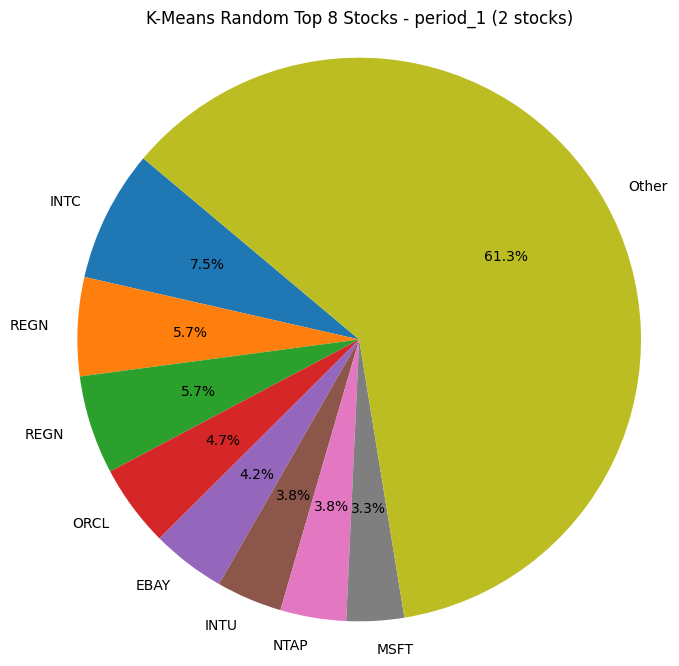

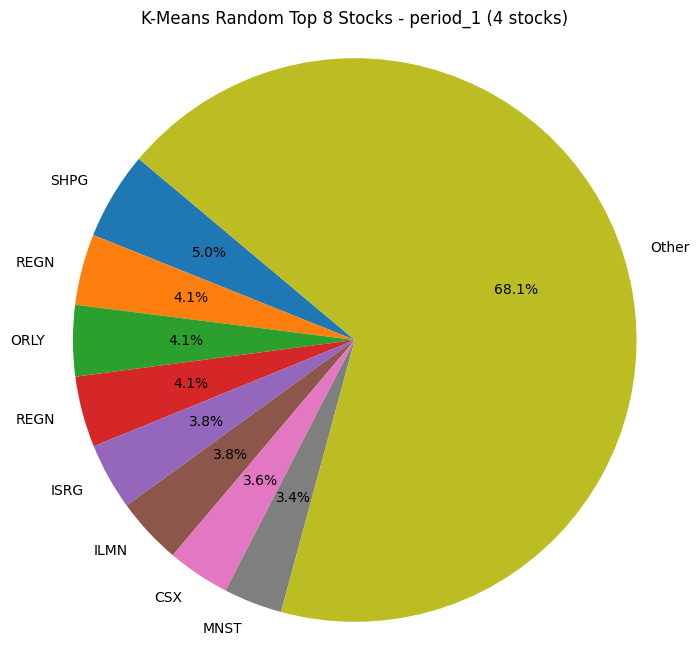

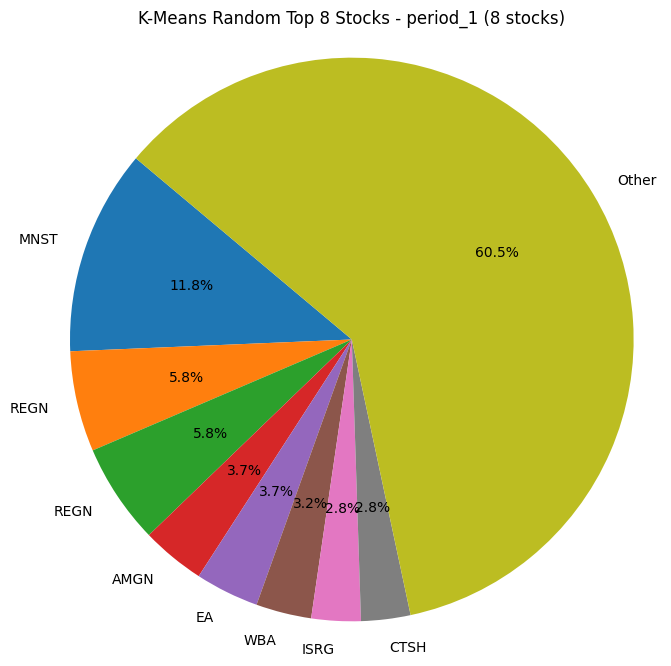

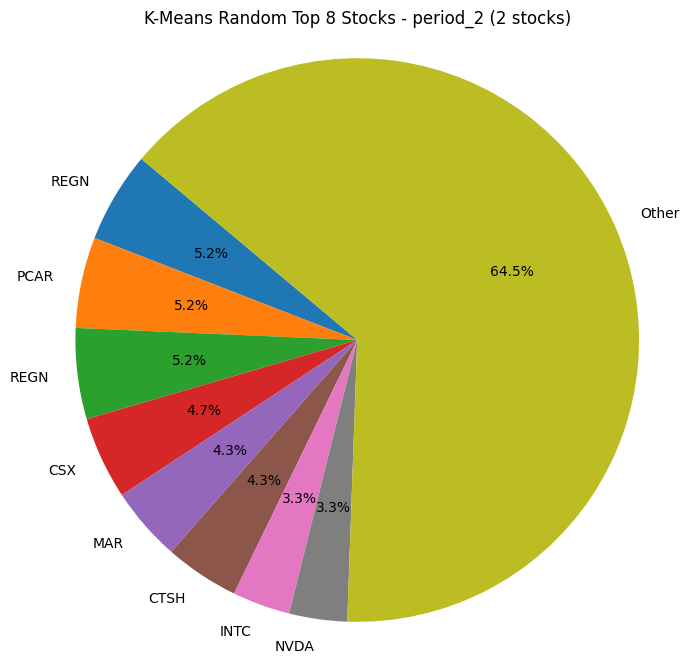

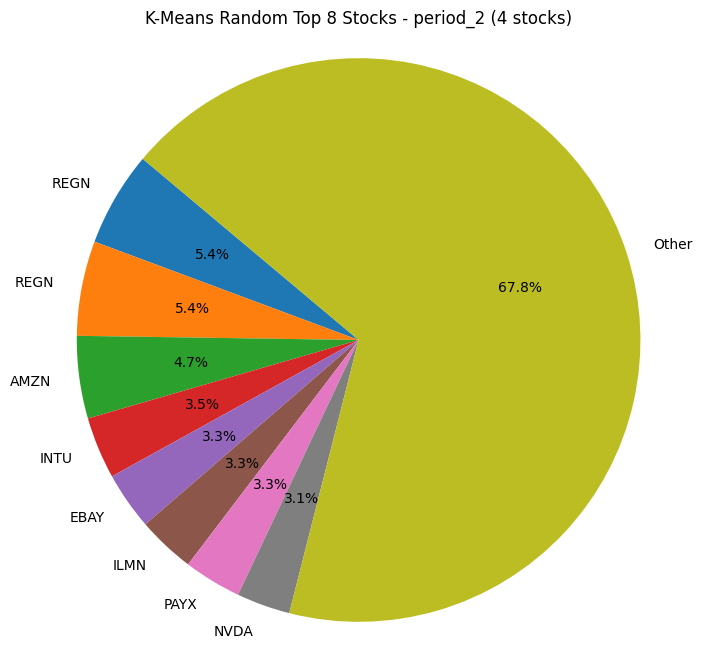

...

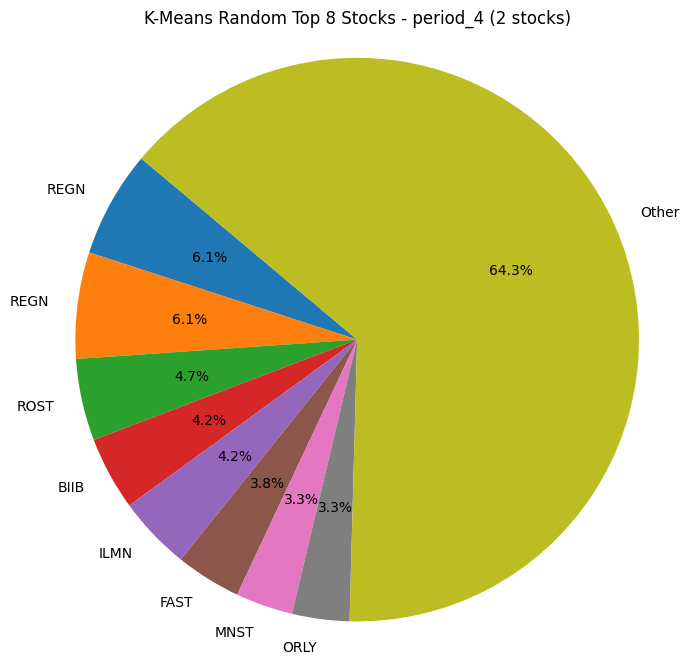

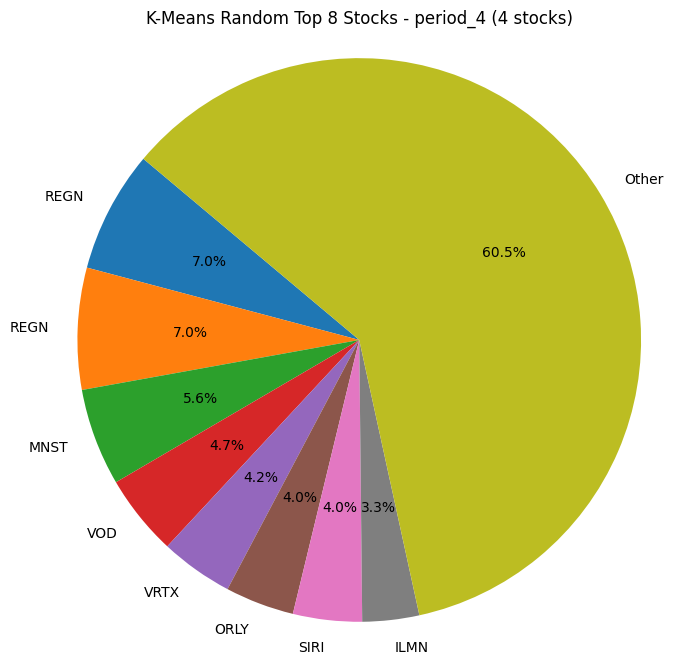

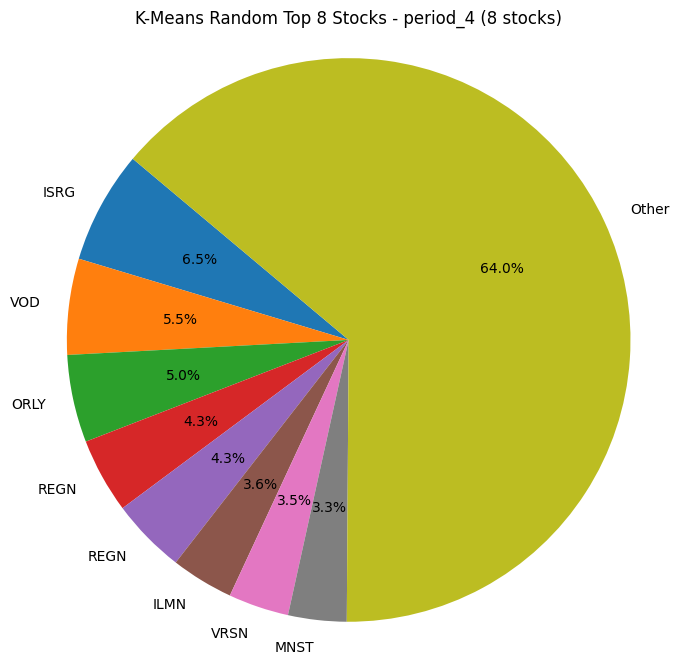

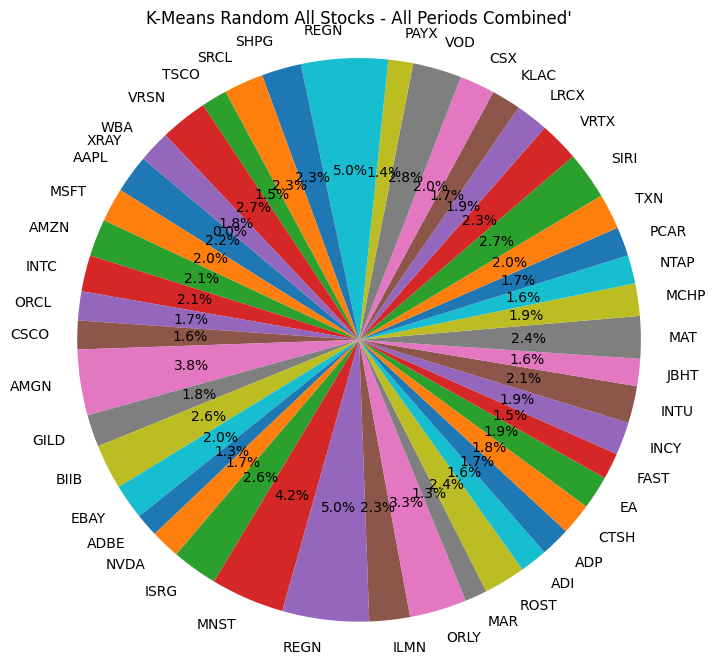

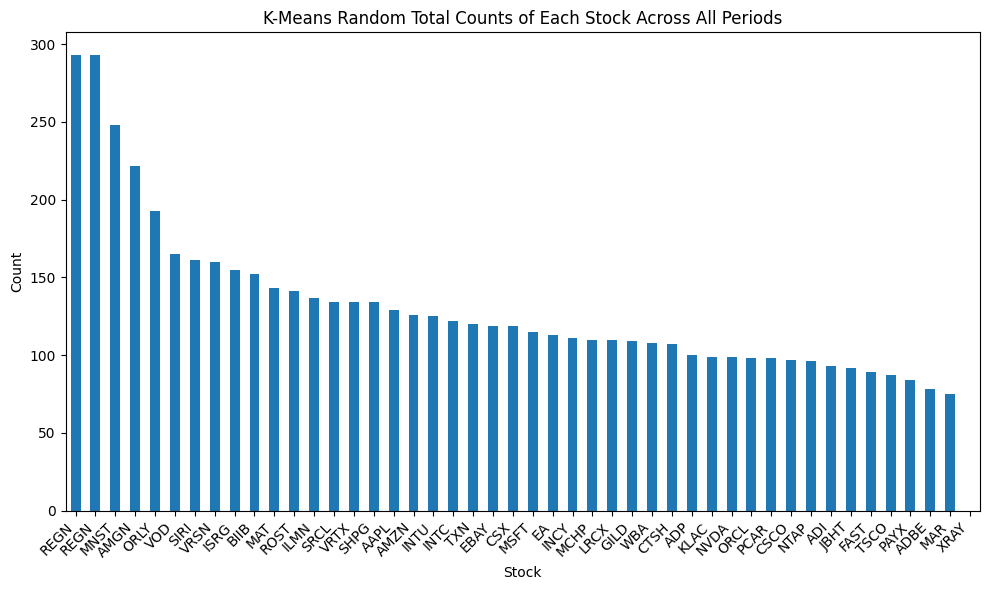

In [22]:
count_of_stocks(result_df_kmeans_rand,custom_tickers, "K-Means Random")

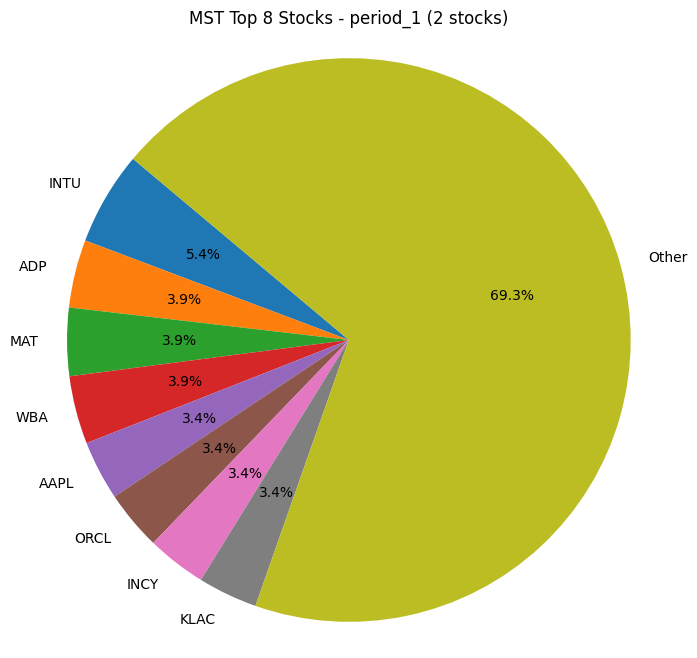

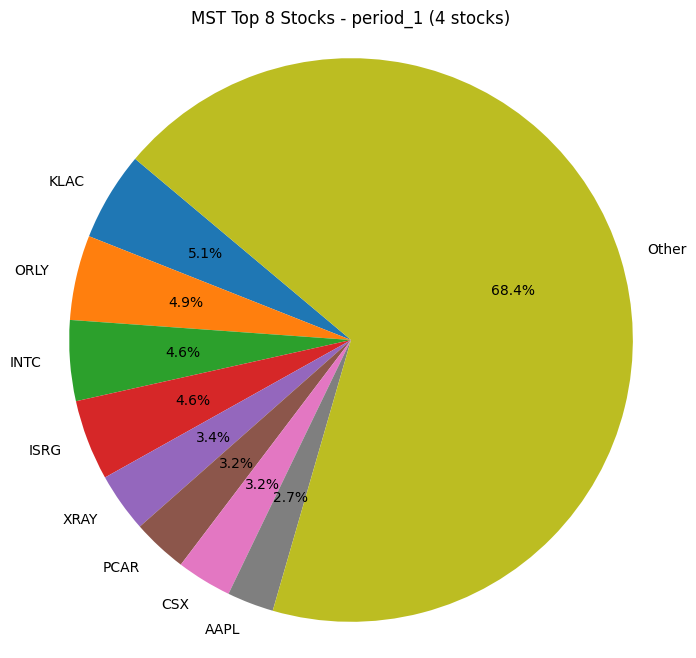

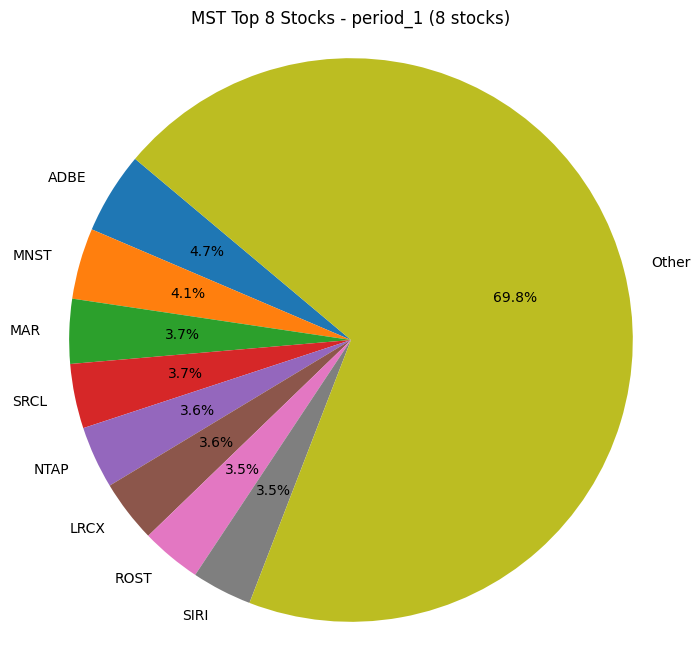

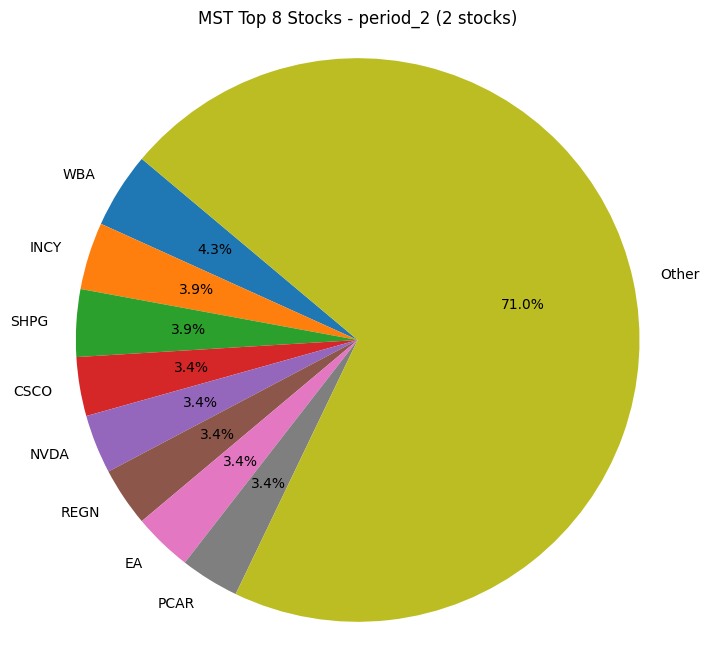

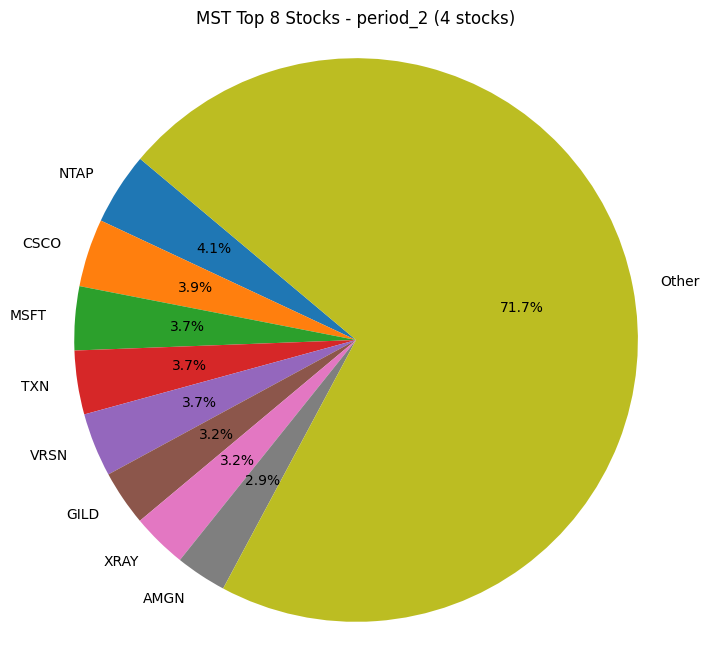

...

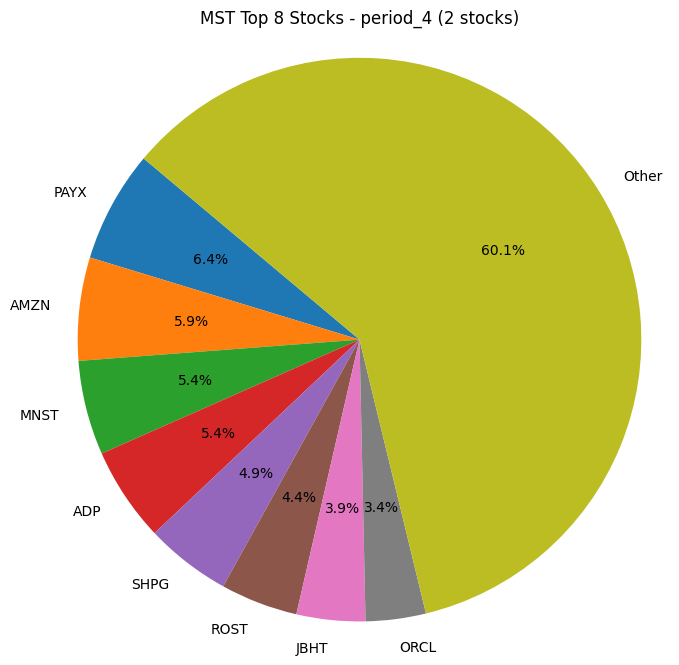

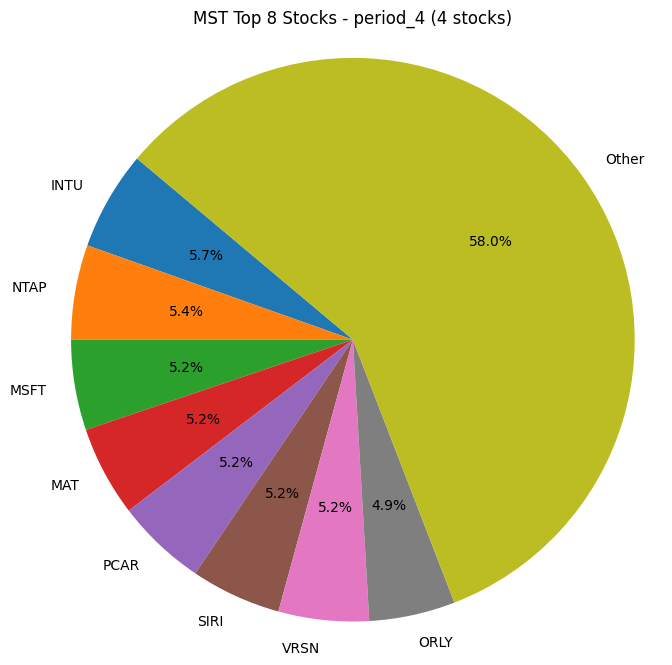

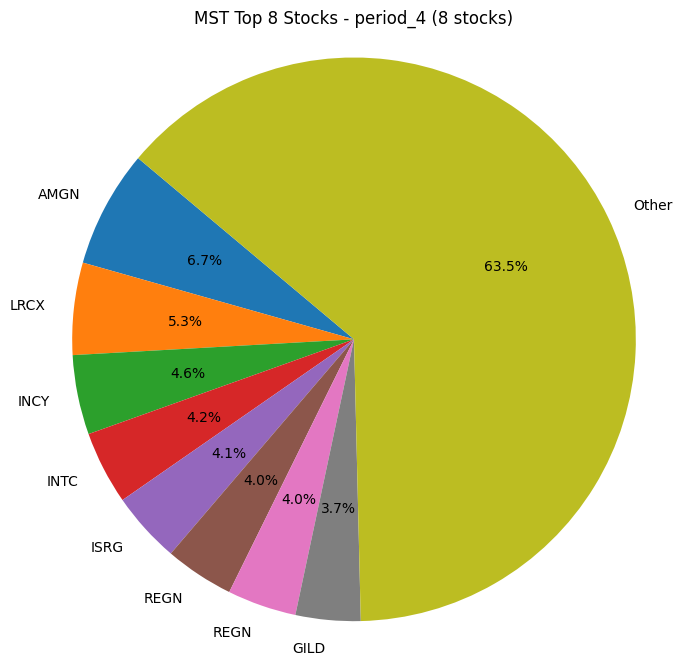

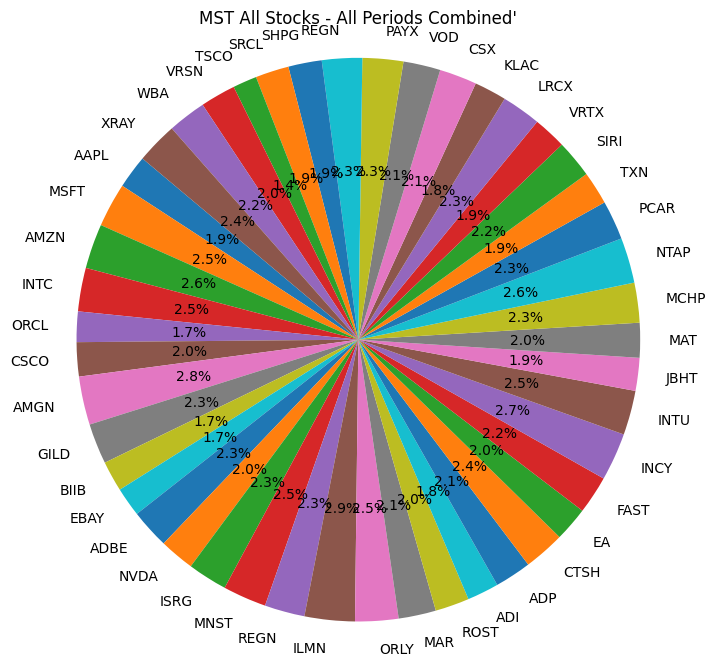

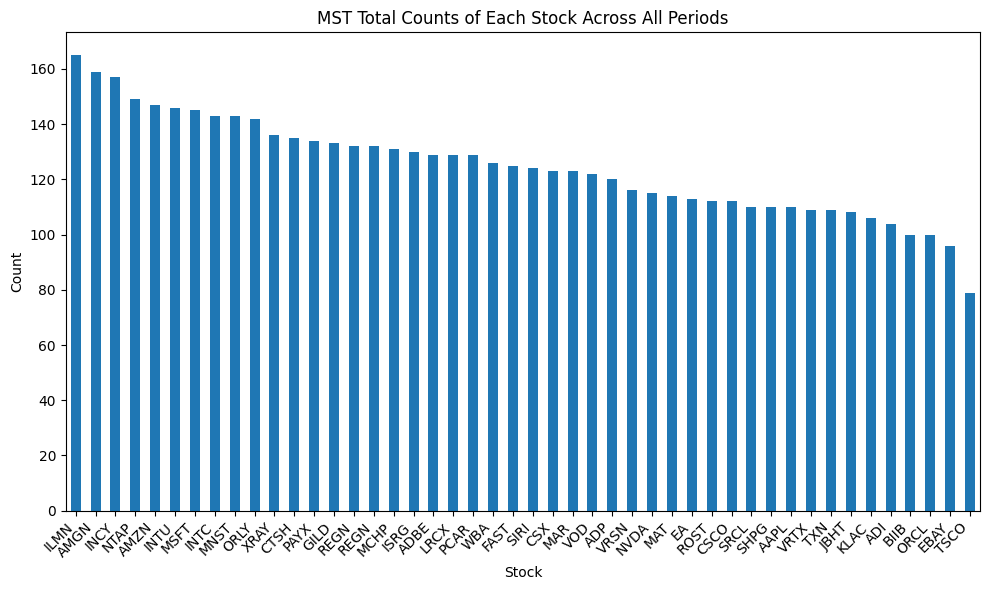

In [23]:
count_of_stocks(mst_result_df_clusters, custom_tickers, "MST")

In [24]:
def plot_metric(metric_name,result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, result_df_MST):
    labels = list(result_df_random.index)
    
    random_values = [result_df_random.loc[label][metric_name] for label in labels]
    HCT_values = [result_df_HCT.loc[label][metric_name] for label in labels]
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    MST_values = [result_df_MST.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.2  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width * 1.5, random_values, width, label='Random')
    rects2 = ax.bar(x - width * 0.5, HCT_values, width, label='HCT')
    rects3 = ax.bar(x + width * 0.5, kmeans_values, width, label='K-means')
    rects4 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='K-means Random')
    rects5 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='MST')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of Random Values:", np.mean(random_values))
    print("Total Average " + metric_name + " of Cluster Values:", np.mean(HCT_values))
    print("Total Average " + metric_name + " of K-means Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print("Total Average " + metric_name + " of MST Values:", np.mean(MST_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of Random Values:", np.mean(random_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of Cluster Values:", np.mean(HCT_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of MST:", np.mean(MST_values[(period_num - 1) * 3:period_num * 3]))

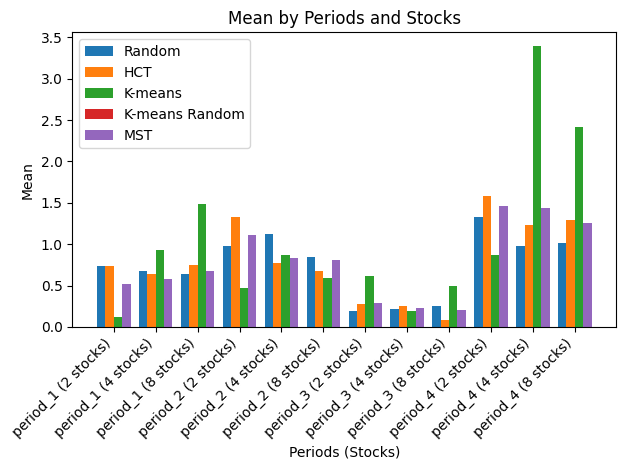

Total Average Mean of Random Values: 0.7468442490151189
Total Average Mean of Cluster Values: 0.8001182052191061
Total Average Mean of K-means Values: 1.0369734228285694
Total Average Mean of K-means Random Values: 0.7834605782476277
Total Average Mean of MST Values: 0.6899401233683604

Period 1 Average Mean of Random Values: 0.6828540471588002
Period 1 Average Mean of Cluster Values: 0.707104553673489
Period 1 Average Mean of K-means Values: 0.8476305013018015
Period 1 Average Mean of K-means Random Values: 0.5884136991710379
Period 1 Average Mean of MST: 0.6569891270725253
Period 2 Average Mean of Random Values: 0.9808807672054435
Period 2 Average Mean of Cluster Values: 0.9227573619879145
Period 2 Average Mean of K-means Values: 0.6413138596663246
Period 2 Average Mean of K-means Random Values: 0.9175200063683421
Period 2 Average Mean of MST: 0.7779169113389054
Period 3 Average Mean of Random Values: 0.21861760423089174
Period 3 Average Mean of Cluster Values: 0.20299206239594944
Pe

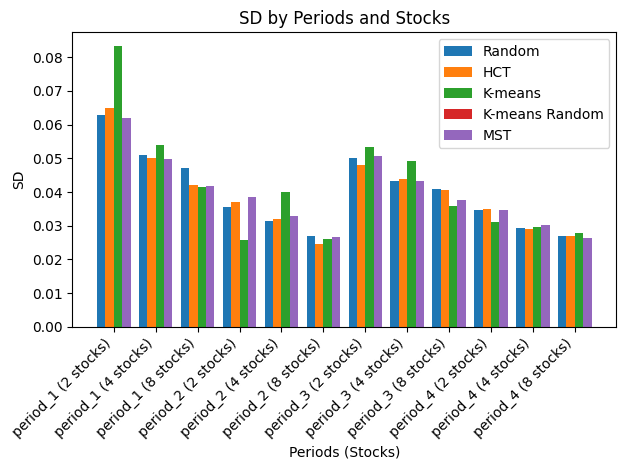

Total Average SD of Random Values: 0.04001326633105847
Total Average SD of Cluster Values: 0.03950006025874044
Total Average SD of K-means Values: 0.04146314652855157
Total Average SD of K-means Random Values: 0.03954465629958113
Total Average SD of MST Values: 0.03958188547175064

Period 1 Average SD of Random Values: 0.0536636435476778
Period 1 Average SD of Cluster Values: 0.05240538879194472
Period 1 Average SD of K-means Values: 0.059518275556651005
Period 1 Average SD of K-means Random Values: 0.051210304656741736
Period 1 Average SD of MST: 0.05230651863060743
Period 2 Average SD of Random Values: 0.03131246927606348
Period 2 Average SD of Cluster Values: 0.03115831668773085
Period 2 Average SD of K-means Values: 0.03070731489078116
Period 2 Average SD of K-means Random Values: 0.03267222336978414
Period 2 Average SD of MST: 0.03137362554493467
Period 3 Average SD of Random Values: 0.04479540735355527
Period 3 Average SD of Cluster Values: 0.0441186358178274
Period 3 Average SD 

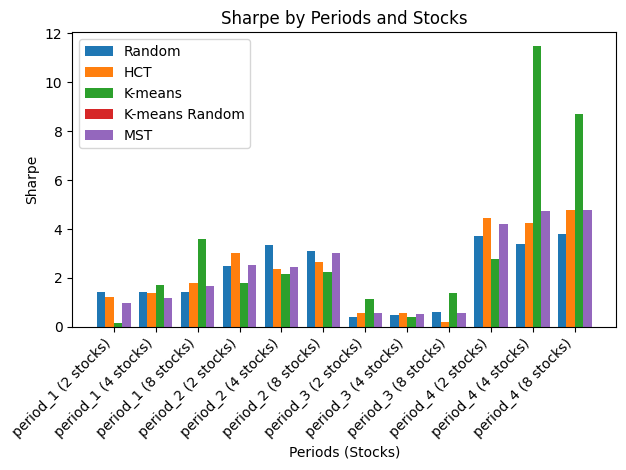

Total Average Sharpe of Random Values: 2.1339953701614127
Total Average Sharpe of Cluster Values: 2.268515734333654
Total Average Sharpe of K-means Values: 3.1314689899342176
Total Average Sharpe of K-means Random Values: 2.263080899411058
Total Average Sharpe of MST Values: 2.018252960556762

Period 1 Average Sharpe of Random Values: 1.4202443913392335
Period 1 Average Sharpe of Cluster Values: 1.4679448106856754
Period 1 Average Sharpe of K-means Values: 1.8236703921543675
Period 1 Average Sharpe of K-means Random Values: 1.2844502318385123
Period 1 Average Sharpe of MST: 1.4050014558671216
Period 2 Average Sharpe of Random Values: 2.98277952825098
Period 2 Average Sharpe of Cluster Values: 2.6723044143143646
Period 2 Average Sharpe of K-means Values: 2.0740589386231982
Period 2 Average Sharpe of K-means Random Values: 2.655233105844809
Period 2 Average Sharpe of MST: 2.455600521027459
Period 3 Average Sharpe of Random Values: 0.49519972860223455
Period 3 Average Sharpe of Cluster Va

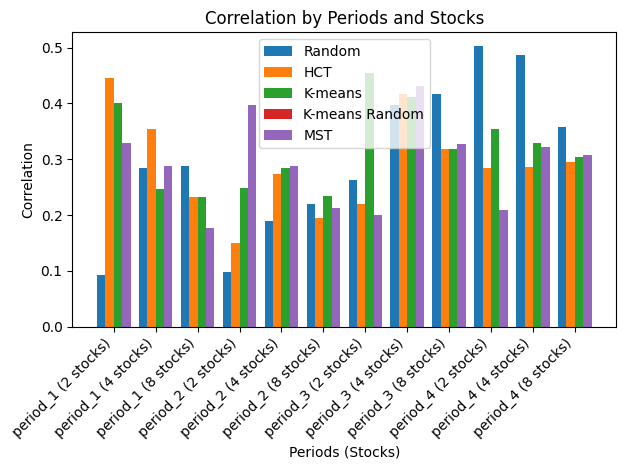

Total Average Correlation of Random Values: 0.2995509064157481
Total Average Correlation of Cluster Values: 0.28940678740979525
Total Average Correlation of K-means Values: 0.31815895949845824
Total Average Correlation of K-means Random Values: 0.2908803263820023
Total Average Correlation of MST Values: 0.32131440317813065

Period 1 Average Correlation of Random Values: 0.2217987808775881
Period 1 Average Correlation of Cluster Values: 0.3438953309184802
Period 1 Average Correlation of K-means Values: 0.29331455420935937
Period 1 Average Correlation of K-means Random Values: 0.2644935080889535
Period 1 Average Correlation of MST: 0.27413671984617927
Period 2 Average Correlation of Random Values: 0.16945788456821795
Period 2 Average Correlation of Cluster Values: 0.20582657879494679
Period 2 Average Correlation of K-means Values: 0.255362444925268
Period 2 Average Correlation of K-means Random Values: 0.299371557733945
Period 2 Average Correlation of MST: 0.23364822509745417
Period 3 Av

In [25]:
# Plotting Mean
plot_metric('Mean',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting SD
plot_metric('SD',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Correlation
plot_metric('Correlation',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

In [26]:
def plot_metric_kmeans(metric_name,result_df_kmeans,result_df_kmeans_rand):
    labels = list(result_df_kmeans.index)
    
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.35  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects3 = ax.bar(x - width/2, kmeans_values, width, label='K-means Centroid')
    rects4 = ax.bar(x + width/2, kmeans_rand_values, width, label='K-means Random')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))

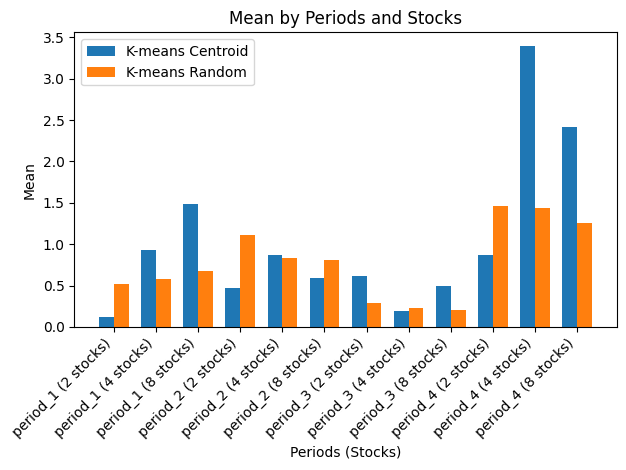

Total Average Mean of K-means Centroid Values: 1.0369734228285694
Total Average Mean of K-means Random Values: 0.7834605782476277

Period 1 Average Mean of K-means Centroid Values: 0.8476305013018015
Period 1 Average Mean of K-means Random Values: 0.5884136991710379
Period 2 Average Mean of K-means Centroid Values: 0.6413138596663246
Period 2 Average Mean of K-means Random Values: 0.9175200063683421
Period 3 Average Mean of K-means Centroid Values: 0.43565979310629793
Period 3 Average Mean of K-means Random Values: 0.2423767029418988


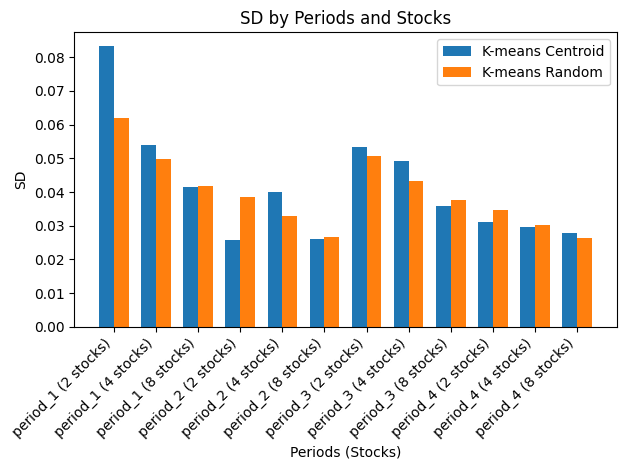

Total Average SD of K-means Centroid Values: 0.04146314652855157
Total Average SD of K-means Random Values: 0.03954465629958113

Period 1 Average SD of K-means Centroid Values: 0.059518275556651005
Period 1 Average SD of K-means Random Values: 0.051210304656741736
Period 2 Average SD of K-means Centroid Values: 0.03070731489078116
Period 2 Average SD of K-means Random Values: 0.03267222336978414
Period 3 Average SD of K-means Centroid Values: 0.04614960347713162
Period 3 Average SD of K-means Random Values: 0.04388457746402557


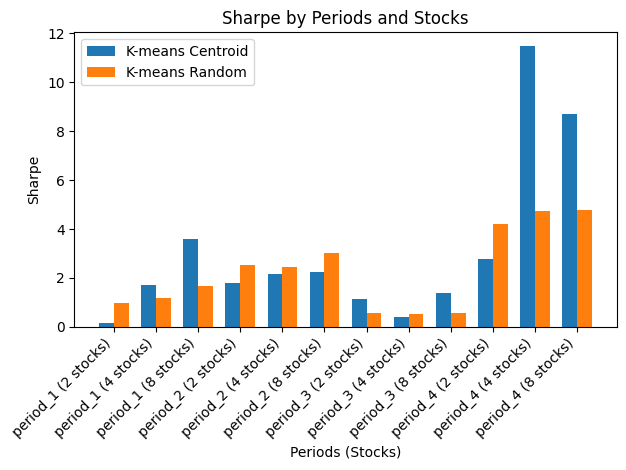

Total Average Sharpe of K-means Centroid Values: 3.1314689899342176
Total Average Sharpe of K-means Random Values: 2.263080899411058

Period 1 Average Sharpe of K-means Centroid Values: 1.8236703921543675
Period 1 Average Sharpe of K-means Random Values: 1.2844502318385123
Period 2 Average Sharpe of K-means Centroid Values: 2.0740589386231982
Period 2 Average Sharpe of K-means Random Values: 2.655233105844809
Period 3 Average Sharpe of K-means Centroid Values: 0.9774020820143177
Period 3 Average Sharpe of K-means Random Values: 0.543250589617139


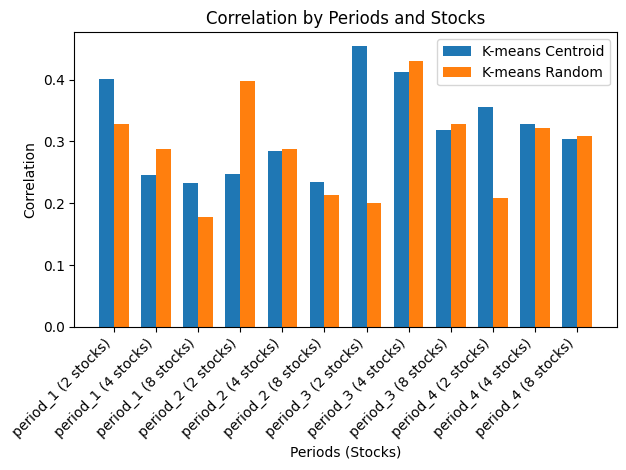

Total Average Correlation of K-means Centroid Values: 0.31815895949845824
Total Average Correlation of K-means Random Values: 0.2908803263820023

Period 1 Average Correlation of K-means Centroid Values: 0.29331455420935937
Period 1 Average Correlation of K-means Random Values: 0.2644935080889535
Period 2 Average Correlation of K-means Centroid Values: 0.255362444925268
Period 2 Average Correlation of K-means Random Values: 0.299371557733945
Period 3 Average Correlation of K-means Centroid Values: 0.3946424599720642
Period 3 Average Correlation of K-means Random Values: 0.3197531357842317


In [27]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans,result_df_kmeans_rand)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans,result_df_kmeans_rand)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans,result_df_kmeans_rand)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans,result_df_kmeans_rand)

### Analyze Performance in the next period

In [28]:
def calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_stocks = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlations = []
            selected_stocks_list = {}

            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(train_returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]

            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}
        results_by_period[test_period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

In [29]:
num_stocks_list = [2, 4, 8]
result_df_random_test1 = calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list)
result_df_random_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.988936,0.036674,2.321246,0.234730,"[TSCO, VRSN, CSX, CSCO, GILD, INTC, SHPG, AAPL..."
period_2 (4 stocks),0.904126,0.030930,2.757332,0.236452,"[REGN, INTU, SIRI, KLAC, SHPG, EBAY, AAPL, JBH..."
period_2 (8 stocks),0.832218,0.026821,3.061256,0.237361,"[REGN, MAR, ILMN, GILD, ADP, AAPL, NVDA, TXN, ..."
period_3 (2 stocks),0.202300,0.049354,0.397593,0.404543,"[NVDA, EBAY, MNST, GILD, ROST, SIRI, MAT, JBHT..."
period_3 (4 stocks),0.215672,0.043902,0.486347,0.407011,"[VRTX, BIIB, FAST, ROST, SIRI, INCY, VOD, ILMN..."
period_3 (8 stocks),0.241718,0.040709,0.594145,0.406991,"[GILD, CTSH, NVDA, MSFT, NTAP, VOD, EA, MNST, ..."
period_4 (2 stocks),1.089380,0.033966,3.177368,0.368327,"[ROST, XRAY, EA, ILMN, TXN, ILMN, SIRI, VOD, J..."
period_4 (4 stocks),0.999094,0.029360,3.425309,0.372111,"[INCY, MAT, ADI, LRCX, JBHT, TSCO, EBAY, KLAC,..."
period_4 (8 stocks),1.021006,0.026900,3.818384,0.371003,"[VOD, AMZN, GILD, SHPG, TXN, REGN, ADP, AAPL, ..."


In [30]:
def calculate_metrics_for_all_clusters_test(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        selected_stocks_list = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]

                try:
                    selected_stocks_list[num_clusters] = np.concatenate([selected_stocks_list[num_clusters], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)

            final_stocks_list = [selected_stocks_list[num_clusters]]

            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}

        results_by_period[test_period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [31]:
result_df_HCT_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_HCT, period_dfs)
result_df_HCT_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.806310,0.036720,1.871260,0.237287,"[INTU, VRSN, TSCO, INTC, CSX, MSFT, JBHT, MSFT..."
period_2 (4 stocks),0.881762,0.029704,2.812012,0.231155,"[VOD, INTC, SHPG, PCAR, VOD, KLAC, TSCO, CSX, ..."
period_2 (8 stocks),0.790149,0.025772,2.986813,0.219870,"[EA, EBAY, TXN, XRAY, VRTX, ORLY, ROST, JBHT, ..."
period_3 (2 stocks),0.164399,0.049605,0.342697,0.353854,"[SHPG, ADP, WBA, ISRG, ILMN, VRTX, AAPL, ORCL,..."
period_3 (4 stocks),0.260763,0.044342,0.584711,0.382458,"[EA, VRTX, ROST, NTAP, AAPL, INCY, MAR, LRCX, ..."
period_3 (8 stocks),0.181606,0.038968,0.461204,0.380955,"[BIIB, GILD, EBAY, NVDA, ORCL, MAR, VOD, SRCL,..."
period_4 (2 stocks),1.129613,0.034005,3.287987,0.325816,"[AAPL, ISRG, ORLY, MNST, LRCX, MNST, CTSH, SHP..."
period_4 (4 stocks),1.209642,0.029114,4.151604,0.318887,"[ORLY, VOD, NVDA, ILMN, ORLY, VRSN, INTC, SRCL..."
period_4 (8 stocks),1.339612,0.025785,5.199058,0.307035,"[AAPL, MSFT, ADI, FAST, AMGN, MNST, WBA, SIRI,..."


In [32]:
result_df_kmeans_rand_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.943097,0.037833,2.190094,0.244597,"[MAR, SRCL, ORCL, REGN, ADI, ISRG, MAR, VRTX, ..."
period_2 (4 stocks),1.098853,0.032185,3.252003,0.214430,"[EBAY, REGN, AMGN, ROST, ADI, MAT, GILD, SRCL,..."
period_2 (8 stocks),1.680527,0.029384,5.703050,0.205146,"[INCY, LRCX, ILMN, MNST, MAT, EA, CSCO, WBA, I..."
period_3 (2 stocks),0.129248,0.049899,0.259645,0.415663,"[MCHP, VRSN, TXN, WBA, MAR, JBHT, ADI, VRTX, L..."
period_3 (4 stocks),0.275679,0.044655,0.601170,0.402042,"[EA, ISRG, MSFT, NVDA, ILMN, EBAY, ROST, KLAC,..."
period_3 (8 stocks),0.283096,0.040566,0.694580,0.388983,"[ROST, TXN, BIIB, SHPG, SIRI, PCAR, AMZN, INTU..."
period_4 (2 stocks),1.199252,0.034246,3.483256,0.325513,"[ROST, VOD, ADP, VOD, ADBE, TSCO, CTSH, INTU, ..."
period_4 (4 stocks),1.048380,0.028957,3.614468,0.368390,"[JBHT, REGN, VRSN, MCHP, EBAY, AMZN, INTU, ADI..."
period_4 (8 stocks),1.459112,0.024677,5.900144,0.294003,"[MSFT, SIRI, KLAC, VRTX, JBHT, AMGN, INCY, ORL..."


In [33]:
def calculate_metrics_for_kmeans_test(all_cluster_stocks, period_dfs, centroid_vectors, distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        stocks_by_cluster = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[train_period][str(num_clusters)]
                distance_matrix = distance_matrices[train_period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks": [selected_stocks]}

        results_by_period[test_period] = results_by_cluster
        stocks_by_period[test_period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [34]:
result_df_kmeans_test1, stocks_by_period_kmeans_test1 = calculate_metrics_for_kmeans_test(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)
result_df_kmeans_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),2.571631,0.043881,5.860432,0.162893,"[MAR, ILMN]"
period_2 (4 stocks),1.174138,0.029972,3.917389,0.209001,"[MSFT, ORLY, ILMN, JBHT]"
period_2 (8 stocks),1.365210,0.030155,4.527351,0.234481,"[INCY, INTC, JBHT, MNST, ORLY, CTSH, TSCO, SHPG]"
period_3 (2 stocks),-0.084194,0.054652,-0.154054,0.580690,"[PCAR, MAT]"
period_3 (4 stocks),0.220370,0.054393,0.405143,0.427948,"[MAT, REGN, FAST, NVDA]"
period_3 (8 stocks),0.134996,0.040935,0.329783,0.427476,"[MAT, NVDA, REGN, SHPG, VOD, FAST, MSFT, ADP]"
period_4 (2 stocks),1.750491,0.037098,4.718523,0.127884,"[ROST, ILMN]"
period_4 (4 stocks),0.888801,0.034586,2.569834,0.296518,"[EBAY, ILMN, INTU, NVDA]"
period_4 (8 stocks),1.485279,0.023644,6.281732,0.308776,"[INTU, BIIB, EBAY, ILMN, ROST, AMGN, ISRG, SRCL]"


In [35]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters_out_sample(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        period_number = int(period[-1])
        if period_number == 4: #last period
            break
        else:
            next_period = 'period_'+str(period_number+1)
        
        next_returns_data = period_dfs[next_period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = next_returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = next_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[next_period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period_out_sample, mst_result_df_clusters_out_sample = calculate_metrics_for_mst_clusters_out_sample(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters_out_sample


,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.993071,0.037089,2.174408,0.247785,"[TXN, AMZN, INTC, PAYX, ADP, MCHP, GILD, BIIB,..."
period_2 (4 stocks),0.823830,0.029698,2.579548,0.231844,"[SIRI, SRCL, MCHP, INTC, FAST, VRSN, MCHP, KLA..."
period_2 (8 stocks),0.879957,0.026992,3.260620,0.233295,"[TXN, MNST, AMZN, ILMN, VRSN, KLAC, NVDA, NTAP..."
period_3 (2 stocks),0.224348,0.049889,0.415020,0.419977,"[FAST, MAR, VOD, EA, CTSH, ILMN, INTC, AMZN, M..."
period_3 (4 stocks),0.168560,0.045228,0.373447,0.417083,"[AAPL, AMGN, VRTX, REGN, CTSH, MCHP, VRTX, INT..."
period_3 (8 stocks),0.264533,0.041187,0.634687,0.405536,"[VOD, EBAY, BIIB, VRTX, MNST, PCAR, JBHT, ILMN..."
period_4 (2 stocks),1.114731,0.034389,3.230429,0.365014,"[WBA, ROST, AAPL, CSX, AAPL, GILD, INTU, INCY,..."
period_4 (4 stocks),1.156149,0.029832,3.880118,0.359955,"[ORLY, ROST, REGN, KLAC, ADI, GILD, CSCO, PCAR..."
period_4 (8 stocks),1.095336,0.027518,4.011362,0.382737,"[ADI, JBHT, EA, MCHP, XRAY, FAST, ISRG, MSFT, ..."


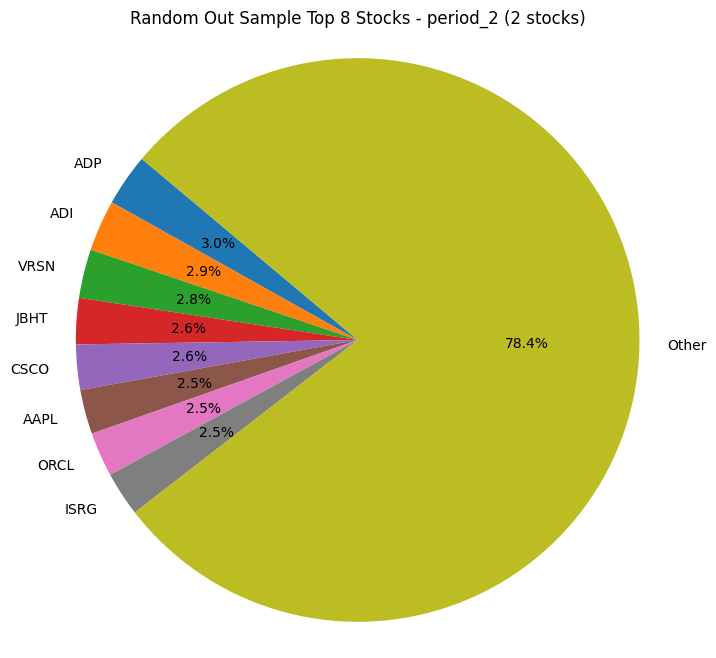

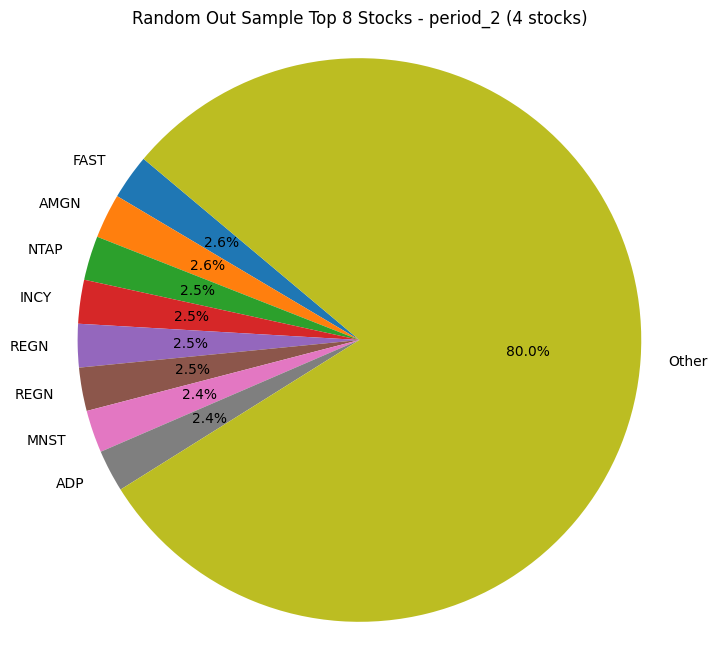

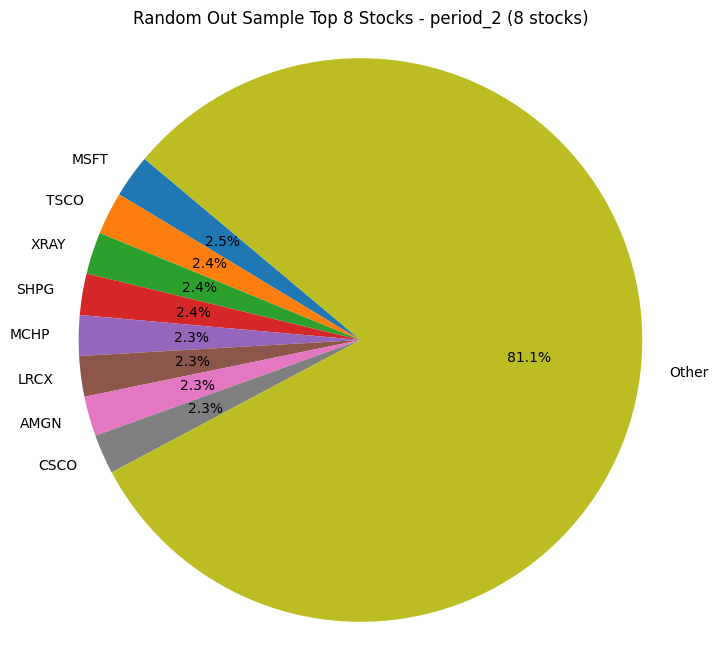

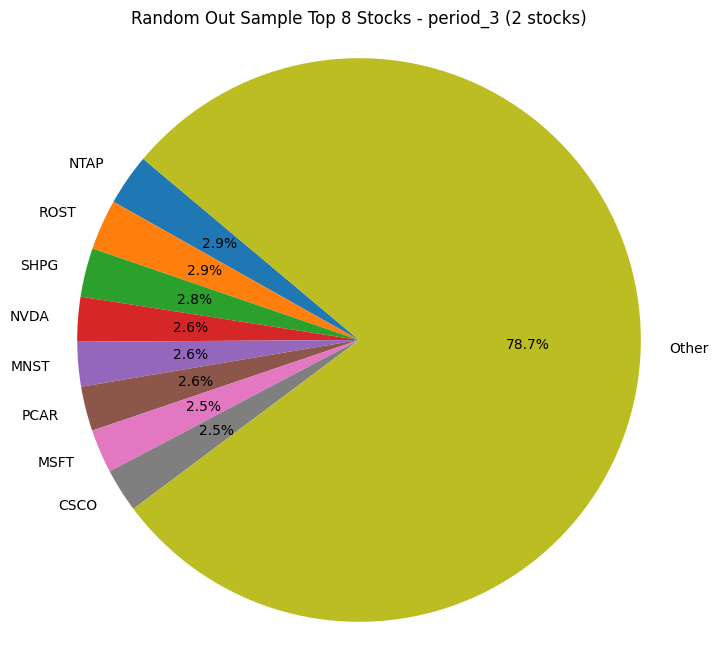

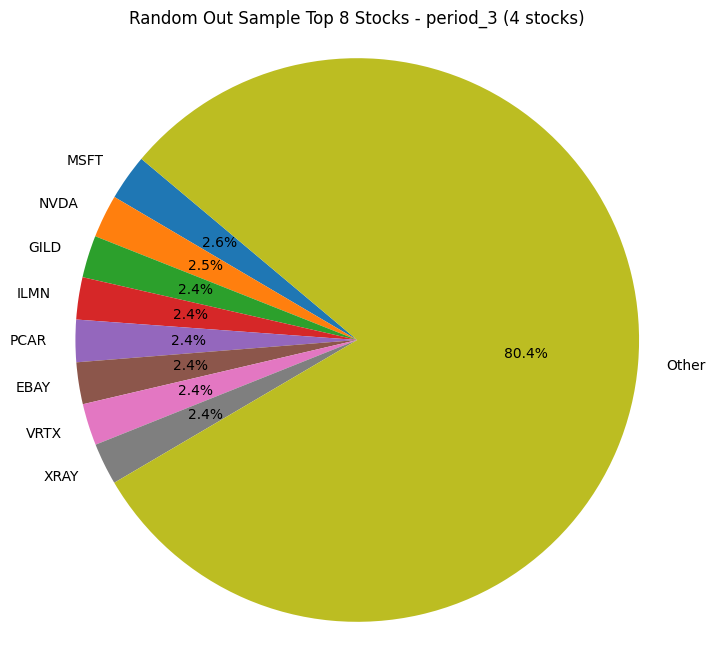

...

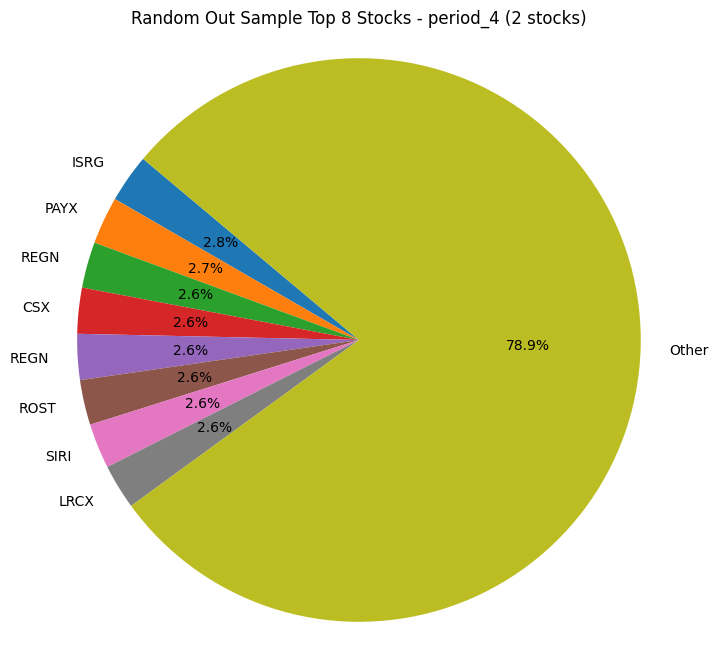

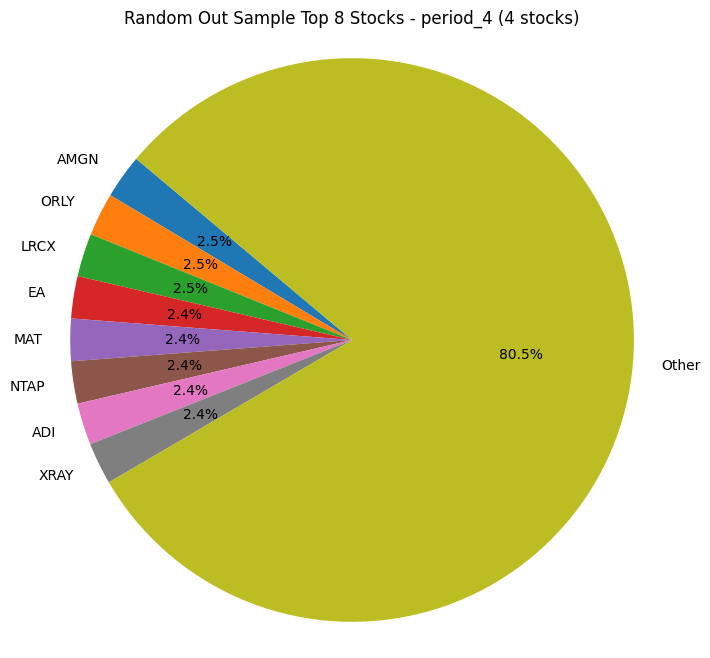

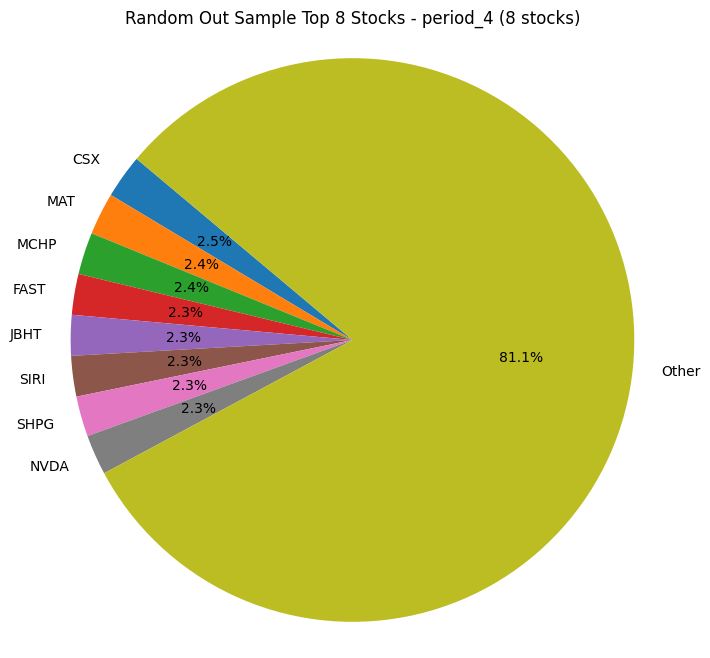

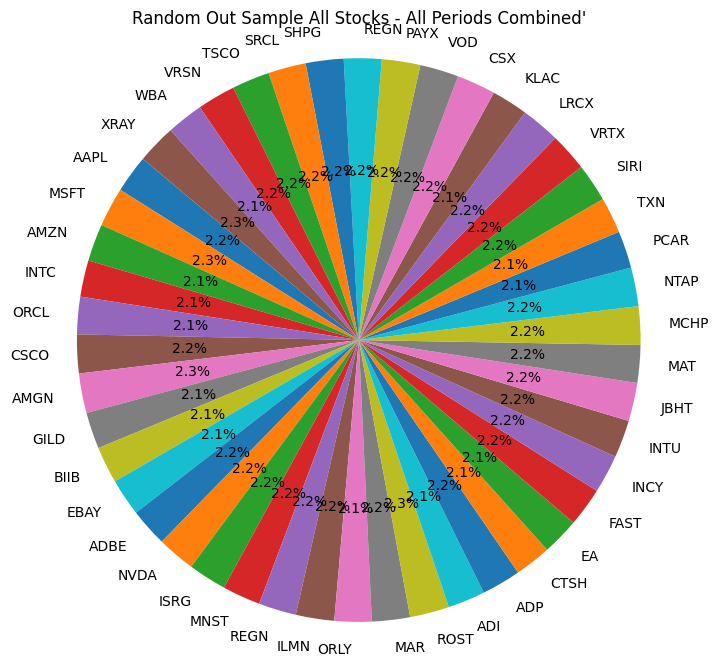

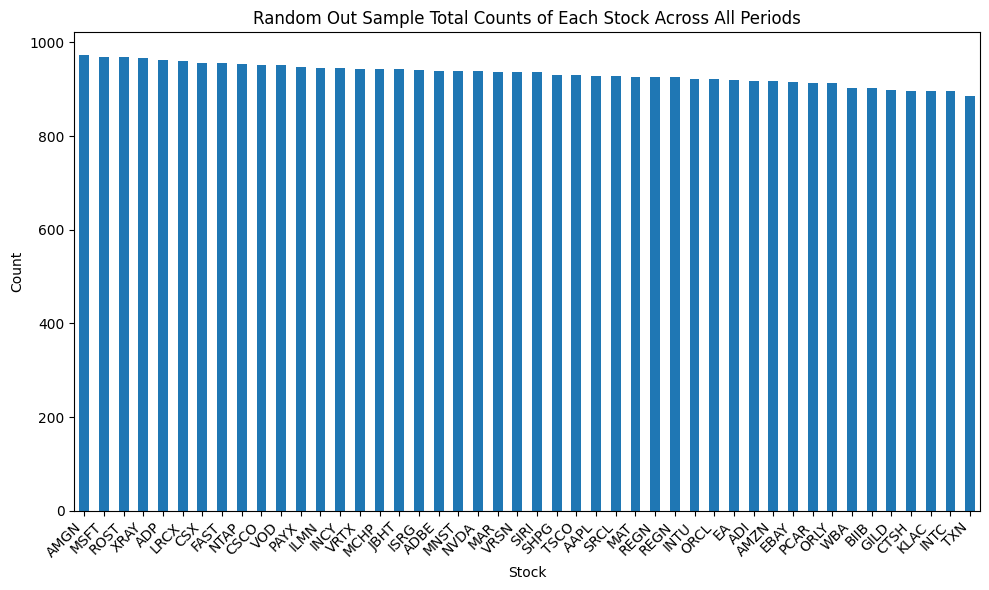

In [36]:
count_of_stocks(result_df_random_test1, custom_tickers, "Random Out Sample")

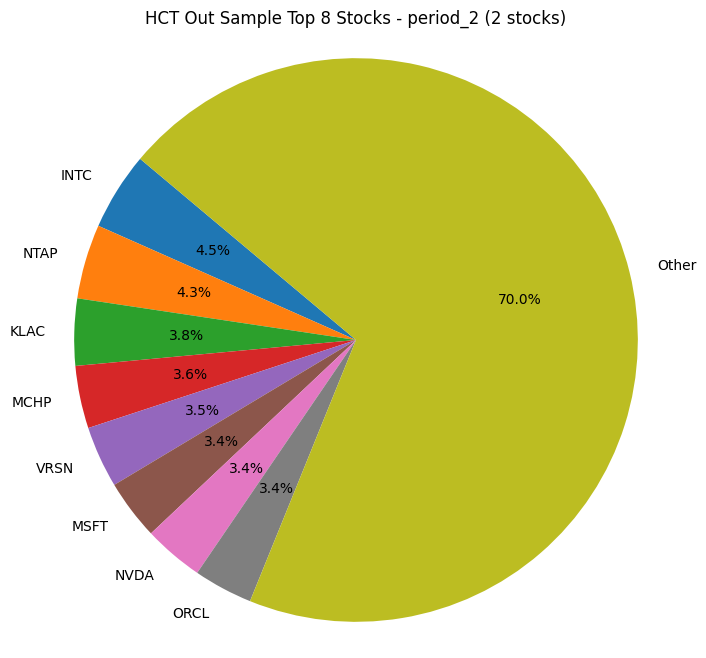

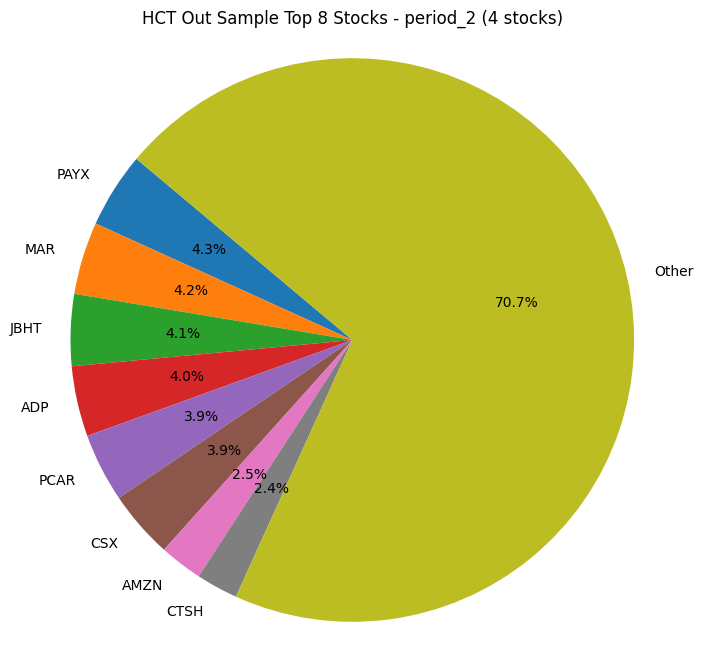

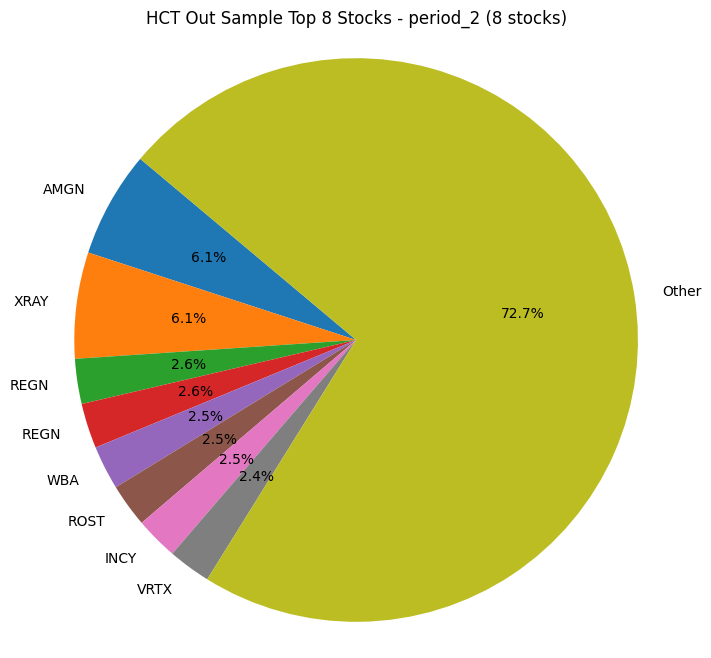

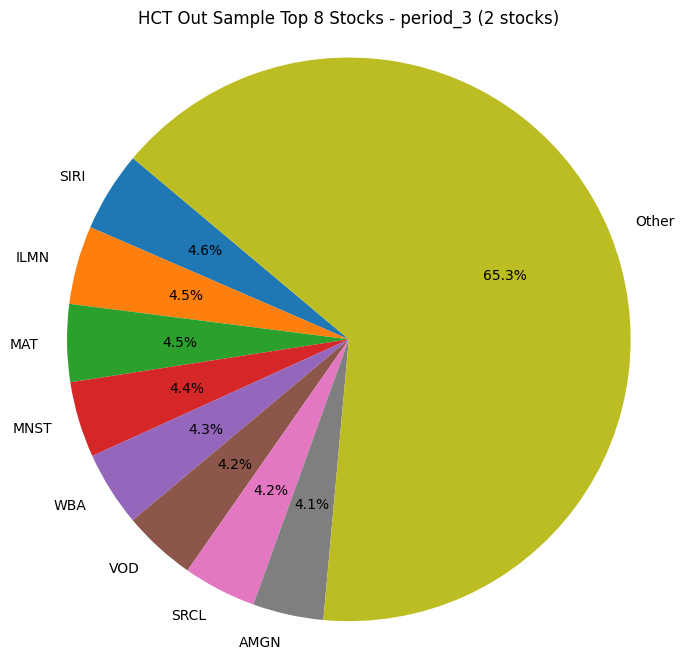

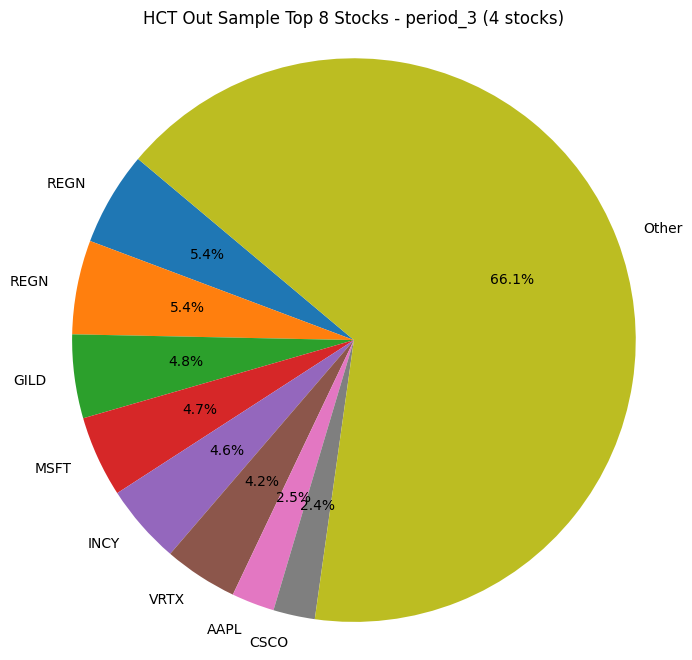

...

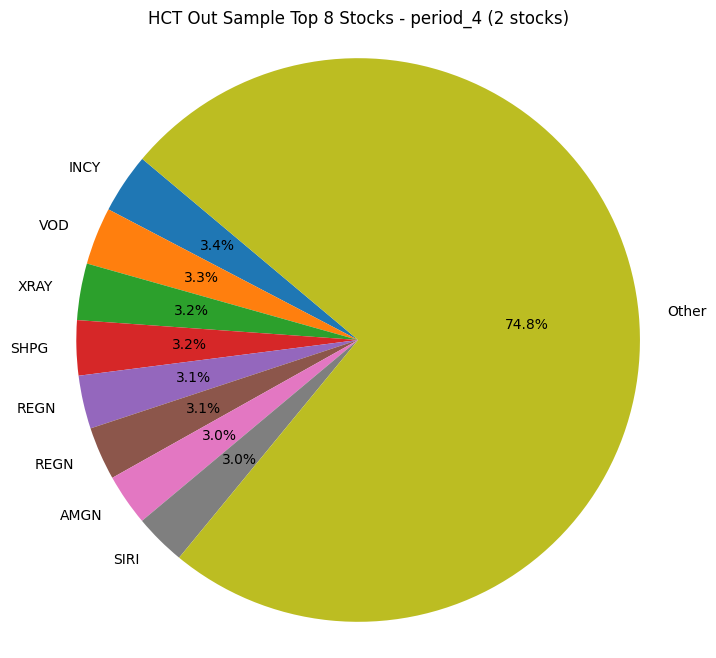

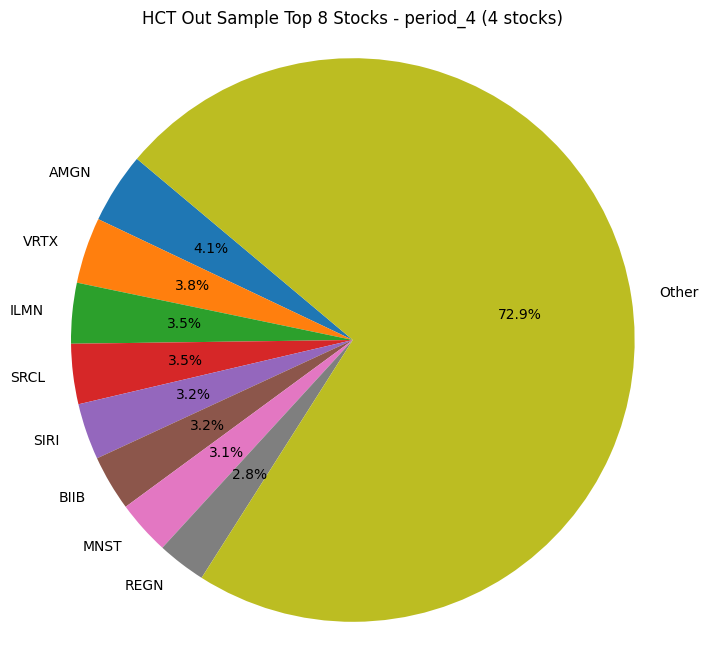

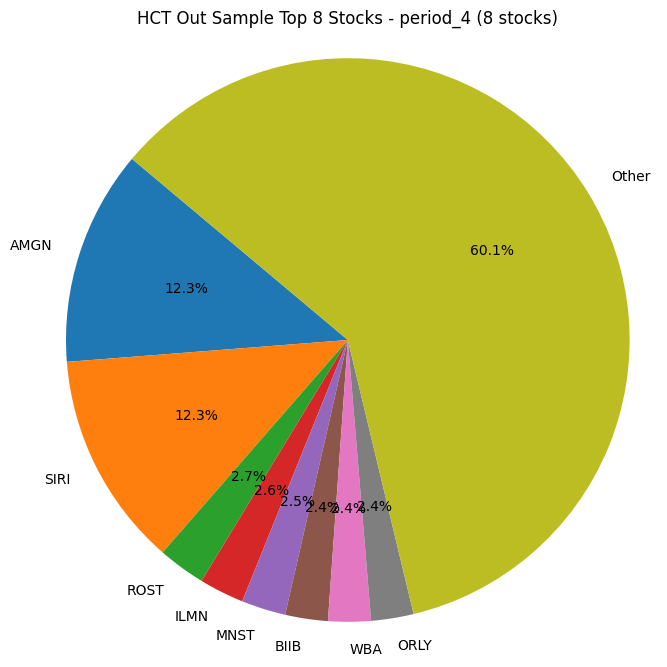

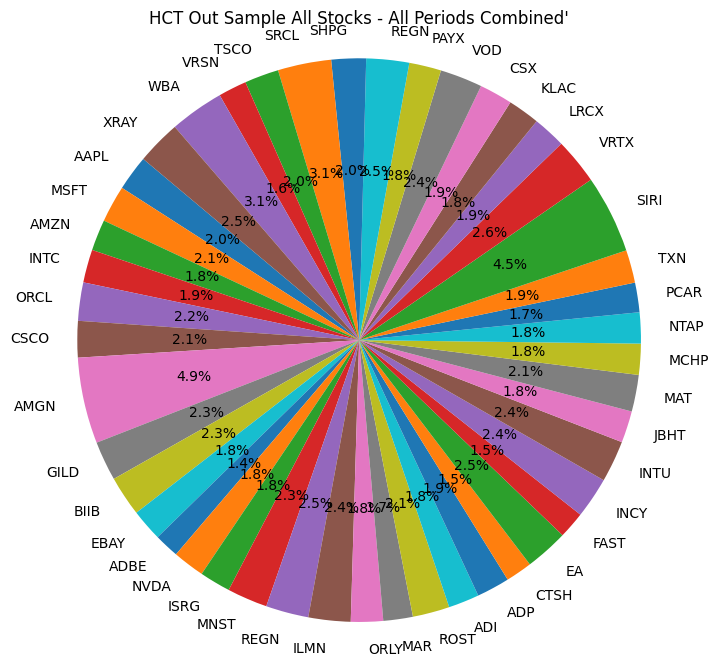

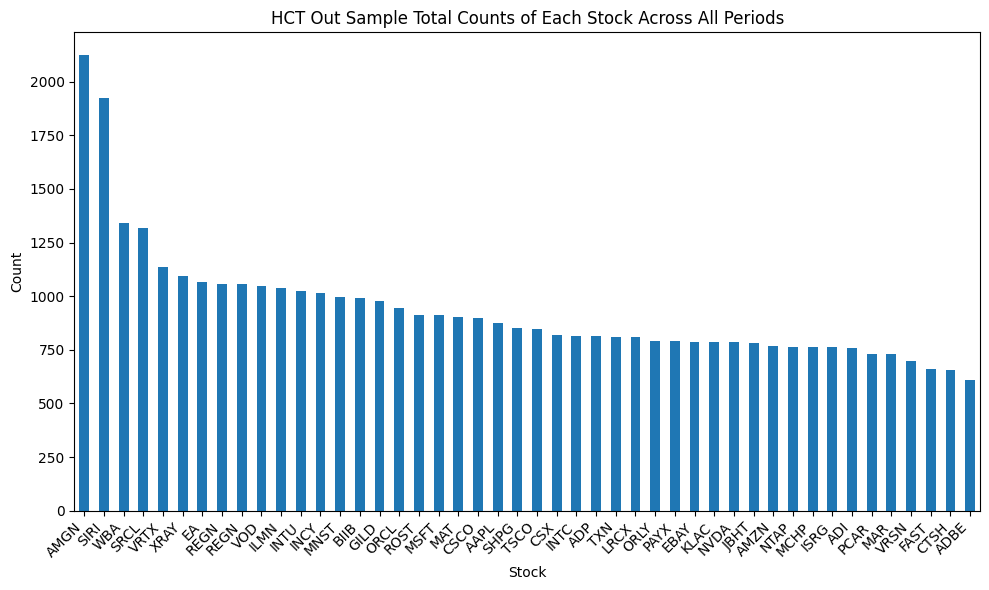

In [37]:
count_of_stocks(result_df_HCT_test1, custom_tickers, "HCT Out Sample")

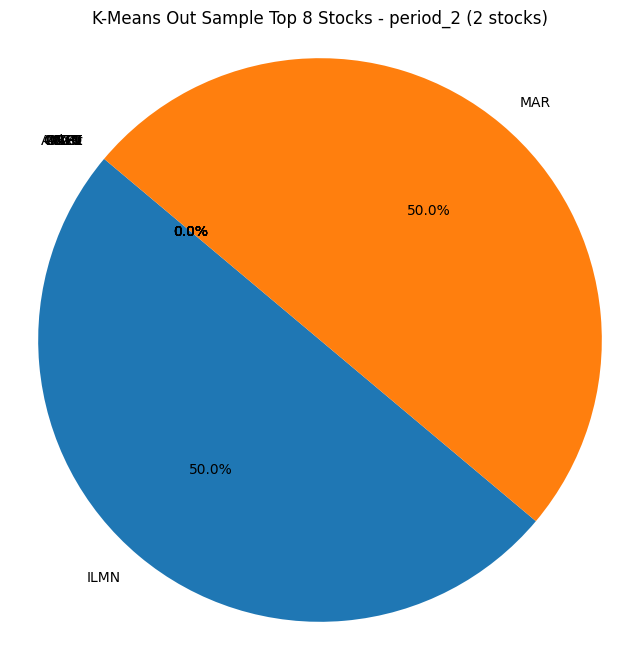

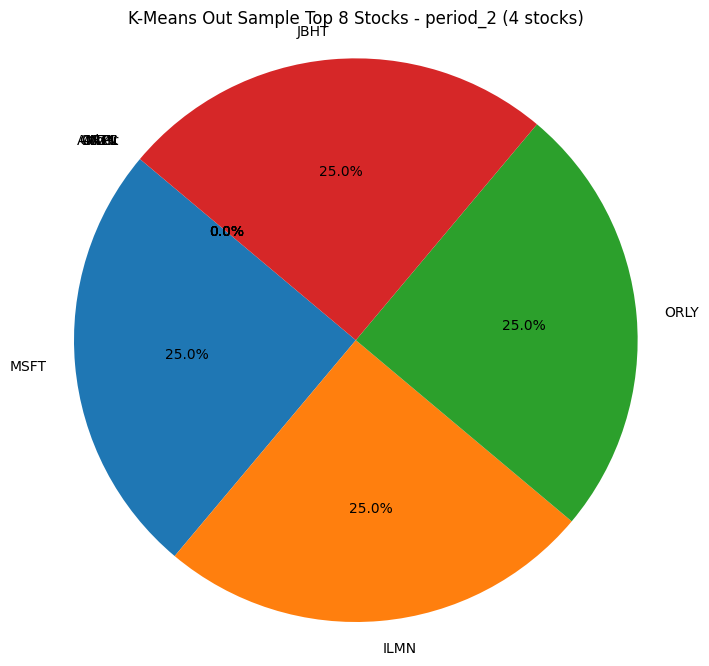

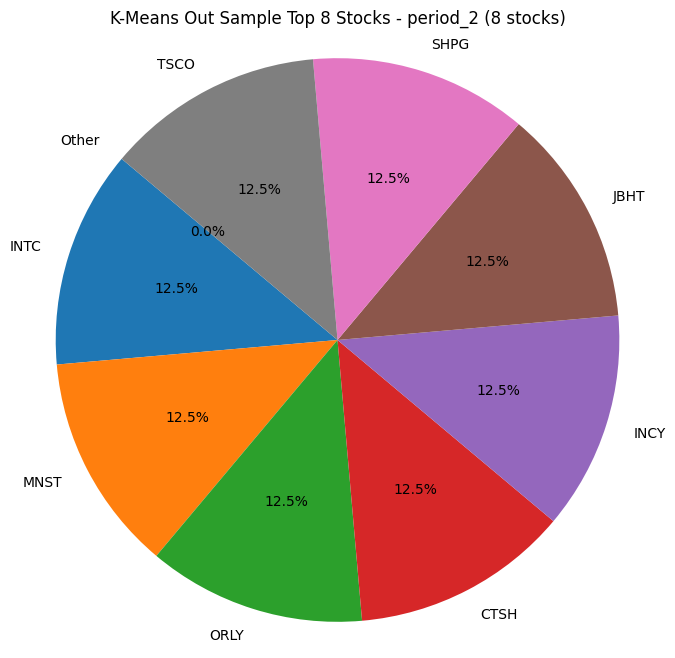

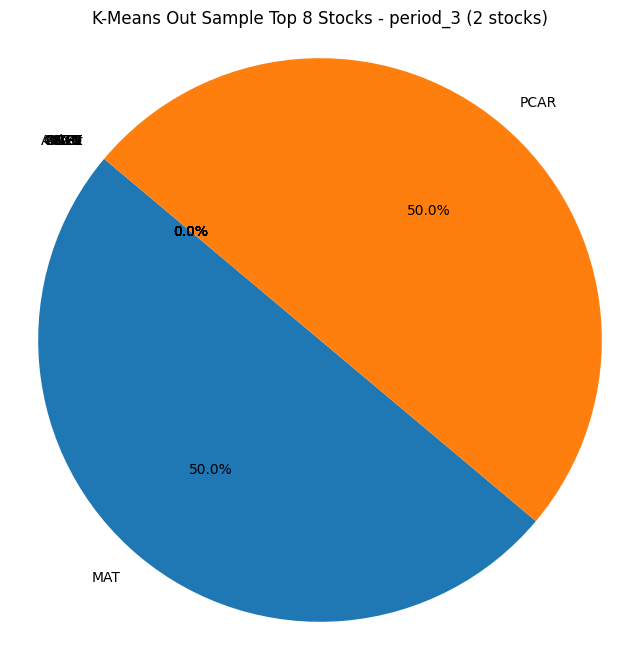

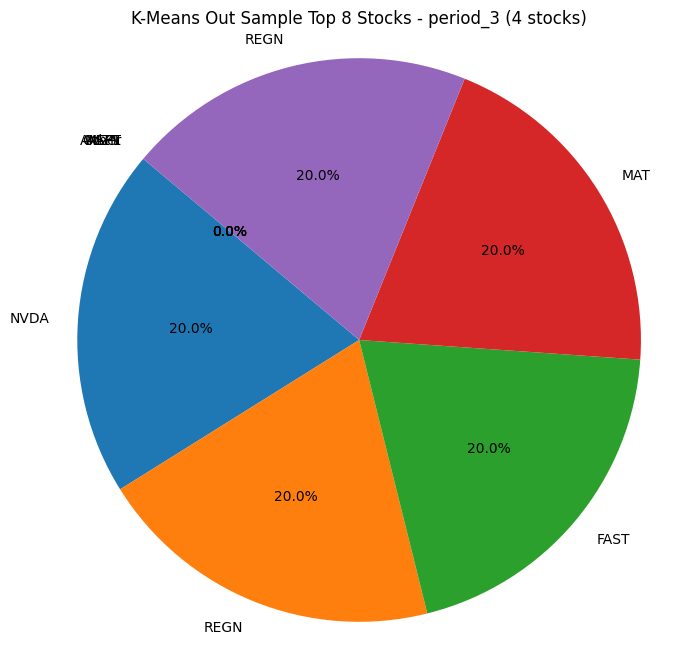

...

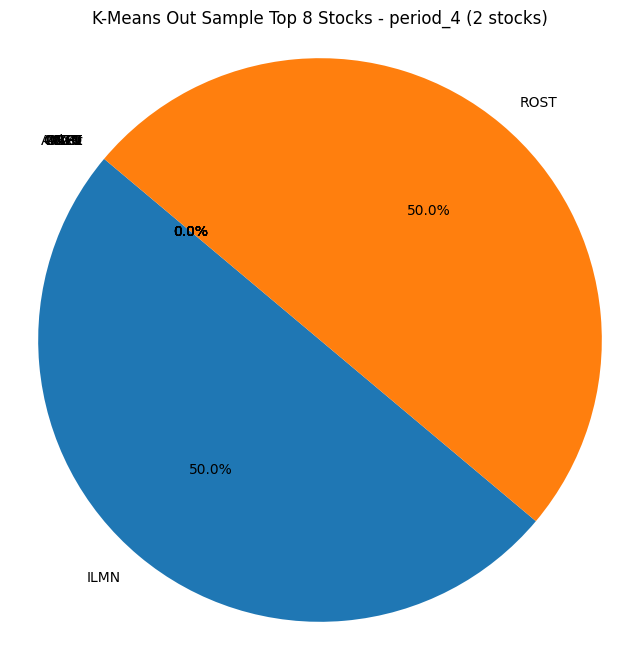

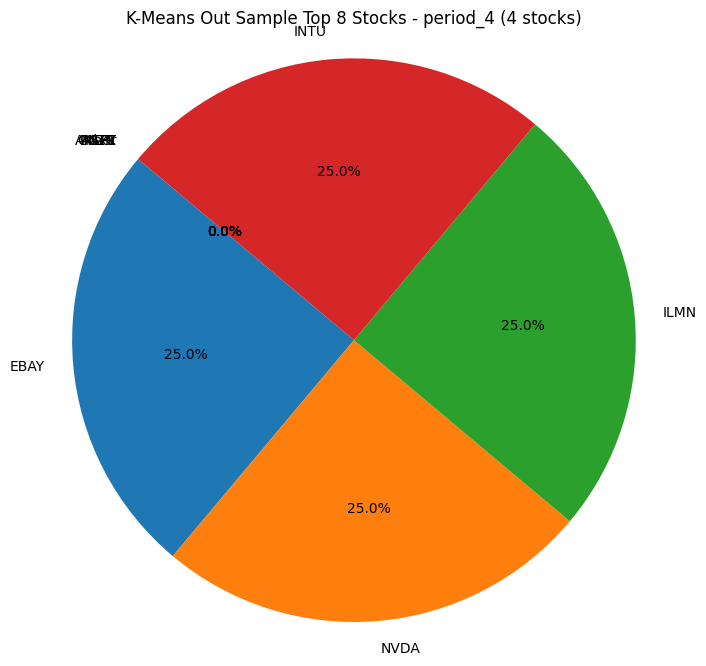

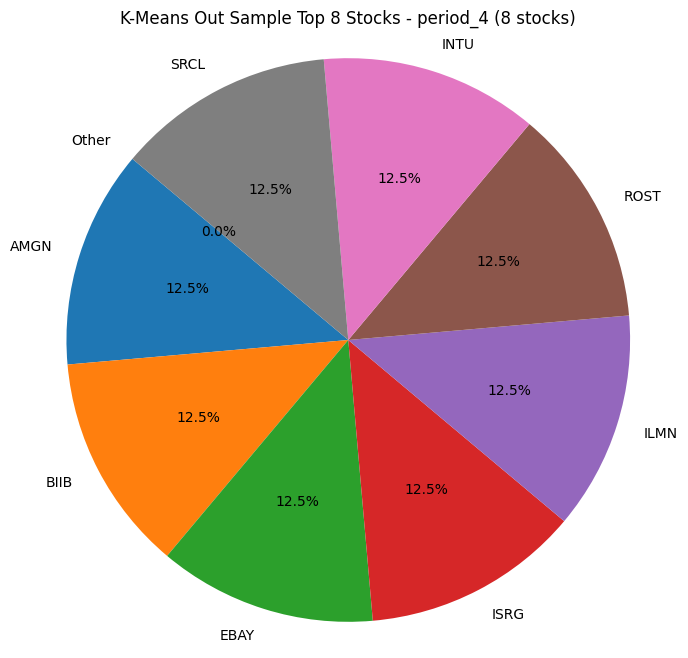

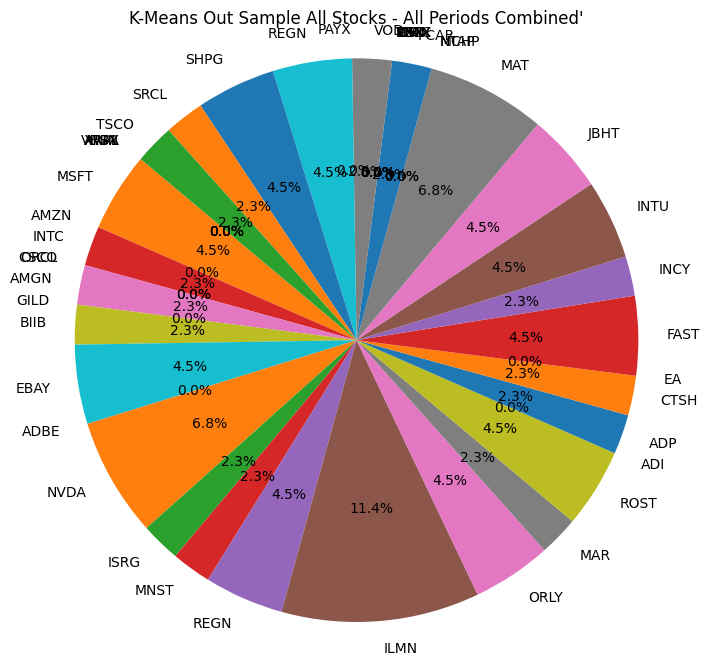

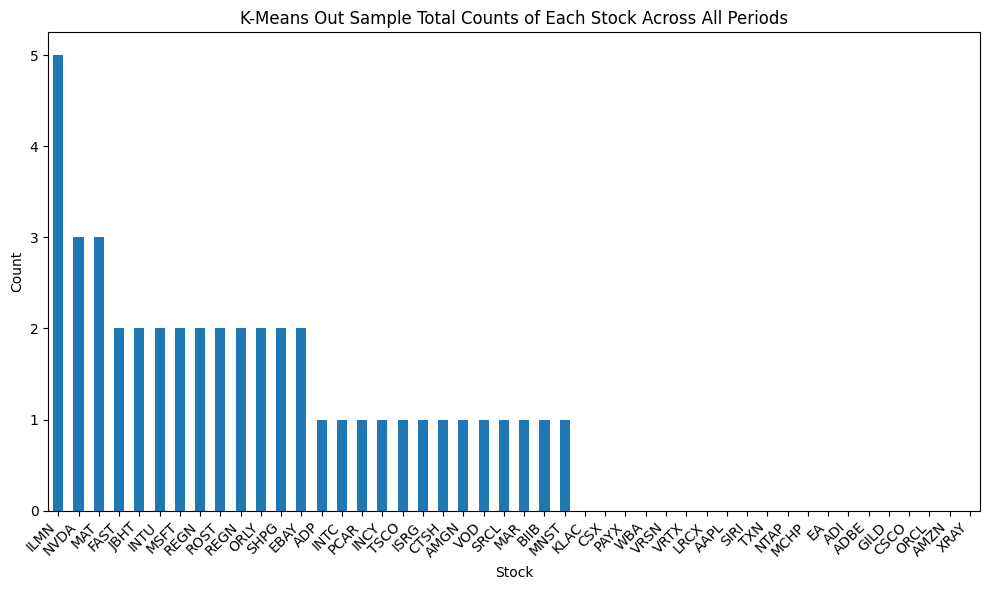

In [38]:
count_of_stocks(result_df_kmeans_test1, custom_tickers, "K-Means Out Sample")

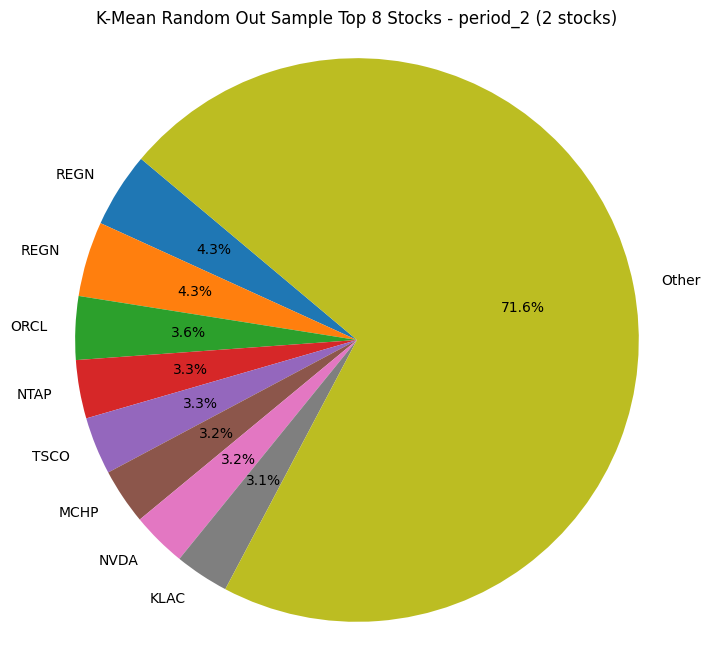

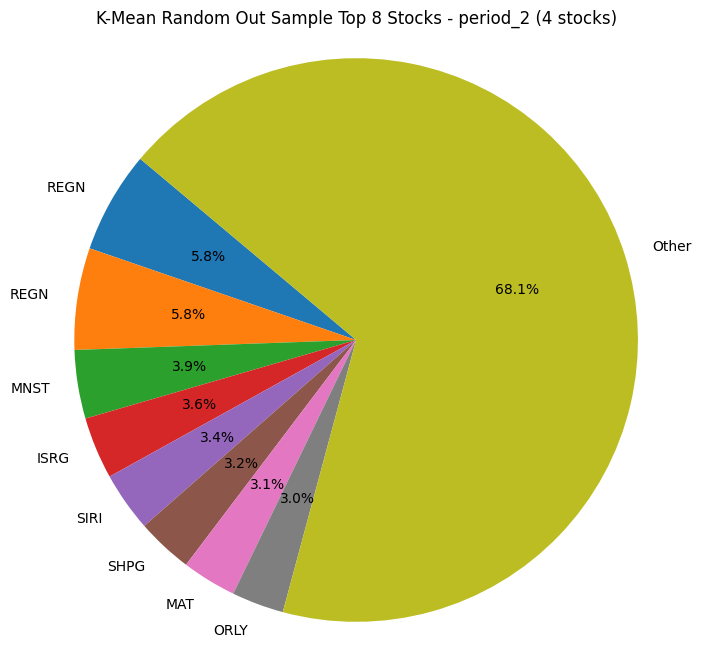

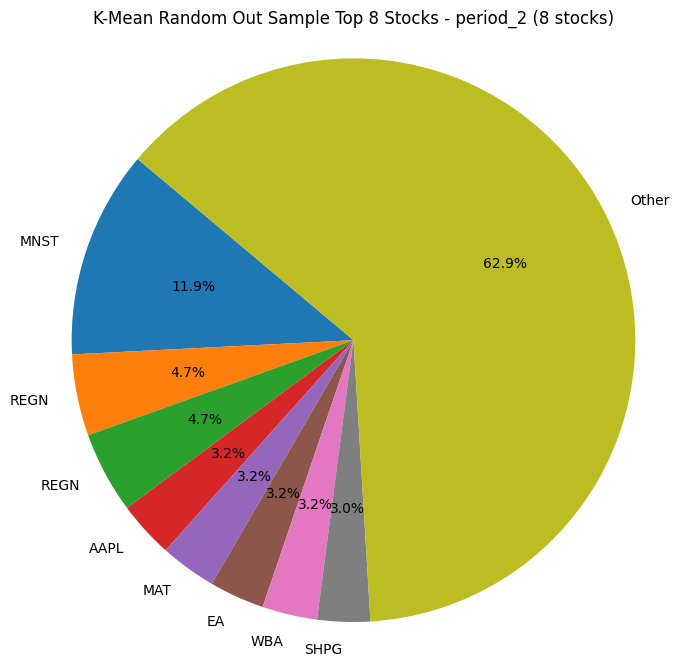

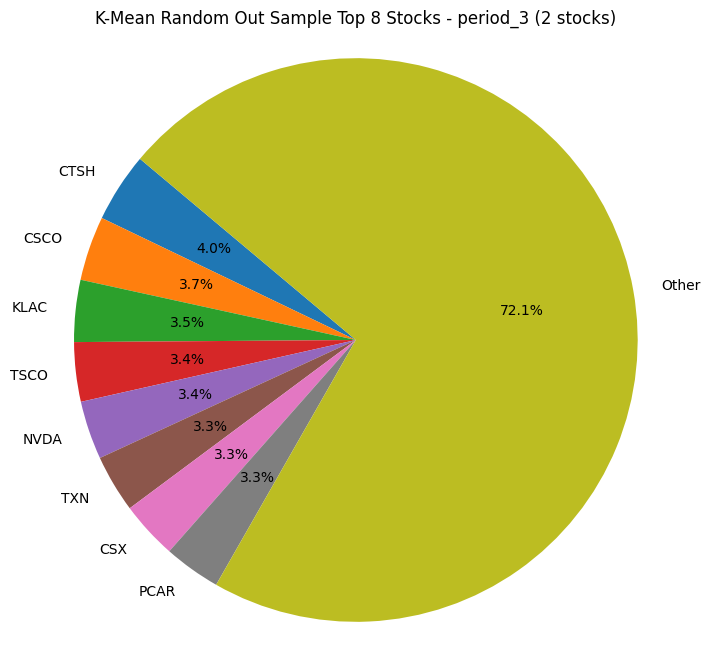

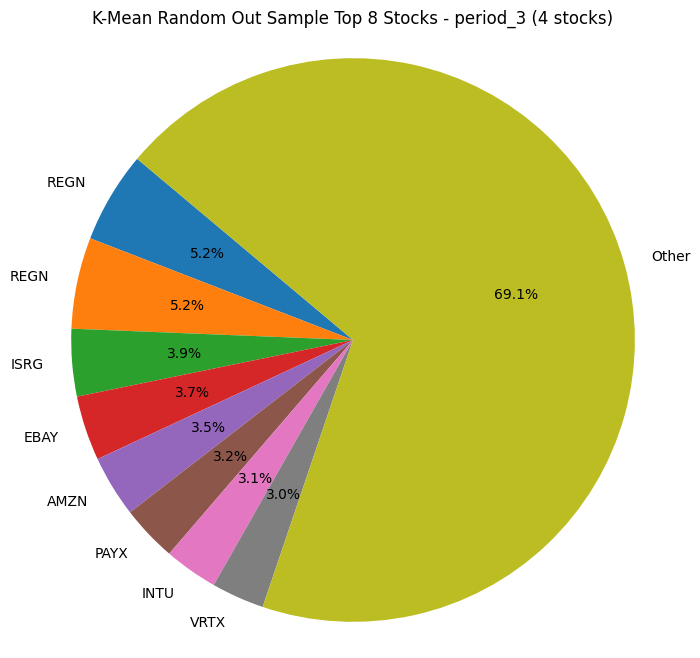

...

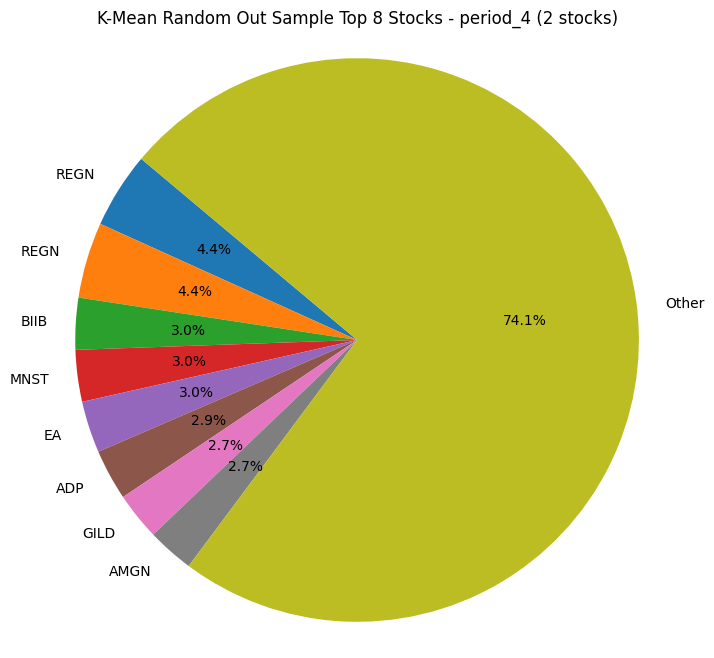

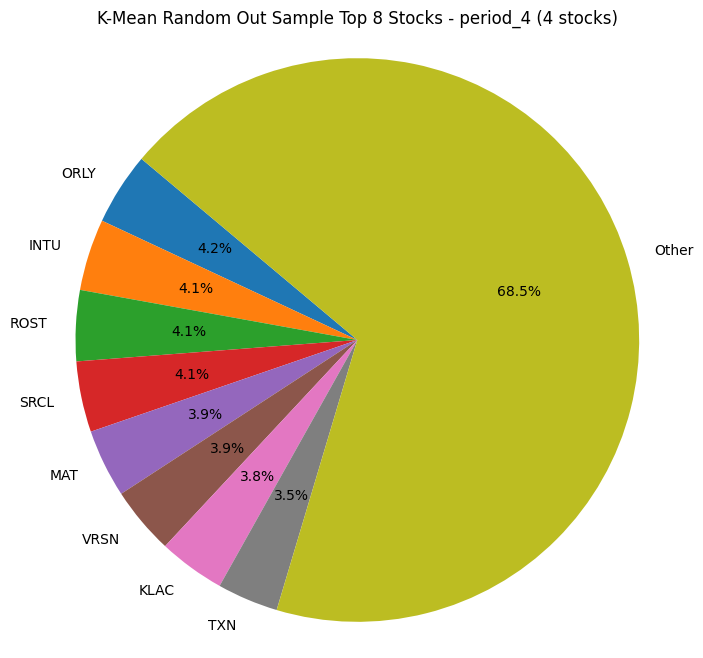

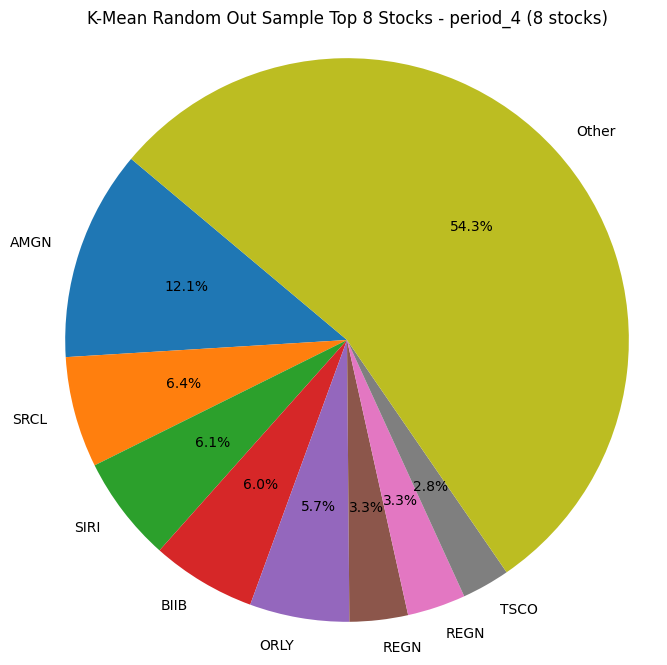

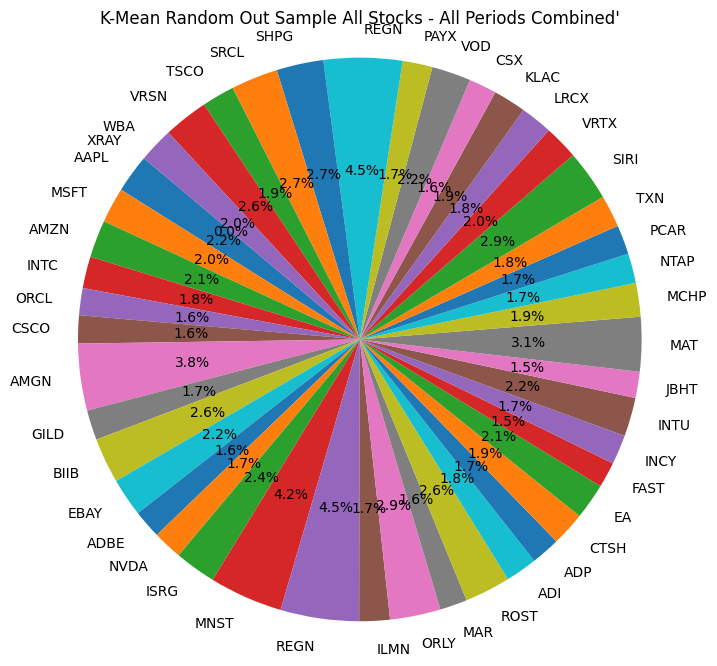

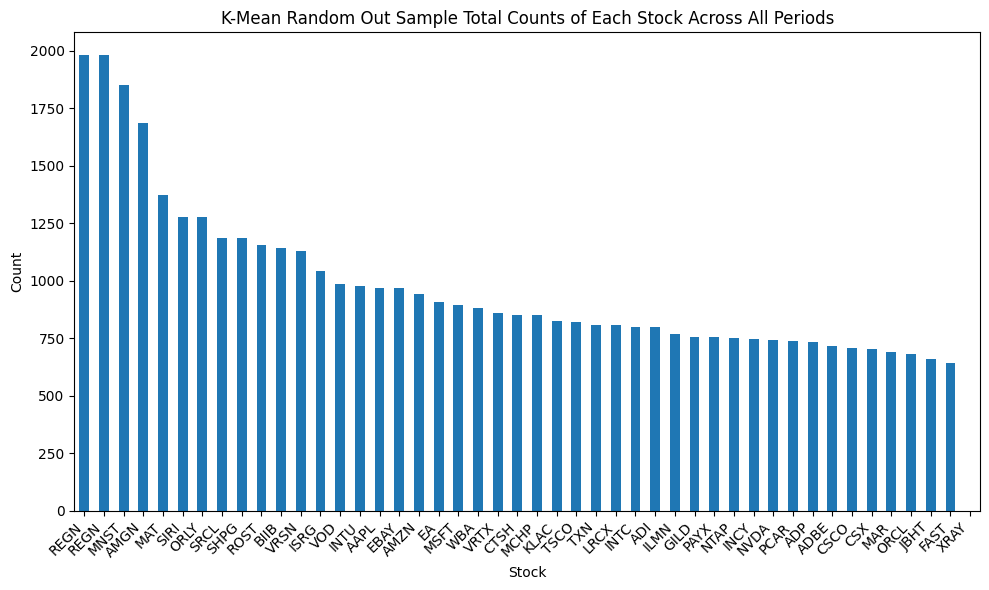

In [39]:
count_of_stocks(result_df_kmeans_rand_test1, custom_tickers, "K-Mean Random Out Sample")

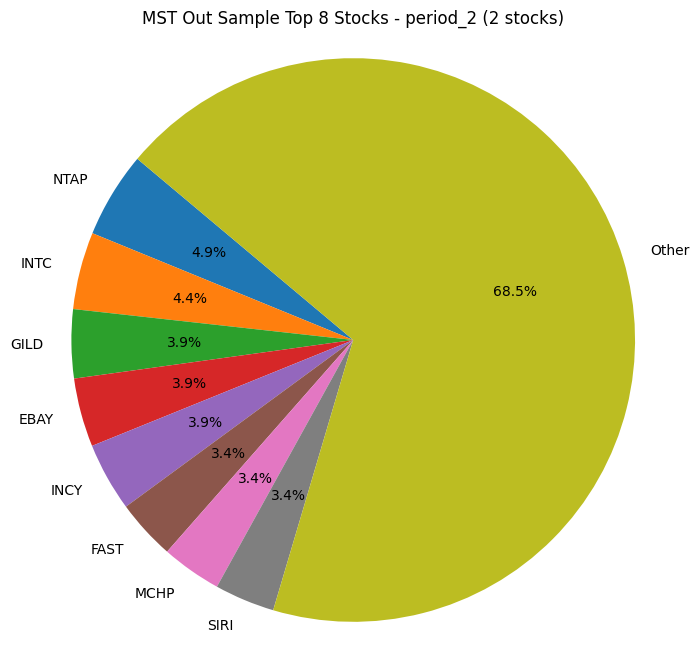

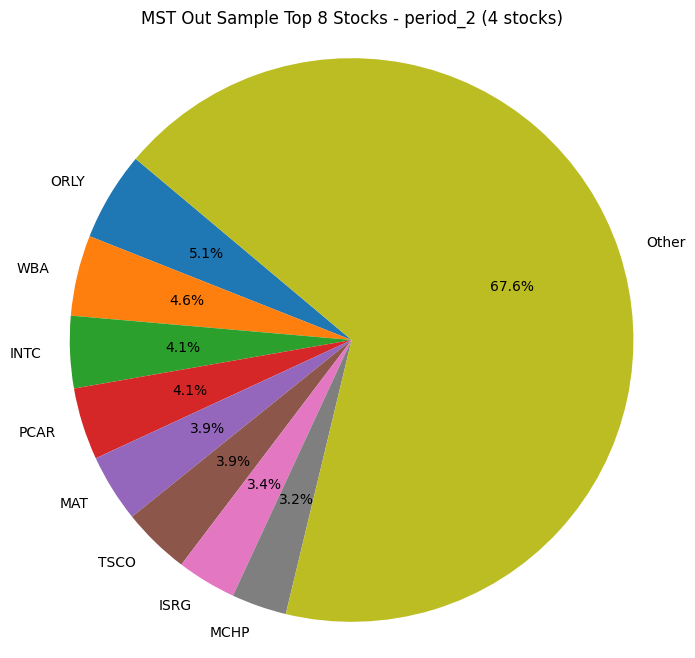

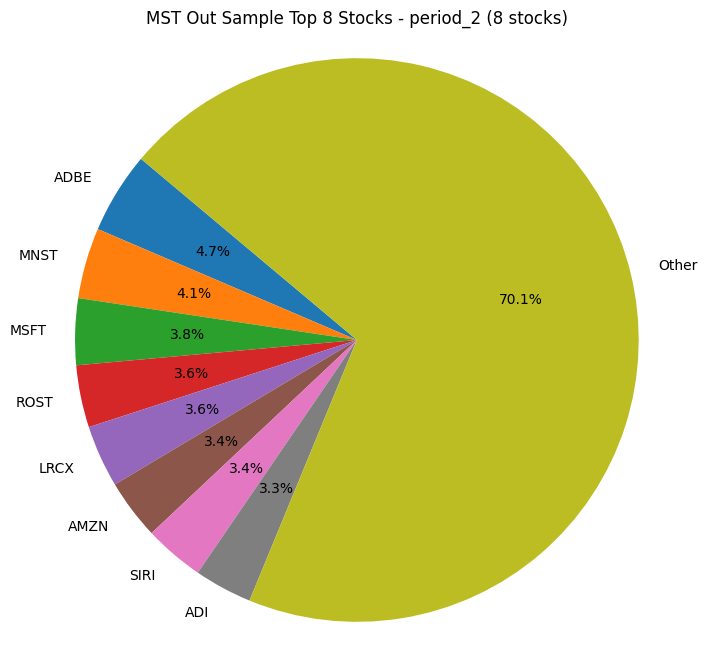

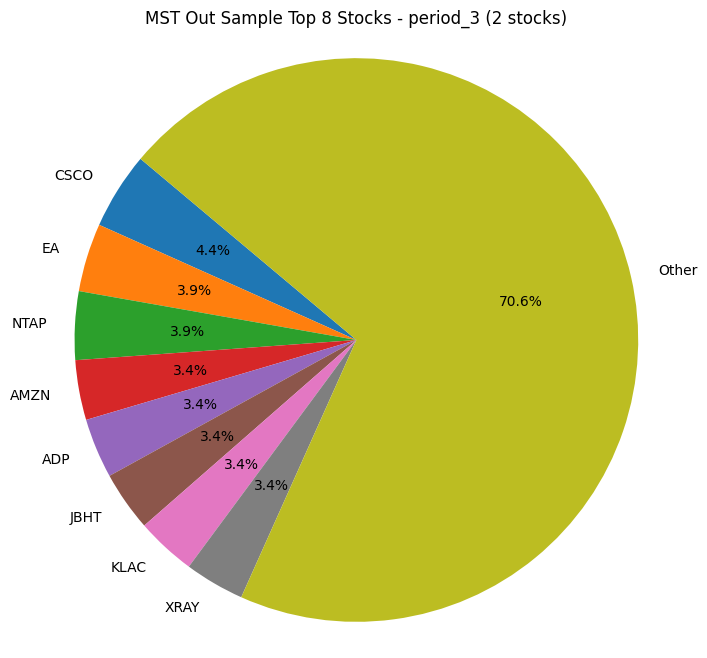

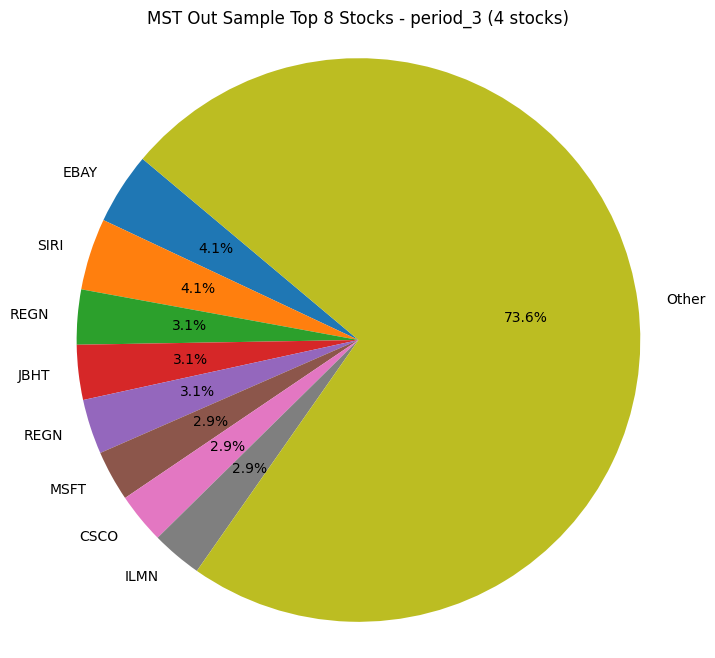

...

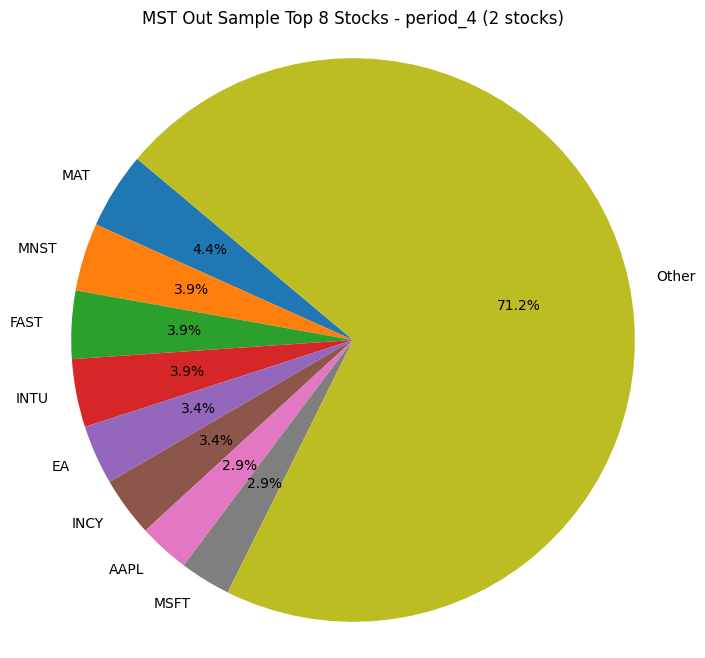

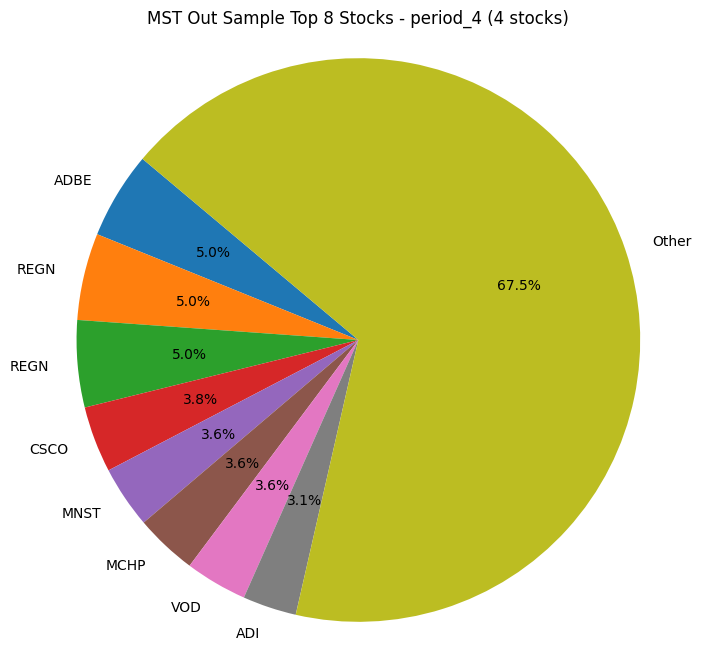

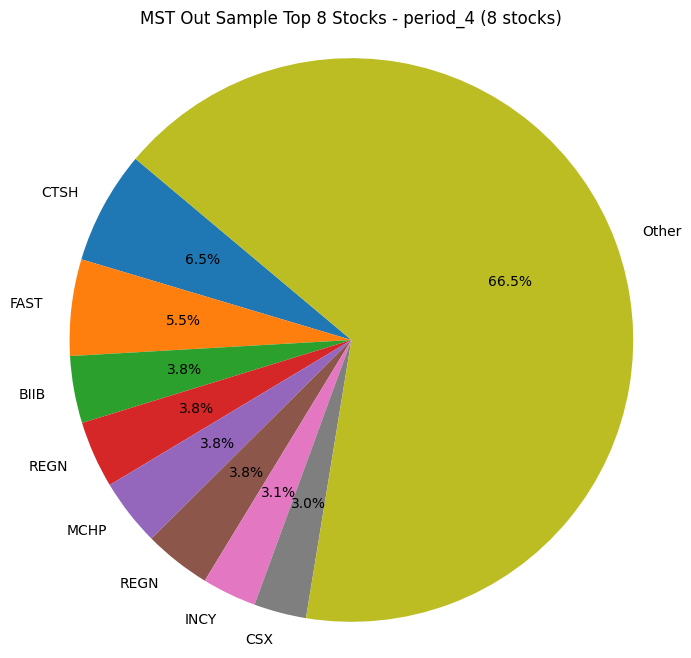

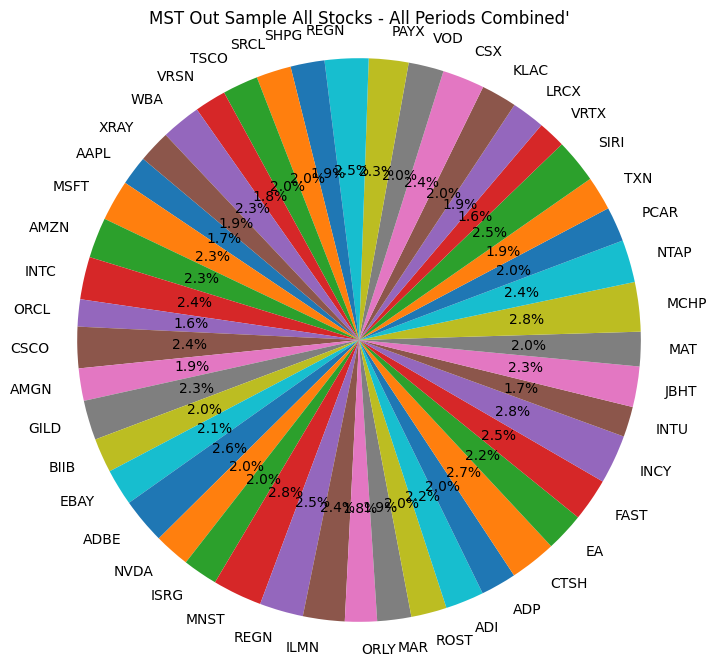

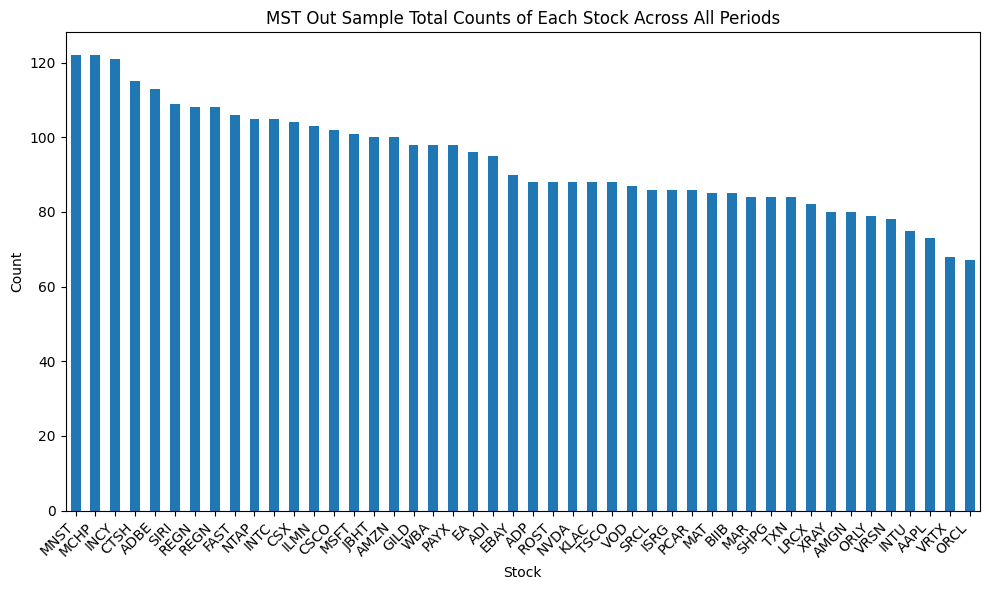

In [40]:
count_of_stocks(mst_result_df_clusters_out_sample, custom_tickers, "MST Out Sample")

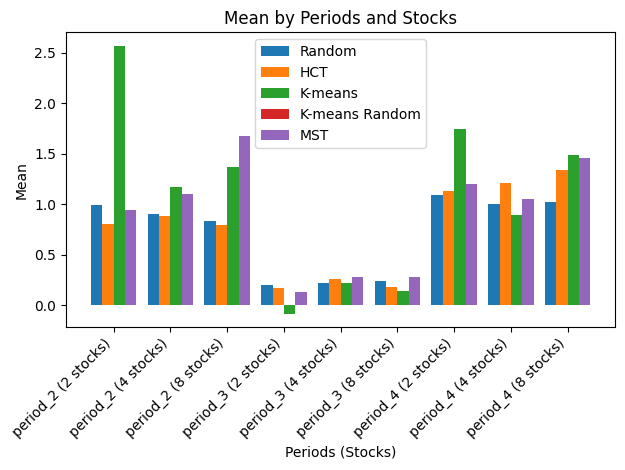

Total Average Mean of Random Values: 0.7216056241796647
Total Average Mean of Cluster Values: 0.7515395609578805
Total Average Mean of K-means Values: 1.0563022518380656
Total Average Mean of K-means Random Values: 0.9019159250353171
Total Average Mean of MST Values: 0.7467236525771231

Period 1 Average Mean of Random Values: 0.908426678588189
Period 1 Average Mean of Cluster Values: 0.8260737894825884
Period 1 Average Mean of K-means Values: 1.703659497558075
Period 1 Average Mean of K-means Random Values: 1.2408257980894488
Period 1 Average Mean of MST: 0.8989523424825304
Period 2 Average Mean of Random Values: 0.21989673942952392
Period 2 Average Mean of Cluster Values: 0.20225568897198073
Period 2 Average Mean of K-means Values: 0.09039048084292027
Period 2 Average Mean of K-means Random Values: 0.2293409235882987
Period 2 Average Mean of MST: 0.2191469084371306
Period 3 Average Mean of Random Values: 1.0364934545212807
Period 3 Average Mean of Cluster Values: 1.2262892044190723
Pe

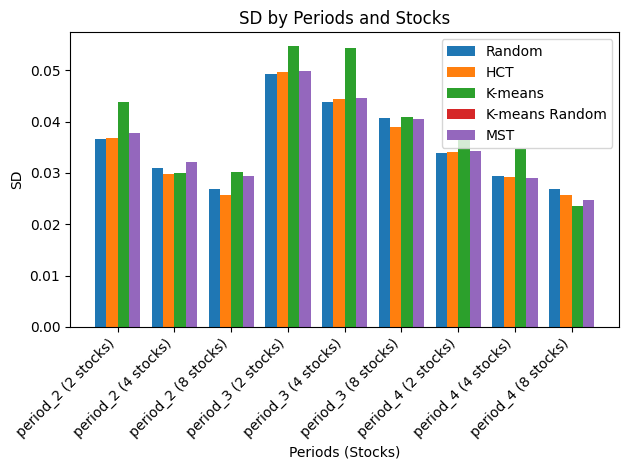

Total Average SD of Random Values: 0.03540181340743365
Total Average SD of Cluster Values: 0.034890521603665375
Total Average SD of K-means Values: 0.03881299276626892
Total Average SD of K-means Random Values: 0.035822406850738224
Total Average SD of MST Values: 0.03575793625262672

Period 1 Average SD of Random Values: 0.031474890807162446
Period 1 Average SD of Cluster Values: 0.03073206830452041
Period 1 Average SD of K-means Values: 0.03466947562034512
Period 1 Average SD of K-means Random Values: 0.033133973614209375
Period 1 Average SD of MST: 0.03125960387005131
Period 2 Average SD of Random Values: 0.04465502684524889
Period 2 Average SD of Cluster Values: 0.04430505127484269
Period 2 Average SD of K-means Values: 0.04999329441921164
Period 2 Average SD of K-means Random Values: 0.045040098009881256
Period 2 Average SD of MST: 0.04543469514276836
Period 3 Average SD of Random Values: 0.03007552256988959
Period 3 Average SD of Cluster Values: 0.02963444523163304
Period 3 Averag

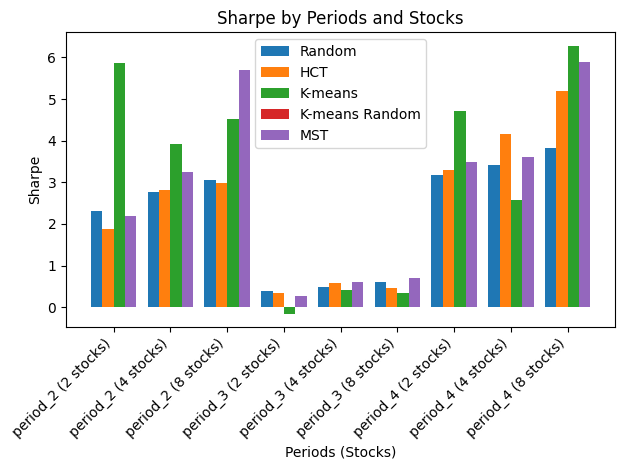

Total Average Sharpe of Random Values: 2.2265533114353264
Total Average Sharpe of Cluster Values: 2.410816095421357
Total Average Sharpe of K-means Values: 3.161792427624061
Total Average Sharpe of K-means Random Values: 2.8553789353072587
Total Average Sharpe of MST Values: 2.2844041752274404

Period 1 Average Sharpe of Random Values: 2.713277964238674
Period 1 Average Sharpe of Cluster Values: 2.556694845527441
Period 1 Average Sharpe of K-means Values: 4.7683907325669965
Period 1 Average Sharpe of K-means Random Values: 3.7150489395679656
Period 1 Average Sharpe of MST: 2.6715252374300587
Period 2 Average Sharpe of Random Values: 0.49269499094039193
Period 2 Average Sharpe of Cluster Values: 0.4628706586699276
Period 2 Average Sharpe of K-means Values: 0.1936237754474098
Period 2 Average Sharpe of K-means Random Values: 0.518465033820938
Period 2 Average Sharpe of MST: 0.4743846049066323
Period 3 Average Sharpe of Random Values: 3.473686979126915
Period 3 Average Sharpe of Cluster V

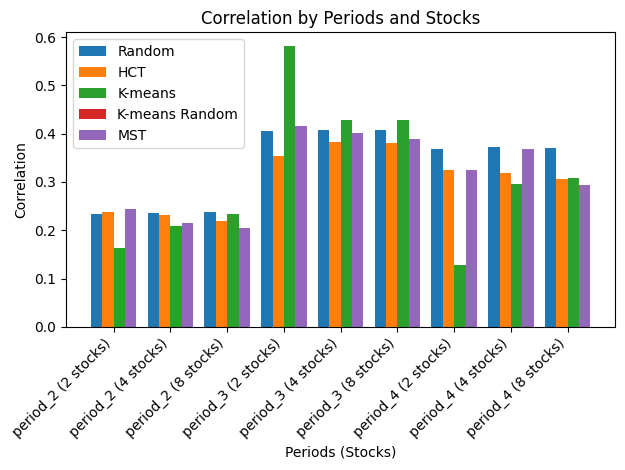

Total Average Correlation of Random Values: 0.33761417715869474
Total Average Correlation of Cluster Values: 0.3063684167893117
Total Average Correlation of K-means Values: 0.30840730782065573
Total Average Correlation of K-means Random Values: 0.3176409011552421
Total Average Correlation of MST Values: 0.3403584132750519

Period 1 Average Correlation of Random Values: 0.23618087215983727
Period 1 Average Correlation of Cluster Values: 0.22943730201904333
Period 1 Average Correlation of K-means Values: 0.20212465810953326
Period 1 Average Correlation of K-means Random Values: 0.22139100183461935
Period 1 Average Correlation of MST: 0.23764133810769492
Period 2 Average Correlation of Random Values: 0.40618161051460144
Period 2 Average Correlation of Cluster Values: 0.3724220922887284
Period 2 Average Correlation of K-means Values: 0.47870461406586506
Period 2 Average Correlation of K-means Random Values: 0.4022295226400436
Period 2 Average Correlation of MST: 0.41419867585962405
Period 

In [41]:
# Plotting Mean
plot_metric('Mean',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting SD
plot_metric('SD',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

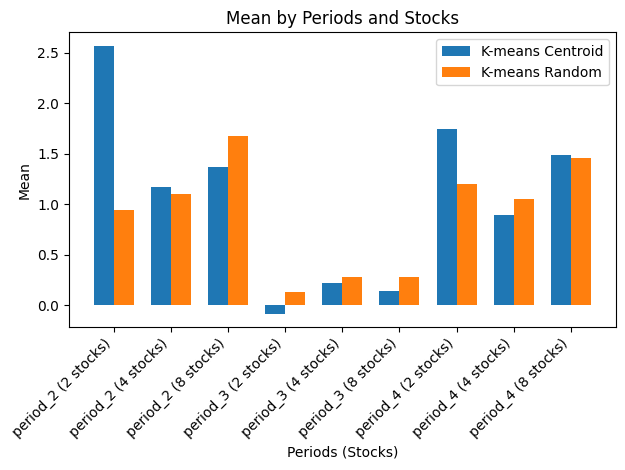

Total Average Mean of K-means Centroid Values: 1.0563022518380656
Total Average Mean of K-means Random Values: 0.9019159250353171

Period 1 Average Mean of K-means Centroid Values: 1.703659497558075
Period 1 Average Mean of K-means Random Values: 1.2408257980894488
Period 2 Average Mean of K-means Centroid Values: 0.09039048084292027
Period 2 Average Mean of K-means Random Values: 0.2293409235882987
Period 3 Average Mean of K-means Centroid Values: 1.374856777113201
Period 3 Average Mean of K-means Random Values: 1.235581053428204


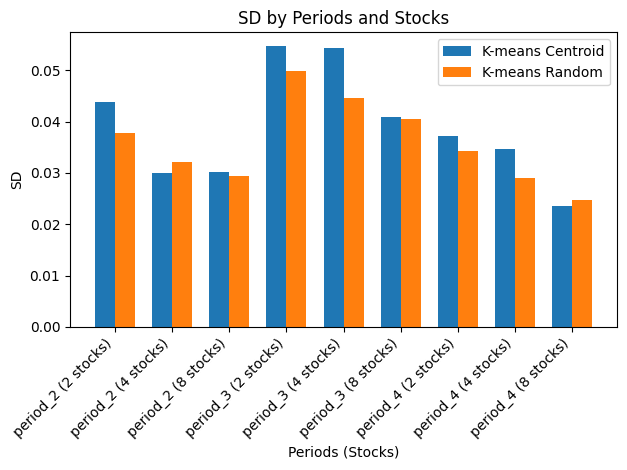

Total Average SD of K-means Centroid Values: 0.03881299276626892
Total Average SD of K-means Random Values: 0.035822406850738224

Period 1 Average SD of K-means Centroid Values: 0.03466947562034512
Period 1 Average SD of K-means Random Values: 0.033133973614209375
Period 2 Average SD of K-means Centroid Values: 0.04999329441921164
Period 2 Average SD of K-means Random Values: 0.045040098009881256
Period 3 Average SD of K-means Centroid Values: 0.03177620825925002
Period 3 Average SD of K-means Random Values: 0.02929314892812405


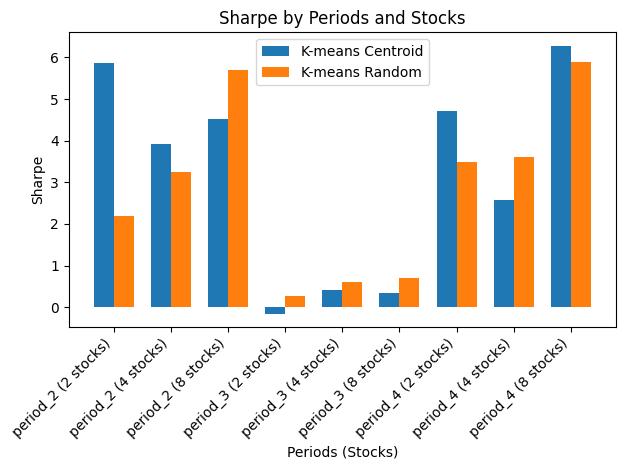

Total Average Sharpe of K-means Centroid Values: 3.161792427624061
Total Average Sharpe of K-means Random Values: 2.8553789353072587

Period 1 Average Sharpe of K-means Centroid Values: 4.7683907325669965
Period 1 Average Sharpe of K-means Random Values: 3.7150489395679656
Period 2 Average Sharpe of K-means Centroid Values: 0.1936237754474098
Period 2 Average Sharpe of K-means Random Values: 0.518465033820938
Period 3 Average Sharpe of K-means Centroid Values: 4.523362774857778
Period 3 Average Sharpe of K-means Random Values: 4.332622832532873


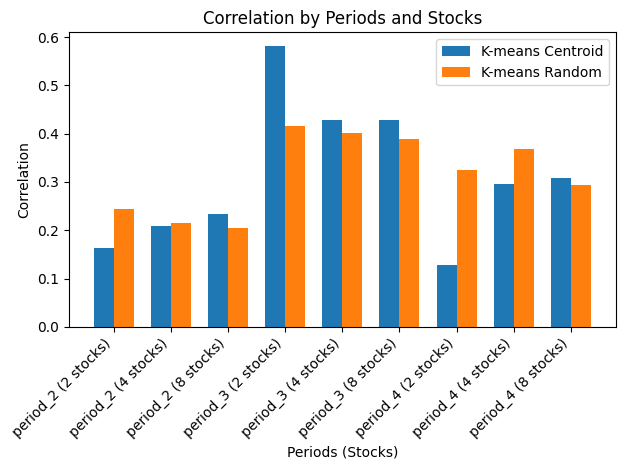

Total Average Correlation of K-means Centroid Values: 0.30840730782065573
Total Average Correlation of K-means Random Values: 0.3176409011552421

Period 1 Average Correlation of K-means Centroid Values: 0.20212465810953326
Period 1 Average Correlation of K-means Random Values: 0.22139100183461935
Period 2 Average Correlation of K-means Centroid Values: 0.47870461406586506
Period 2 Average Correlation of K-means Random Values: 0.4022295226400436
Period 3 Average Correlation of K-means Centroid Values: 0.24439265128656876
Period 3 Average Correlation of K-means Random Values: 0.3293021789910632


In [42]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test1,result_df_kmeans_rand_test1)